#Imports

In [ ]:
!pip install rdkit

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.2/37.2 MB 37.5 MB/s eta 0:00:00


In [ ]:
#general
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import gdown
from pathlib import Path
from google.colab import drive
import json

#warninigs
from typing import Callable, List, Dict
import warnings
#Stats
from scipy.spatial.distance import pdist, squareform

#Rdkit
from rdkit import Chem
from rdkit.Chem import rdMolDescriptors
from rdkit.Chem import Draw
from IPython.display import display
from rdkit.ML.Cluster import Butina
from rdkit.DataStructs import FingerprintSimilarity
from rdkit.Chem import Draw, MolFromSmiles, CanonSmiles, MolToSmiles,rdFingerprintGenerator, Mol


# Sklearm
from sklearn.preprocessing import OrdinalEncoder, StandardScaler, MinMaxScaler
from sklearn.cluster import DBSCAN,HDBSCAN
from sklearn.metrics import calinski_harabasz_score, davies_bouldin_score, silhouette_score
from sklearn.manifold import TSNE
from sklearn.decomposition import LatentDirichletAllocation
from matplotlib.lines import Line2D


%load_ext google.colab.data_table
warnings.filterwarnings("ignore")
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
data_folder = Path(r'/content/drive/MyDrive/_collab_GP/Dataset/Validation datasets')
# saving_folder = Path(r'/content/drive/MyDrive/_collab_GP/Dataset/Validation datasets')

In [ ]:
from matplotlib import rcParams
font_size=16
# Set global font sizes
rcParams.update({
    'axes.titlesize': font_size+2,       # Title font size
    'axes.labelsize': font_size,       # X and Y label font size
    'xtick.labelsize': font_size-2,      # X tick label font size
    'ytick.labelsize': font_size-2,      # Y tick label font size
    'legend.fontsize': font_size-1,      # Legend font size
    'font.size': font_size            # Default font size
})

# Genral functions

In [ ]:
#------------Missing Vis-------------------

def plot_missingness_by_groups(df, feature_space, figsize=(10, 6)):
    """
    Show missing percentage and count of features grouped by categories.

    Parameters
    ----------
    df : pandas.DataFrame
        Your dataset.
    feature_space : dict or list
        - dict: mapping group names to lists of features (colored by group)
        - list/tuple: flat list of features (single color, no legend)
    """
    if isinstance(feature_space, dict):
        groups = feature_space
        flat_mode = False
    elif isinstance(feature_space, (list, tuple)):
        groups = {"Features": list(feature_space)}
        flat_mode = True
    else:
        raise TypeError("feature_space must be a dict or a list/tuple")

    results = []
    datapoints = len(df)
    for group, features in groups.items():
        for feat in features:
            if feat in df.columns:
                missing_count = df[feat].isna().sum()
                missing_pct = 100 * missing_count / datapoints
                results.append({
                    "Group": group,
                    "Feature": feat,
                    "Missing Count": missing_count,
                    "Missing %": missing_pct,
                })

    summary = pd.DataFrame(results).sort_values("Missing %", ascending=False)

    plt.figure(figsize=figsize)
    if flat_mode:
        sns.barplot(
            data=summary,
            y="Feature", x="Missing %",
            color="steelblue",
        )
    else:
        sns.barplot(
            data=summary,
            y="Feature", x="Missing %",
            hue="Group",
            dodge=False,
            palette="Set2",
        )
        plt.legend(title="Group", loc="lower right")

    plt.xlabel("Missing %")
    plt.ylabel("Feature")
    plt.title("Missing Data")
    plt.tight_layout()
    plt.show()

    return summary



    def plot_distribution(data, feature, fontsize=14, figsize=(6, 4)):
      plt.figure(figsize=figsize)

      # Histogram only (barplot style)
      sns.histplot(data[feature], kde=False, bins=30, color='#ACD4DC')

      plt.ylabel('Occurrence', fontsize=fontsize, fontweight='bold')
      plt.xlabel(feature, fontsize=fontsize, fontweight='bold')
      plt.tick_params(labelsize=fontsize)

      plt.tight_layout()
      plt.show()


In [ ]:
def distribution_plot(df: pd.DataFrame, parameters: List[str], log_cutoff: int = 200, columns_per_row: int = 2,
                      figsize=(16, 10.5), title: str = "Distribution Plots"
                      )->None:
    num_plots = len(parameters)
    num_rows = (num_plots - 1) // columns_per_row + 1
    fig, axes = plt.subplots(nrows=num_rows, ncols=columns_per_row, figsize=figsize)
    fig.suptitle(title, fontsize=30, fontweight='bold')
    if num_rows == 1:
        axes = axes.reshape(1, -1)

    for i, column in enumerate(parameters):
        row_idx = i // columns_per_row
        col_idx = i % columns_per_row

        # Determine the main plot
        data_range = df[column].max() - df[column].min()
        if data_range >= log_cutoff:
            data = np.log10(df[column])
            xlabel = f'log {column}'
        else:
            data = df[column]
            xlabel = column

        # Histogram plot
        sns.histplot(data, ax=axes[row_idx, col_idx], kde=False, color="#8EA8DD")

        axes[row_idx, col_idx].set_xlabel(xlabel, fontsize=20, fontweight='bold')
        axes[row_idx, col_idx].set_ylabel('occurrence ', fontsize=20, fontweight='bold')
        axes[row_idx, col_idx].tick_params(axis='both', labelsize=18)
        # Box plot as inset
        box_inset = axes[row_idx, col_idx].inset_axes([0.01, -0.5, 0.99, 0.2])  # Adjust position for the inset box plot
        sns.boxplot(x=data, ax=box_inset,color="#8EA8DD")
        box_inset.set(yticks=[], xlabel=None)  # Remove y-ticks and x-label from the box plot
        box_inset.tick_params(axis='x', labelsize=18)

    # Remove any unused subplots
    for j in range(i + 1, num_rows * columns_per_row):
        row_idx = j // columns_per_row
        col_idx = j % columns_per_row
        fig.delaxes(axes[row_idx, col_idx])

    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()

In [ ]:
from sklearn.impute import SimpleImputer
from typing import List, Optional

# Function to drop specified columns
def drop_columns(df: pd.DataFrame, columns_to_drop: List) -> pd.DataFrame:
    return df.drop(columns=columns_to_drop)

# Function to calculate Mw where it is missing
def calculate_mw(df: pd.DataFrame, mw: str, mn: str, pdi: str) -> pd.DataFrame:
    df.loc[df[mw].isna(), mw] = df[pdi] * df[mn]
    return df

# Function to impute missing values in specified columns
def impute_columns(df: pd.DataFrame, columns: List[str], strategy: str = 'mean') -> pd.DataFrame:
    imputer = SimpleImputer(strategy=strategy)
    df[columns] = imputer.fit_transform(df[columns])
    return df

# Main preprocessing function
def preprocessing_workflow(
    data: pd.DataFrame,
    imputer: Optional[str] = None,
    feat_to_impute: Optional[List[str]] = None,
    special_column: Optional[str] = None,
) -> pd.DataFrame:
    # Step 1: Impute missing values for specified features
    df=data.copy()
    if imputer and feat_to_impute:
        df = impute_columns(df, feat_to_impute, strategy=imputer)

    # Step 2: Calculate missing values for the special column (e.g., Mw)
    if special_column:
        df = calculate_mw(df, mw=special_column, mn='Mn (g/mol)', pdi='PDI')
        # Impute any remaining missing values in the special column
        df = impute_columns(df, [special_column], strategy=imputer)


    return df

ECFP generator

In [ ]:
def canonicalize_columns(data: pd.DataFrame, column: str) -> pd.DataFrame:
    def canon_smiles(smiles):
        mol = MolFromSmiles(smiles)
        return MolToSmiles(mol, canonical=True) if mol else None
    new_data = data.copy()
    new_data[column] = new_data[column].apply(canon_smiles)
    return new_data
def generate_ECFP_fingerprint(mol, radius: int = 3, nbits: int = 1024,count_vector:bool=True) -> np.array:
    """
    Generate ECFP fingerprint.

    Args:
        mol: RDKit Mol object
        radius: Fingerprint radius
        nbits: Number of bits in fingerprint

    Returns:
        ECFP fingerprint as numpy array
    """
    if count_vector:
      fingerprint: np.array = rdFingerprintGenerator.GetMorganGenerator(radius=radius, fpSize=nbits, includeChirality=False,countSimulation=False).GetCountFingerprintAsNumPy(mol)
    else:
      fingerprint: np.array = rdFingerprintGenerator.GetMorganGenerator(radius=radius, fpSize=nbits, includeChirality=False,countSimulation=False).GetFingerprintAsNumPy(mol)

    return fingerprint

In [ ]:
class ECFP_Processor:

    def __init__(self, smile_source: pd.DataFrame,
                 column:str,new_unit_name:str) -> None:
        self.smile_source = smile_source.copy()
        self.new_unit_name = new_unit_name
        self.oligomer_represenation =column
        canonicalize_columns(self.smile_source,self.oligomer_represenation)
        self.all_mols: pd.Series = self.smile_source[self.oligomer_represenation].map(lambda smiles: MolFromSmiles(smiles))



    def assign_ECFP(self, radius: int = 3, nbits: int = 1024, count_vector:bool=True) -> None:
        """
        Assigns ECFP fingerprints to the dataset.
        """
        if count_vector:
            vector_type = 'count'
        else:
            vector_type = 'binary'

        # new_name: str = " ".join(self.oligomer_represenation.split()[:-1])
        self.smile_source[f"{self.new_unit_name}_ECFP{2 * radius}_{vector_type}_{nbits}bits"] = self.all_mols.map(
                          lambda mol: generate_ECFP_fingerprint(mol, radius, nbits, count_vector=count_vector))
        print(f"Done with generating {self.new_unit_name}_ECFP{2 * radius}_{vector_type}_{nbits}bits")


    def main_ecfp(self, fp_radii: list[int], fp_bits: list[int],count_vector:bool=True) -> pd.DataFrame:

        for r, b in zip(fp_radii,fp_bits):
            self.assign_ECFP(radius=r, nbits=b, count_vector=count_vector)
        return self.smile_source

In [ ]:
def unroll_lists_to_columns(df: pd.DataFrame, unroll_cols: list[str], new_col_names: list[str]) -> pd.DataFrame:
    """
    Unroll a list of lists into columns of a DataFrame.

    Args:
        df: DataFrame to unroll.
        unroll_cols: List of columns containing list to unroll.
        new_col_names: List of new column names.

    Returns:
        DataFrame with unrolled columns.
    """
    rolled_cols: pd.DataFrame = df[unroll_cols]
    # rolled_cols: pd.DataFrame = df
    unrolled_df: pd.DataFrame = pd.concat([rolled_cols[col].apply(pd.Series) for col in rolled_cols.columns], axis=1)
    unrolled_df.columns = new_col_names
    return unrolled_df


def unroll_ECFP(df: pd.DataFrame, col_names: list[str], unit_name:str ,
                vector_type:str ,radius: int = 0, n_bits: int = 0,**kwargs) -> pd.DataFrame:
    new_ecfp_col_names = [
        f"{uni}_ECFP{2 * radius}_{vector_type}_bit{i}"
        for uni in unit_name
        for i in range(n_bits)
    ]
    new_df: pd.DataFrame = unroll_lists_to_columns(df, col_names, new_ecfp_col_names)
    return new_df

In [ ]:
radius_to_bits: dict[int, int] = {3: 512, 4: 1024, 5: 2048, 6: 4096}

def get_structural_info(fp:str,poly_unit_name:list[str],radius:int=None,vector:str=None):

        if fp == "Mordred" or fp == "MACCS":
            fp_features = [f"{unit}_{fp}" for unit in poly_unit_name]
            unrolling_featurs = {"representation": fp,
                                "unit_name":poly_unit_name,
                                "col_names": fp_features}
            return fp_features, unrolling_featurs

        if fp == "ECFP":
            n_bits = radius_to_bits[radius]
            fp_features = [
                        f"{unit}_{fp}{2 * radius}_{vector}_{n_bits}bits"
                        for unit in poly_unit_name
                        ]
            unrolling_featurs = {
                                "representation": fp,
                                "radius": radius,
                                "n_bits": n_bits,
                                "vector_type": vector,
                                "unit_name": poly_unit_name,
                                "col_names": fp_features,
                                }
            return fp_features, unrolling_featurs
        else:
              return None, None

Illustrate the material structures

In [ ]:
def display_molecules(df, smiles_column:str=None, poly_name_col:str=None):
    molecules = []
    captions = []
    for _, row in df.iterrows():
        smiles = row[smiles_column]

        mol = Chem.MolFromSmiles(smiles)

        if mol:
            molecules.append(mol)
            captions.append(f"{row[poly_name_col]}")


    options = Draw.MolDrawOptions()
    options.legendFontSize = 70

    img = Draw.MolsToGridImage(
        molecules,
        legends=captions,
        molsPerRow=6,
        subImgSize=(1000, 1000),  # Image size for each molecule,
        drawOptions=options
    )
    display(img)

metrics

In [ ]:
def weighted_jaccard(u, v,eps: float = 1e-6):
    min_sum = np.sum(np.minimum(u, v))
    max_sum = np.sum(np.maximum(u, v))
    return 1 - ((min_sum+eps) / (max_sum+eps))

#Load processed data

## *Beyond molecular structure: critically assessing machine learning for designing organic photovoltaic materials and devices*

Specification

*   558 datapoints
*   143 unique donor polymers, and 261 unique acceptor molecules



https://doi.org/10.1039/D4TA01942C

###Clone

In [ ]:
!git clone https://github.com/aspuru-guzik-group/Beyond-Molecular-Structure-ML-for-OPV-Materials-Devices.git


Cloning into 'Beyond-Molecular-Structure-ML-for-OPV-Materials-Devices'...
remote: Enumerating objects: 19540, done.
remote: Total 19540 (delta 0), reused 0 (delta 0), pack-reused 19540 (from 1)
Receiving objects: 100% (19540/19540), 1.41 GiB | 26.86 MiB/s, done.
Resolving deltas: 100% (7905/7905), done.
Updating files: 100% (1439/1439), done.


In [ ]:
%cd Beyond-Molecular-Structure-ML-for-OPV-Materials-Devices


/content/Beyond-Molecular-Structure-ML-for-OPV-Materials-Devices


In [ ]:
%cd datasets/Min_2020_n558/


/content/Beyond-Molecular-Structure-ML-for-OPV-Materials-Devices/datasets/Min_2020_n558


In [ ]:
%ls

'clean donors.csv'                  'cleaned donors.csv'
'cleaned acceptors.csv'             'cleaned r groups.csv'
 cleaned_dataset.csv                 feature_types.json
 cleaned_dataset_gnnembeddings.pkl   get_dataset_stats.py
 cleaned_dataset_mordred.pkl         mordred_descriptors.csv
 cleaned_dataset_nans.pkl            mordred_descriptors.json
 cleaned_dataset.pkl                 raw/
 cleaned_dataset_stats.csv           selected_properties.json


In [ ]:
raw = pd.read_pickle('cleaned_dataset.pkl')

In [ ]:
raw.columns.to_list()

['DOI',
 'Donor',
 'Donor PDI',
 'Donor Mn (kDa)',
 'Donor Mw (kDa)',
 'HOMO_D (eV)',
 'LUMO_D (eV)',
 'Ehl_D (eV)',
 'Eg_D (eV)',
 'Acceptor',
 'HOMO_A (eV)',
 'LUMO_A (eV)',
 'Ehl_A (eV)',
 'Eg_A (eV)',
 'D:A ratio (m/m)',
 'solvent',
 'Active layer spin coating speed (rpm)',
 'total solids conc. (mg/mL)',
 'solvent additive',
 'solvent additive conc. (% v/v)',
 'active layer thickness (nm)',
 'temperature of thermal annealing',
 'annealing time (min)',
 'HTL',
 'HTL energy level (eV)',
 'HTL thickness (nm)',
 'ETL',
 'ETL energy level (eV)',
 'ETL thickness (nm)',
 'hole mobility blend (cm^2 V^-1 s^-1)',
 'electron mobility blend (cm^2 V^-1 s^-1)',
 'Voc (V)',
 'Jsc (mA cm^-2)',
 'FF (%)',
 'PCE (%)',
 'hole:electron mobility ratio',
 'log hole mobility blend (cm^2 V^-1 s^-1)',
 'log electron mobility blend (cm^2 V^-1 s^-1)',
 'log hole:electron mobility ratio',
 'calculated PCE (%)',
 'solvent descriptors',
 'solvent token',
 'solvent additive descriptors',
 'solvent additive token

In [ ]:
raw = pd.DataFrame = ECFP_Processor(raw, column='Donor SMILES',new_unit_name='Donor').main_ecfp([3], [512], count_vector= True)
raw = pd.DataFrame = ECFP_Processor(raw, column='Acceptor SMILES',new_unit_name='Acceptor').main_ecfp([3], [512], count_vector= True)

Done with generating Donor_ECFP6_count_512bits
Done with generating Acceptor_ECFP6_count_512bits


In [ ]:
raw.describe()

,Donor PDI,Donor Mn (kDa),Donor Mw (kDa),HOMO_D (eV),LUMO_D (eV),Ehl_D (eV),Eg_D (eV),HOMO_A (eV),LUMO_A (eV),Ehl_A (eV),...,Jsc (mA cm^-2),FF (%),PCE (%),hole:electron mobility ratio,log hole mobility blend (cm^2 V^-1 s^-1),log electron mobility blend (cm^2 V^-1 s^-1),log hole:electron mobility ratio,calculated PCE (%),solvent token,solvent additive token
count,202.000000,185.000000,106.000000,558.000000,558.000000,558.000000,558.000000,558.000000,558.000000,558.000000,...,558.000000,558.000000,558.000000,446.000000,456.000000,460.000000,446.000000,558.000000,558.000000,558.000000
mean,2.151951,41.206335,89.590070,-5.303744,-3.404756,1.898988,1.789274,-5.560421,-3.870982,1.689439,...,15.070206,0.615575,8.444391,33.608315,-3.789064,-4.020931,0.234079,8.429354,13.845878,1.971326
std,0.716830,32.882015,73.713145,0.122705,0.199638,0.184837,0.131023,0.158705,0.164135,0.191380,...,4.742933,0.098743,3.089182,440.662939,0.760031,0.850190,0.688429,3.097585,5.095276,1.698844
min,1.180000,6.970000,13.400000,-5.680000,-3.750000,1.570000,1.480000,-6.380000,-4.230000,1.100000,...,0.050000,0.236000,0.010000,0.009143,-7.356547,-8.958607,-2.038918,0.013635,0.000000,0.000000
25%,1.802500,22.900000,49.225000,-5.360000,-3.538333,1.810000,1.750000,-5.666667,-3.950000,1.572500,...,12.720000,0.570000,6.402500,0.750000,-4.103756,-4.364267,-0.124939,6.414124,10.000000,1.000000
50%,2.000000,30.000000,63.600000,-5.298824,-3.427297,1.871526,1.768182,-5.576000,-3.909444,1.660000,...,15.965000,0.631800,9.050000,1.518806,-3.697887,-3.871281,0.181493,9.022853,13.000000,1.000000
75%,2.317500,44.000000,111.929250,-5.210000,-3.420000,1.977500,1.900000,-5.462500,-3.808000,1.760000,...,17.900000,0.689250,10.662500,3.301242,-3.345343,-3.478222,0.518677,10.637925,19.000000,3.000000
max,8.590000,180.400000,364.900000,-5.010000,-2.780000,2.790000,2.120000,-5.018300,-2.830000,2.610000,...,26.600000,0.840000,15.700000,9090.909091,-1.568636,-2.008774,3.958607,15.707252,26.000000,20.000000


In [ ]:
raw.shape

(558, 70)

In [ ]:
data_folder = Path(r'/content/drive/MyDrive/_collab_GP/Dataset')
raw.to_pickle(saving_folder/'Beyond molecular structure_seifrid.pkl')


###Analysis

In [ ]:

cleaned_data = pd.read_pickle(data_folder/'Beyond molecular structure: critically assessing machine learning for designing organic photovoltaic materials and devices'/'Beyond molecular structure_seifrid.pkl')


In [ ]:
cleaned_data.columns.to_list()

['DOI',
 'Donor',
 'Donor PDI',
 'Donor Mn (kDa)',
 'Donor Mw (kDa)',
 'HOMO_D (eV)',
 'LUMO_D (eV)',
 'Ehl_D (eV)',
 'Eg_D (eV)',
 'Acceptor',
 'HOMO_A (eV)',
 'LUMO_A (eV)',
 'Ehl_A (eV)',
 'Eg_A (eV)',
 'D:A ratio (m/m)',
 'solvent',
 'Active layer spin coating speed (rpm)',
 'total solids conc. (mg/mL)',
 'solvent additive',
 'solvent additive conc. (% v/v)',
 'active layer thickness (nm)',
 'temperature of thermal annealing',
 'annealing time (min)',
 'HTL',
 'HTL energy level (eV)',
 'HTL thickness (nm)',
 'ETL',
 'ETL energy level (eV)',
 'ETL thickness (nm)',
 'hole mobility blend (cm^2 V^-1 s^-1)',
 'electron mobility blend (cm^2 V^-1 s^-1)',
 'Voc (V)',
 'Jsc (mA cm^-2)',
 'FF (%)',
 'PCE (%)',
 'hole:electron mobility ratio',
 'log hole mobility blend (cm^2 V^-1 s^-1)',
 'log electron mobility blend (cm^2 V^-1 s^-1)',
 'log hole:electron mobility ratio',
 'calculated PCE (%)',
 'solvent descriptors',
 'solvent token',
 'solvent additive descriptors',
 'solvent additive token

In [ ]:
# plot_distribution_with_box(clean_rg, feature='Rg1 (nm)',fontsize=16)


In [ ]:
device_architecture =  ["material properties", "fabrication", "device architecture"]

feature_space = {
              "material properties": [
                    "HOMO_D (eV)",
                    "LUMO_D (eV)",
                    "Eg_D (eV)",
                    "Ehl_D (eV)",
                    "HOMO_A (eV)",
                    "LUMO_A (eV)",
                    "Eg_A (eV)",
                    "Ehl_A (eV)"
                  ],

              "fabrication": [
                    "D:A ratio (m/m)",
                    "solvent additive conc. (% v/v)",
                    "temperature of thermal annealing"
                  ],

              "device architecture": [
                    "HTL energy level (eV)",
                    "ETL energy level (eV)"
                  ],
              "performance measurment":[
                  # 'calculated PCE (%)'
              ]

              }

all_features = [item for sublist in feature_space.values() for item in sublist]

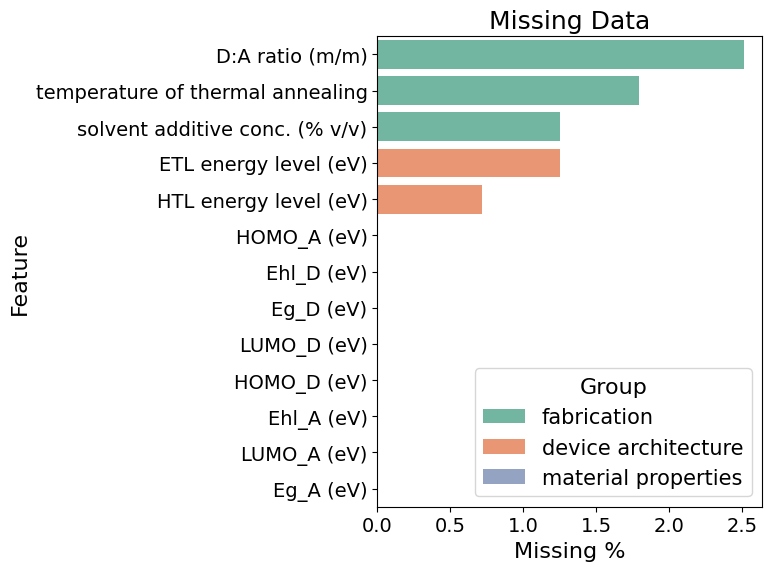

In [ ]:
summary_table = plot_missingness_by_groups(cleaned_data, feature_space,figsize=(8,6))


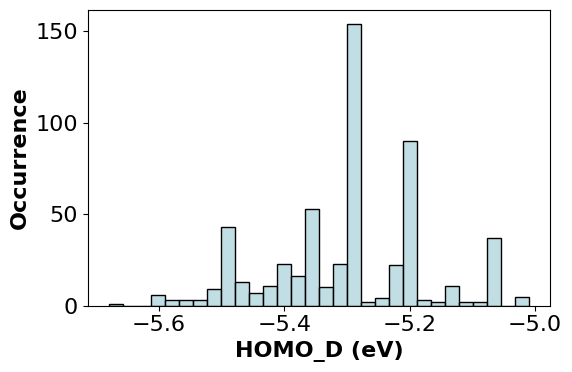

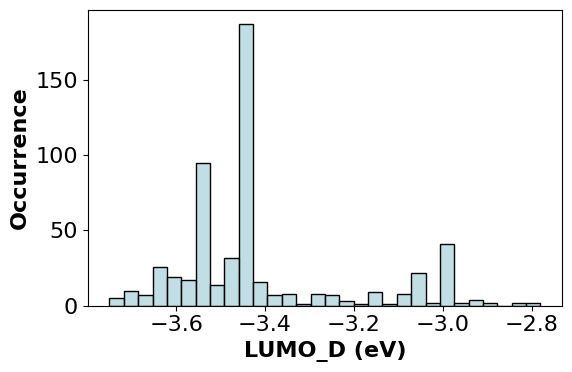

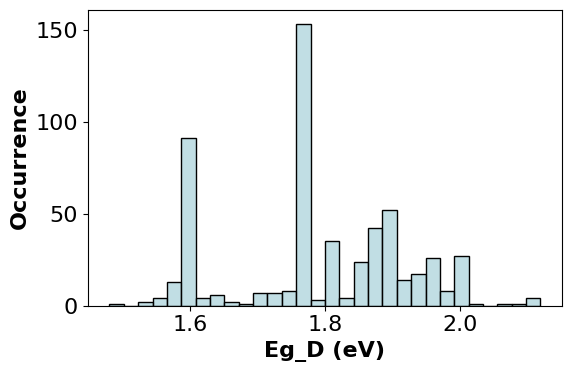

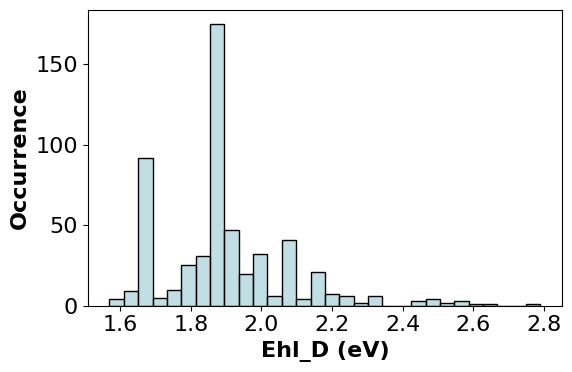

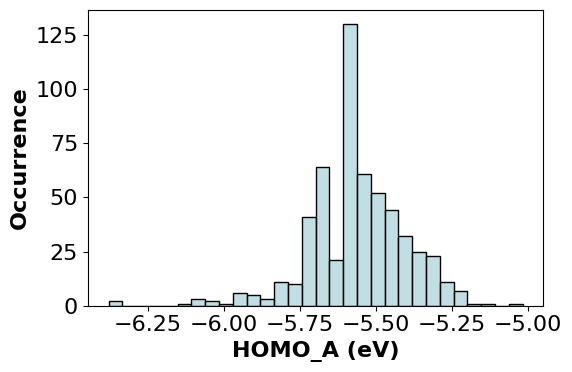

...

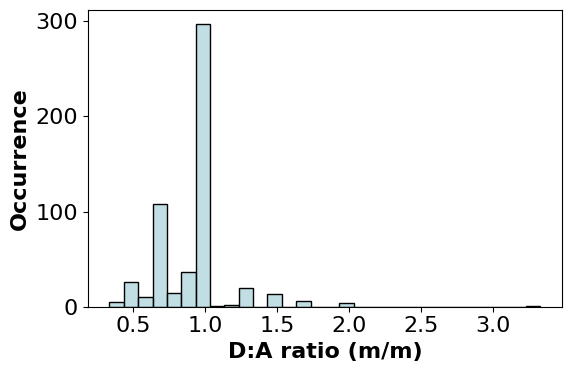

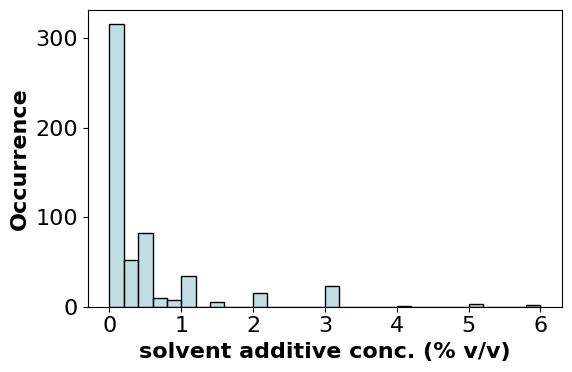

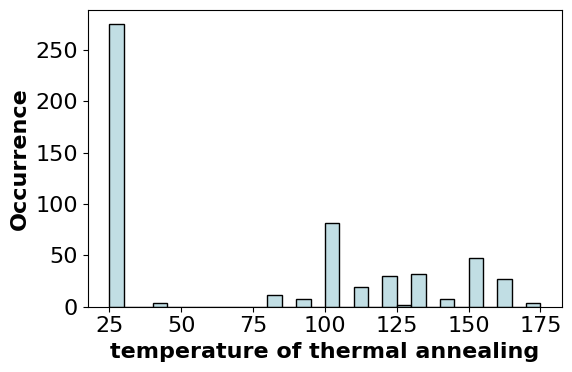

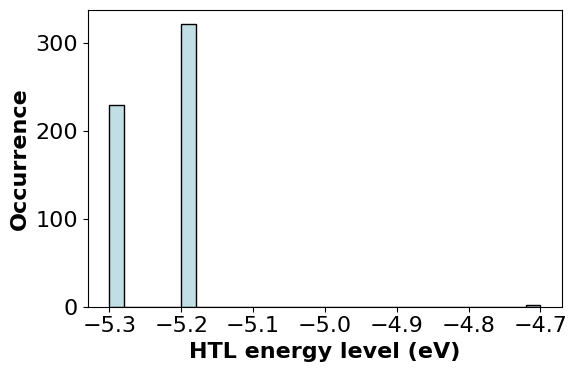

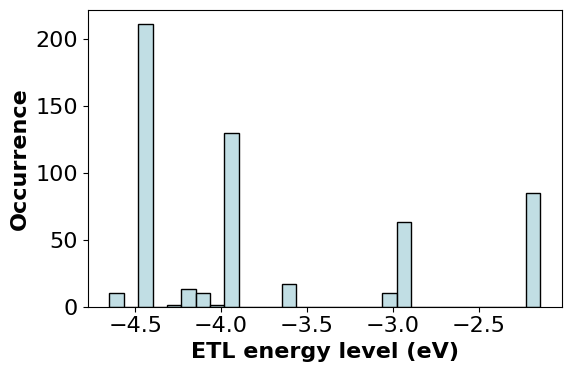

In [ ]:
for group, features in feature_space.items():
  for feat in features:
      plot_distribution(cleaned_data, feature=feat,fontsize=16)

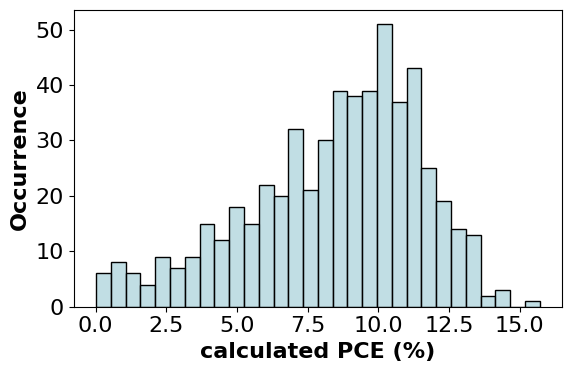

In [ ]:
plot_distribution(cleaned_data, feature='calculated PCE (%)',fontsize=16)

###Pre-processing

In [ ]:
imputed_clean_data = cleaned_data.copy()
imputed_clean_data = preprocessing_workflow(
                imputed_clean_data,
                imputer='mean',
                feat_to_impute=all_features,
        )

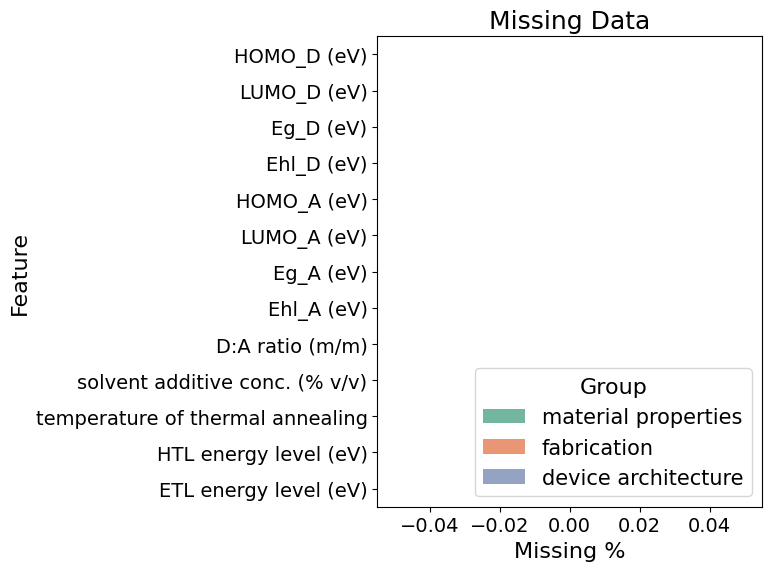

In [ ]:
summary_table = plot_missingness_by_groups(imputed_clean_data, feature_space,figsize=(8,6))


In [ ]:
imputed_clean_data.to_pickle(data_folder/'Beyond molecular structure: critically assessing machine learning for designing organic photovoltaic materials and devices'/'Beyond molecular structure_seifrid_imputed.pkl')
imputed_clean_data.to_csv(data_folder/'Beyond molecular structure: critically assessing machine learning for designing organic photovoltaic materials and devices'/'Beyond molecular structure_seifrid_imputed.csv')

### Analysis for OOD

In [ ]:
imputed_clean_data = pd.read_pickle(data_folder/'Beyond molecular structure: critically assessing machine learning for designing organic photovoltaic materials and devices'/'Beyond molecular structure_seifrid_imputed.pkl')

In [ ]:
#'Acceptor SMILES',
print('#Donors:', imputed_clean_data['Donor SMILES'].nunique())
print('#Acceptor:',imputed_clean_data['Acceptor SMILES'].nunique())
Donor_molecule = imputed_clean_data.drop_duplicates(subset=['Donor SMILES']).reset_index(drop=True)
Acceptor_molecule = imputed_clean_data.drop_duplicates(subset=['Acceptor SMILES']).reset_index(drop=True)


#Donors: 143
#Acceptor: 261


In [ ]:
display_molecules(Donor_molecule,"Donor SMILES", "Donor")

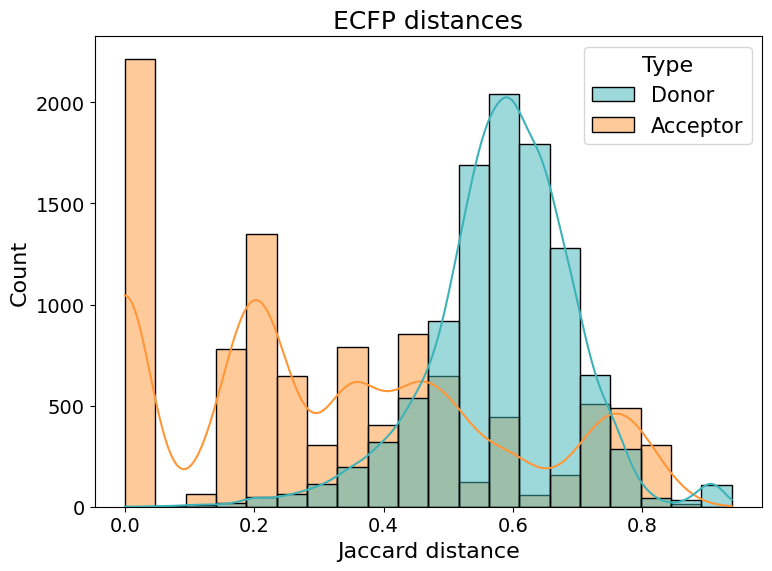

In [ ]:
Donor_array  = np.array(Donor_molecule['Donor_ECFP6_count_512bits'].tolist())
Acceptor_array  = np.array(Donor_molecule['Acceptor_ECFP6_count_512bits'].tolist())

# Compute pairwise distances
Donor_tanimoto_similarities = pdist(Donor_array, metric=weighted_jaccard)
Acceptor_tanimoto_similarities  = pdist(Acceptor_array, metric=weighted_jaccard)

# Build dataframe
data = pd.DataFrame({
    "Similarity": np.concatenate([Donor_tanimoto_similarities, Acceptor_tanimoto_similarities]),
    "Type": (["Donor"] * len(Donor_tanimoto_similarities)) +
            (["Acceptor"] * len(Acceptor_tanimoto_similarities))
})

palette = {"Donor": "#3DB3B9", "Acceptor": "#FF9637"}

# Plot
plt.figure(figsize=(8, 6))
sns.histplot(data=data, x="Similarity", hue="Type", kde=True, bins=20, palette=palette)
plt.title("ECFP distances")
plt.xlabel("Jaccard distance")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

generate csv for R

In [ ]:
numerical_df = imputed_clean_data[all_features]
fp_col, un_feats = get_structural_info('ECFP', ['Donor', 'Acceptor'],radius=3,vector='count')
strcutural_df = unroll_ECFP(imputed_clean_data[fp_col],**un_feats)
r_training_features: pd.DataFrame = pd.concat(
        [strcutural_df, numerical_df], axis=1
    )
r_training_features.to_csv(data_folder/'Beyond molecular structure: critically assessing machine learning for designing organic photovoltaic materials and devices'/'r_training_features.csv', index=False)

## *Machine Learning for Polymer Design to Enhance Pervaporation-Based Organic Recovery*

**Specification**


*   52 unique polymers and 32 types of organic solutes
*   2341 datapoints

**Targets**
* total flux J (kg m–2 h–1)
* separation factor βB/A.



https://doi.org/10.1021/acs.est.4c00060

###Clone & read data

In [ ]:
saving_folder=data_folder/'Machine Learning for Polymer Design to Enhance Pervaporation-Based Organic Recovery'
raw_data_pervaporation = pd.read_excel(saving_folder/'raw_data.xlsx')

###Analysis

In [ ]:
print('#polymers:', raw_data_pervaporation['smile'].nunique())
raw_data_pervaporation.head()

#polymers: 54


,ID,DOI,Abbrevation,smile,Selective_layer_thickness,Turbular,Plate,Filler_size,Filler_concentration,Crosslinker_concentration,Organic_Hildebrand_solubility_parameter,Organic_molecular_volume,Mass_ratio(A/B),Effluent_type,Effective_area,Experimental_temperature,Downstream_pressure,Separation_factor,Total_flux
0,1,10.1002/9781119418399.ch5,PVA,C([*])C([*])(O),0.05,0,1,NaN,NaN,0.05,21.37,57.25,0.0309,H2O,160.0,35.0,10.0,1.6,NaN
1,2,10.1002/9781119418399.ch5,PVA,C([*])C([*])(O),0.05,0,1,NaN,NaN,0.05,21.37,57.25,0.0638,H2O,160.0,35.0,10.0,2.0,NaN
2,3,10.1002/9781119418399.ch5,PVA,C([*])C([*])(O),0.05,0,1,NaN,NaN,0.05,21.37,57.25,0.0989,H2O,160.0,35.0,10.0,2.2,NaN
3,4,10.1002/9781119418399.ch5,PVA,C([*])C([*])(O),0.05,0,1,NaN,NaN,0.05,21.37,57.25,0.1364,H2O,160.0,35.0,10.0,3.2,NaN
4,5,10.1002/9781119418399.ch5,PVA,C([*])C([*])(O),0.05,0,1,NaN,NaN,0.05,21.37,57.25,0.1765,H2O,160.0,35.0,10.0,3.8,NaN


In [ ]:
raw_data_pervaporation.columns.to_list()

['ID',
 'DOI',
 'Abbrevation',
 'smile',
 'Selective_layer_thickness',
 'Turbular',
 'Plate',
 'Filler_size',
 'Filler_concentration',
 'Crosslinker_concentration',
 'Organic_Hildebrand_solubility_parameter',
 'Organic_molecular_volume',
 'Mass_ratio(A/B)',
 'Effluent_type',
 'Effective_area',
 'Experimental_temperature',
 'Downstream_pressure',
 'Separation_factor',
 'Total_flux']

In [ ]:
raw_data_pervaporation['Total_flux'].describe()

,Total_flux
count,2284.000000
mean,0.506184
std,0.959958
min,0.000000
25%,0.086092
50%,0.200000
75%,0.514866
max,13.000000


In [ ]:
raw_data_pervaporation['log (Total flux)'] = np.log10(raw_data_pervaporation['Total_flux'])
raw_data_pervaporation['log (Separation factor)'] = np.log10(raw_data_pervaporation['Separation_factor'])
raw_data_pervaporation = raw_data_pervaporation[~(raw_data_pervaporation['log (Total flux)'] == -np.inf)]

In [ ]:
feature_space = {
        "Membrane Structure": [
              "Selective_layer_thickness",
              'Filler_size',
              'Filler_concentration',
              'Crosslinker_concentration',
              ],
        'Solute Properties': [
              'Organic_Hildebrand_solubility_parameter',
              'Organic_molecular_volume'

        ],
        'Experimental condition': [
            'Effective_area',
            'Mass_ratio(A/B)',
            'Experimental_temperature',
            'Downstream_pressure',

        ],

        'Separation performance': [
            'Separation_factor',
            'Total_flux',
            'log (Total flux)',
            'log (Separation factor)'
        ]
              }

all_features = [item for sublist in feature_space.values() for item in sublist]

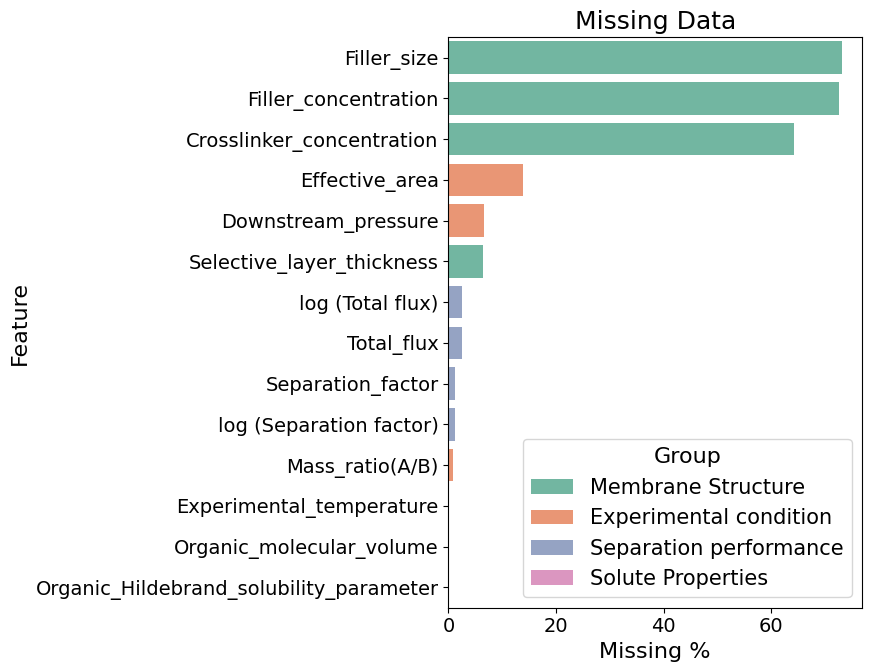

,Group,Feature,Missing Count,Missing %
1,Membrane Structure,Filler_size,1714,73.247863
2,Membrane Structure,Filler_concentration,1701,72.692308
3,Membrane Structure,Crosslinker_concentration,1502,64.188034
6,Experimental condition,Effective_area,323,13.803419
9,Experimental condition,Downstream_pressure,154,6.581197
0,Membrane Structure,Selective_layer_thickness,150,6.410256
12,Separation performance,log (Total flux),57,2.435897
11,Separation performance,Total_flux,57,2.435897
10,Separation performance,Separation_factor,29,1.239316
13,Separation performance,log (Separation factor),29,1.239316


In [ ]:
plot_missingness_by_groups(raw_data_pervaporation, feature_space,figsize=(9,7))

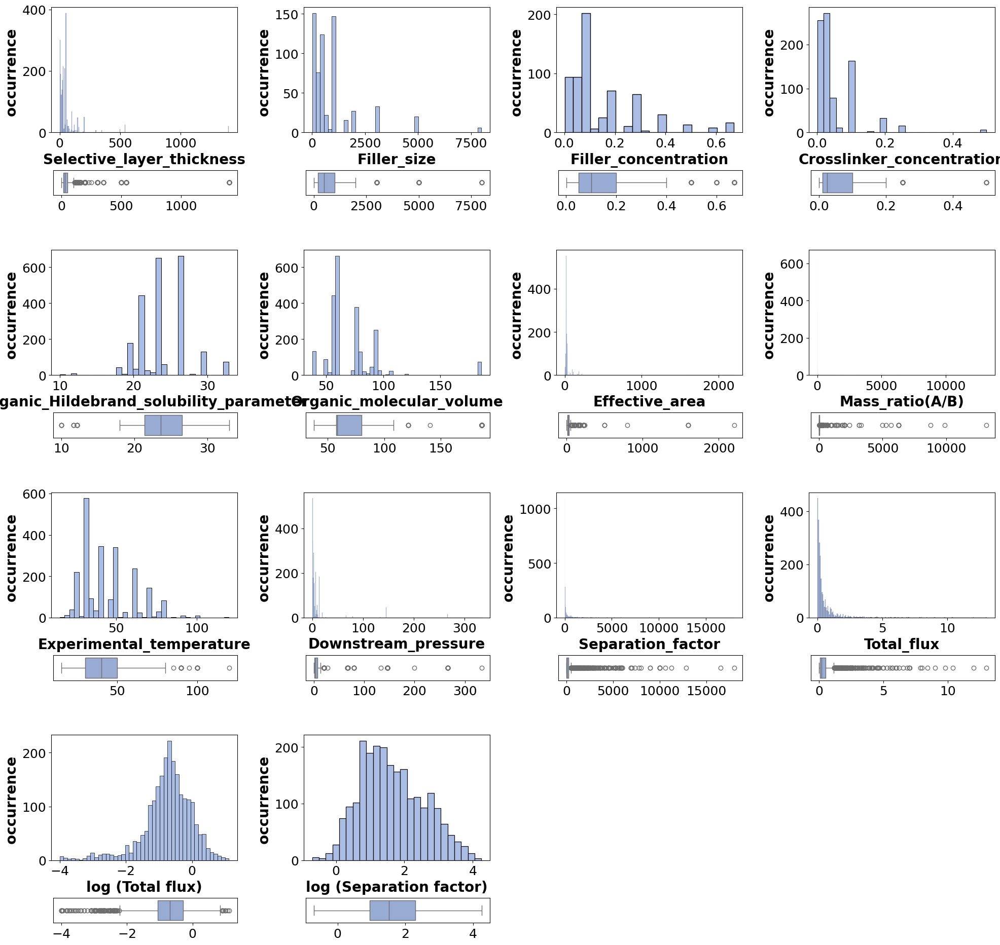

In [ ]:
distribution_plot(df=raw_data_pervaporation, parameters=all_features, columns_per_row=4, log_cutoff=10000000,figsize=(20,20),title = "")

In [ ]:
flux_data = raw_data_pervaporation[~raw_data_pervaporation['Total_flux'].isna()]
separation_data = raw_data_pervaporation[~raw_data_pervaporation['Separation_factor'].isna()]

print(flux_data.shape)
print(separation_data.shape)

(2283, 21)
(2311, 21)


In [ ]:
all_features

['Selective_layer_thickness',
 'Filler_size',
 'Filler_concentration',
 'Crosslinker_concentration',
 'Organic_Hildebrand_solubility_parameter',
 'Organic_molecular_volume',
 'Effective_area',
 'Mass_ratio(A/B)',
 'Experimental_temperature',
 'Downstream_pressure',
 'Separation_factor',
 'Total_flux',
 'log (Total flux)',
 'log (Separation factor)']

In [ ]:
imputation_features = [
 'Selective_layer_thickness',
 'Organic_Hildebrand_solubility_parameter',
 'Organic_molecular_volume',
 'Effective_area',
 'Mass_ratio(A/B)',
 'Experimental_temperature',
 'Downstream_pressure',
]

*imputation*

In [ ]:
# impute features using mean imputations (less than 10% but we did it to 'Effective_area' with 13% nans!)
flux_data_imputed = preprocessing_workflow(flux_data,imputer='mean',feat_to_impute=imputation_features )
separation_data_imputed = preprocessing_workflow(separation_data,imputer='mean',feat_to_impute=imputation_features )
# impute nans in below features with 0 according to SI
special_impute = ['Filler_size', 'Filler_concentration', 'Crosslinker_concentration']

# Impute NaN with 0 for these columns
separation_data_imputed[special_impute] = separation_data_imputed[special_impute].fillna(0)
separation_data_imputed.drop(columns=['Total_flux','log (Total flux)'],inplace=True)
flux_data_imputed[special_impute] = flux_data_imputed[special_impute].fillna(0)
flux_data_imputed.drop(columns=['Separation_factor', 'log (Separation factor)'],inplace=True)


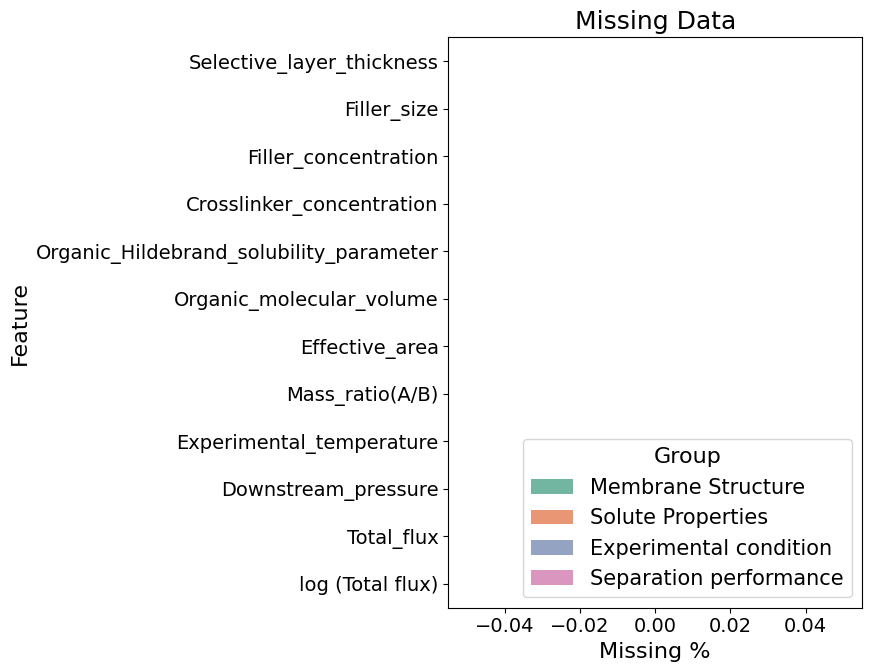

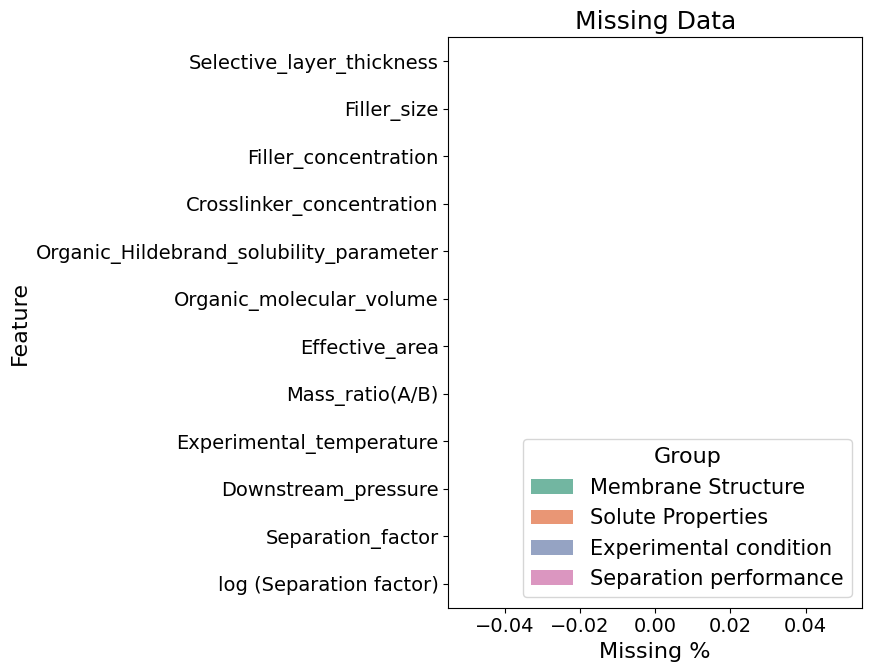

,Group,Feature,Missing Count,Missing %
0,Membrane Structure,Selective_layer_thickness,0,0.0
1,Membrane Structure,Filler_size,0,0.0
2,Membrane Structure,Filler_concentration,0,0.0
3,Membrane Structure,Crosslinker_concentration,0,0.0
4,Solute Properties,Organic_Hildebrand_solubility_parameter,0,0.0
5,Solute Properties,Organic_molecular_volume,0,0.0
6,Experimental condition,Effective_area,0,0.0
7,Experimental condition,Mass_ratio(A/B),0,0.0
8,Experimental condition,Experimental_temperature,0,0.0
9,Experimental condition,Downstream_pressure,0,0.0


In [ ]:
plot_missingness_by_groups(flux_data_imputed, feature_space,figsize=(9,7))
plot_missingness_by_groups(separation_data_imputed, feature_space,figsize=(9,7))

*log of targets*

*generate count6_512 ECFP *

In [ ]:
flux_data_imputed.reset_index(drop=True,inplace=True)
separation_data_imputed.reset_index(drop=True,inplace=True)

separation_data_imputed = ECFP_Processor(separation_data_imputed, column='smile',new_unit_name='polymers').main_ecfp([3], [512], count_vector= True)
flux_data_imputed = ECFP_Processor(flux_data_imputed, column='smile',new_unit_name='polymers').main_ecfp([3], [512], count_vector= True)
separation_data_imputed  = ECFP_Processor(separation_data_imputed, column='smile',new_unit_name='polymers').main_ecfp([3], [512], count_vector= False)
flux_data_imputed = ECFP_Processor(flux_data_imputed, column='smile',new_unit_name='polymers').main_ecfp([3], [512], count_vector= False)

Done with generating polymers_ECFP6_count_512bits
Done with generating polymers_ECFP6_count_512bits
Done with generating polymers_ECFP6_binary_512bits
Done with generating polymers_ECFP6_binary_512bits


In [ ]:
unique_polymers = flux_data_imputed.drop_duplicates(subset=['smile']).reset_index(drop=True)
unique_polymers.shape

(53, 21)

*polymer space*

In [ ]:
display_molecules(unique_polymers,'smile','Abbrevation')

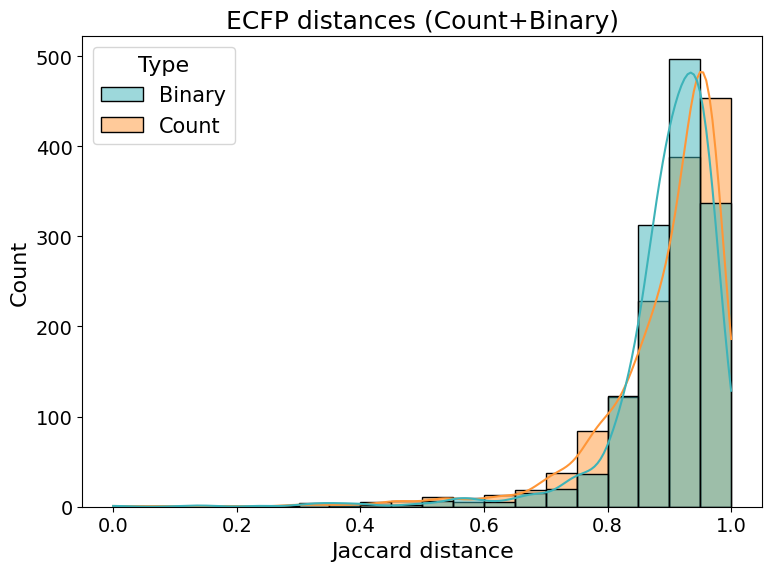

In [ ]:
binary_array = np.array(unique_polymers['polymers_ECFP6_binary_512bits'].tolist())
count_array  = np.array(unique_polymers['polymers_ECFP6_count_512bits'].tolist())

# Compute pairwise distances
binary_tanimoto_similarities = pdist(binary_array, metric="jaccard")
count_tanimoto_similarities  = pdist(count_array, metric=weighted_jaccard)

# Build dataframe
data = pd.DataFrame({
    "Similarity": np.concatenate([binary_tanimoto_similarities, count_tanimoto_similarities]),
    "Type": (["Binary"] * len(binary_tanimoto_similarities)) +
            (["Count"] * len(count_tanimoto_similarities))
})

palette = {"Binary": "#3DB3B9", "Count": "#FF9637"}

# Plot
plt.figure(figsize=(8, 6))
sns.histplot(data=data, x="Similarity", hue="Type", kde=True, bins=20, palette=palette)
plt.title("ECFP distances (Count+Binary)")
plt.xlabel("Jaccard distance")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

In [ ]:
flux_data_imputed.to_pickle(saving_folder/'flux_data_imputed.pkl')
separation_data_imputed.to_pickle(saving_folder/'separation_data_imputed.pkl')
flux_data_imputed.to_csv(saving_folder/'flux_data_imputed.csv')
separation_data_imputed.to_csv(saving_folder/'separation_data_imputed.csv')

In [ ]:
all_flux_nums = [
 'Selective_layer_thickness',
 'Filler_size',
 'Filler_concentration',
 'Crosslinker_concentration',
 'Organic_Hildebrand_solubility_parameter',
 'Organic_molecular_volume',
 'Effective_area',
 'Mass_ratio(A/B)',
 'Experimental_temperature',
 'Downstream_pressure',
 'Total_flux',
 'log (Total flux)',
]

all_separation_nums = [
 'Selective_layer_thickness',
 'Filler_size',
 'Filler_concentration',
 'Crosslinker_concentration',
 'Organic_Hildebrand_solubility_parameter',
 'Organic_molecular_volume',
 'Effective_area',
 'Mass_ratio(A/B)',
 'Experimental_temperature',
 'Downstream_pressure',
 'Separation_factor',
 'log (Separation factor)'
 ]

In [ ]:

numerical_separation_df = separation_data_imputed[all_separation_nums]
numerical_flux_df = flux_data_imputed[all_flux_nums]

fp_col, un_feats = get_structural_info('ECFP', ['polymers'],radius=3,vector='count')
strcutural_separation_df = unroll_ECFP(separation_data_imputed[fp_col],**un_feats)
r_training_separation_features: pd.DataFrame = pd.concat(
        [strcutural_separation_df, numerical_separation_df], axis=1
    )

fp_col, un_feats = get_structural_info('ECFP', ['polymers'],radius=3,vector='count')
strcutural_flux_df = unroll_ECFP(flux_data_imputed[fp_col],**un_feats)
r_training_flux_features: pd.DataFrame = pd.concat(
        [strcutural_flux_df, numerical_flux_df], axis=1
    )

r_training_flux_features.to_csv(saving_folder/'r_training_flux_features.csv', index=False)
r_training_separation_features.to_csv(saving_folder/'r_training_separation_features.csv', index=False)

In [ ]:
print(flux_data_imputed.shape)
print(separation_data_imputed.shape)
print(strcutural_flux_df.shape)
print(strcutural_separation_df.shape)
print(numerical_flux_df.shape)
print(numerical_separation_df.shape)

print(r_training_flux_features.shape)
print(r_training_separation_features.shape)




(2283, 21)
(2311, 21)
(2283, 512)
(2311, 512)
(2283, 12)
(2311, 12)
(2283, 524)
(2311, 524)


##Understanding and Designing a High-Performance Ultrafiltration Membrane Using Machine Learning

specification


*   320 datapoints
*   11 unique polymers



https://doi.org/10.1021/acs.est.2c05404

###Clone & read data

In [ ]:
saving_folder=data_folder/'Understanding and Designing a High-Performance Ultrafiltration Membrane Using Machine Learning'
raw_data_ultrafiltration = pd.read_excel(saving_folder/'raw_dataset.xlsx', header=2)

###Analysis

In [ ]:
print('#polymers:', raw_data_ultrafiltration['SMILES'].nunique())
raw_data_ultrafiltration.head()


#polymers: 11


,Polymer,SMILES,P_MW,P_wt%,surface tension (mN/m),pore maker,pore maker molecular weight (Da),pore maker wt% (pore maker to total weight),additive,additive wt% (additive to polymer),...,organic compound size (Da),foulant,foulant concentration (mg/L),water permeability (LMH/bar),organic compound removal (%),flux decline ratio (%),flux recovery ratio (%),reversible fouling ratio (%),irreversible fouling ratio(%),DOI
0,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,0.0,...,68000.0,BSA,500,132.2,96.8,24.0,50.0,26.0,50.0,10.1016/j.cjche.2017.02.009
1,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,0.5,...,68000.0,BSA,500,175.0,96.0,55.0,80.0,25.0,20.0,10.1016/j.cjche.2017.02.009
2,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,1.0,...,68000.0,BSA,500,200.0,95.0,63.5,82.0,18.5,18.0,10.1016/j.cjche.2017.02.009
3,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,1.5,...,68000.0,BSA,500,231.7,93.0,65.5,83.5,18.0,16.5,10.1016/j.cjche.2017.02.009
4,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,2.0,...,68000.0,BSA,500,250.0,91.0,37.0,62.0,25.0,38.0,10.1016/j.cjche.2017.02.009


In [ ]:
raw_data_ultrafiltration.columns.to_list()

['Polymer',
 'SMILES',
 'P_MW',
 'P_wt%',
 'surface tension (mN/m)',
 'pore maker',
 'pore maker molecular weight (Da)',
 'pore maker wt% (pore maker to total weight)',
 'additive',
 'additive wt% (additive to polymer)',
 'organic solvent',
 'solubility parameter (MPa1/2)',
 'TMP (bar)',
 'organic compound',
 'oraganic compound concentration (mg/L)',
 'organic compound size (Da)',
 'foulant',
 'foulant concentration (mg/L)',
 'water permeability (LMH/bar)',
 'organic compound removal (%)',
 'flux decline ratio (%)',
 'flux recovery ratio (%) ',
 'reversible fouling ratio (%)',
 'irreversible fouling ratio(%)',
 'DOI']

> 'flux recovery ratio (%) ' as main target




In [ ]:
feature_space = {
        "Polymer":[
              'P_MW',
              'surface tension (mN/m)',
        ],

        "Fabrication condition": [
              'P_wt%',
              'pore maker',
              'pore maker molecular weight (Da)',
              'pore maker wt% (pore maker to total weight)',
              'additive',
              'additive wt% (additive to polymer)',
              'organic solvent',
              'solubility parameter (MPa1/2)',
              ],

        # 'Membrane property': [
        #       'Organic_Hildebrand_solubility_parameter',
        #       'Organic_molecular_volume'

        # ],

        'Operational condition': [
            'TMP (bar)',
            'organic compound',
            'oraganic compound concentration (mg/L)',
            'organic compound size (Da)',
            'foulant',
            'foulant concentration (mg/L)',

        ],

        'Membrane performance': [
            'water permeability (LMH/bar)',
            'organic compound removal (%)',
            'flux decline ratio (%)',
            'flux recovery ratio (%) ',
            'reversible fouling ratio (%)',
            'irreversible fouling ratio(%)',
        ]
              }

all_features = [
    item
    for sublist in feature_space.values()
    for item in sublist
    if item in raw_data_ultrafiltration.columns
       and raw_data_ultrafiltration[item].dtype != "object"
]

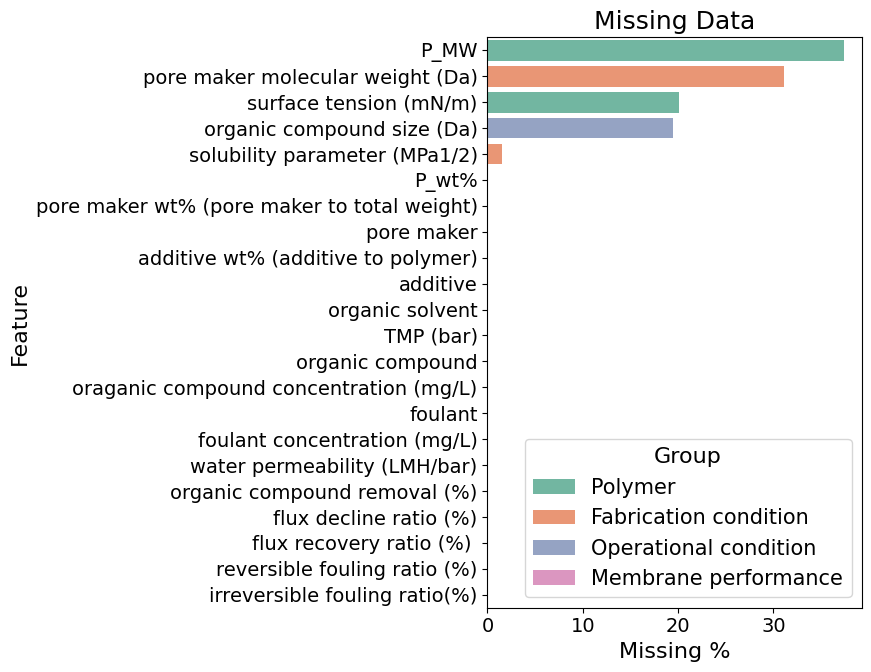

,Group,Feature,Missing Count,Missing %
0,Polymer,P_MW,119,37.421384
4,Fabrication condition,pore maker molecular weight (Da),99,31.132075
1,Polymer,surface tension (mN/m),64,20.125786
13,Operational condition,organic compound size (Da),62,19.496855
9,Fabrication condition,solubility parameter (MPa1/2),5,1.572327
2,Fabrication condition,P_wt%,0,0.000000
5,Fabrication condition,pore maker wt% (pore maker to total weight),0,0.000000
3,Fabrication condition,pore maker,0,0.000000
7,Fabrication condition,additive wt% (additive to polymer),0,0.000000
6,Fabrication condition,additive,0,0.000000


In [ ]:
plot_missingness_by_groups(raw_data_ultrafiltration, feature_space,figsize=(9,7))

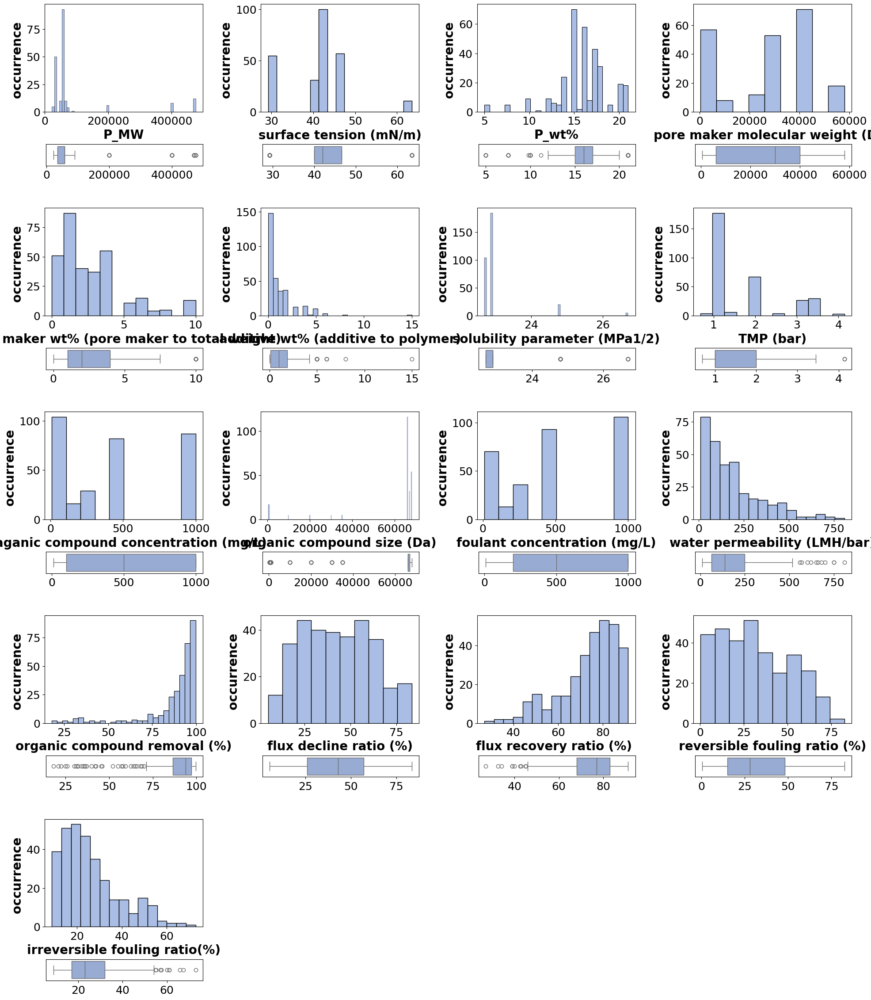

In [ ]:
distribution_plot(df=raw_data_ultrafiltration, parameters=all_features, columns_per_row=4, log_cutoff=10000000,figsize=(20,24),title = "")

*Encode categorical* : Label encoder used (BaseNEncoder in the paper)

In [ ]:
all_features

['P_MW',
 'surface tension (mN/m)',
 'P_wt%',
 'pore maker molecular weight (Da)',
 'pore maker wt% (pore maker to total weight)',
 'additive wt% (additive to polymer)',
 'solubility parameter (MPa1/2)',
 'TMP (bar)',
 'oraganic compound concentration (mg/L)',
 'organic compound size (Da)',
 'foulant concentration (mg/L)',
 'water permeability (LMH/bar)',
 'organic compound removal (%)',
 'flux decline ratio (%)',
 'flux recovery ratio (%) ',
 'reversible fouling ratio (%)',
 'irreversible fouling ratio(%)']

In [ ]:
categorical_params =  [
  'organic solvent',
  'additive',
  'pore maker',
  'organic compound',
  'foulant',
  ]

In [ ]:
ord_encoder = OrdinalEncoder()
ord_encoder.fit_transform(raw_data_ultrafiltration[categorical_params])
raw_data_ultrafiltration[[f"enc_{col}" for col in categorical_params]] =  ord_encoder.fit_transform(raw_data_ultrafiltration[categorical_params])

*imputation*: Let's impute during the run

In [ ]:
# imputation_features = [
#  'Selective_layer_thickness',
#  'Organic_Hildebrand_solubility_parameter',
#  'Organic_molecular_volume',
#  'Effective_area',
#  'Mass_ratio(A/B)',
#  'Experimental_temperature',
#  'Downstream_pressure',
# ]

*generate count6_512 ECFP *

In [ ]:
raw_data_ultrafiltration

,Polymer,SMILES,P_MW,P_wt%,surface tension (mN/m),pore maker,pore maker molecular weight (Da),pore maker wt% (pore maker to total weight),additive,additive wt% (additive to polymer),...,flux decline ratio (%),flux recovery ratio (%),reversible fouling ratio (%),irreversible fouling ratio(%),DOI,enc_organic solvent,enc_additive,enc_pore maker,enc_organic compound,enc_foulant
0,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,0.0,...,24.00,50.00,26.00,50.00,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
1,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,0.5,...,55.00,80.00,25.00,20.00,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
2,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,1.0,...,63.50,82.00,18.50,18.00,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
3,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,1.5,...,65.50,83.50,18.00,16.50,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
4,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,2.0,...,37.00,62.00,25.00,38.00,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
313,Cellulose acetate,CC(=O)OC[C@H]1O[C@@H](O*)[C@H](OC(C)=O)[C@@H](...,30000.0,16.0,63.55,PEG,400.0,2.0,CNC-2,15.0,...,62.00,83.00,21.00,17.00,10.1016/j.carbpol.2017.06.064,4.0,2.0,0.0,0.0,0.0
314,Cellulose acetate,CC(=O)OC[C@H]1O[C@@H](O*)[C@H](OC(C)=O)[C@@H](...,NaN,15.0,63.55,PVP,25000.0,2.0,none,0.0,...,25.18,60.18,35.00,39.82,10.1002/app.43946,4.0,69.0,1.0,0.0,0.0
315,Cellulose acetate,CC(=O)OC[C@H]1O[C@@H](O*)[C@H](OC(C)=O)[C@@H](...,NaN,15.0,63.55,PVP,25000.0,2.0,CNC-3,0.5,...,30.00,68.00,38.00,32.00,10.1002/app.43946,4.0,3.0,1.0,0.0,0.0
316,Cellulose acetate,CC(=O)OC[C@H]1O[C@@H](O*)[C@H](OC(C)=O)[C@@H](...,NaN,15.0,63.55,PVP,25000.0,2.0,CNC-3,1.2,...,30.24,72.24,42.00,27.76,10.1002/app.43946,4.0,3.0,1.0,0.0,0.0


In [ ]:
raw_data_ultrafiltration = ECFP_Processor(raw_data_ultrafiltration, column='SMILES',new_unit_name='polymer').main_ecfp([3], [512], count_vector= True)
raw_data_ultrafiltration = ECFP_Processor(raw_data_ultrafiltration, column='SMILES',new_unit_name='polymer').main_ecfp([3], [512], count_vector= False)


Done with generating polymer_ECFP6_count_512bits
Done with generating polymer_ECFP6_binary_512bits


In [ ]:
unique_polymers = raw_data_ultrafiltration.drop_duplicates(subset=['SMILES']).reset_index(drop=True)
unique_polymers.shape

(11, 32)

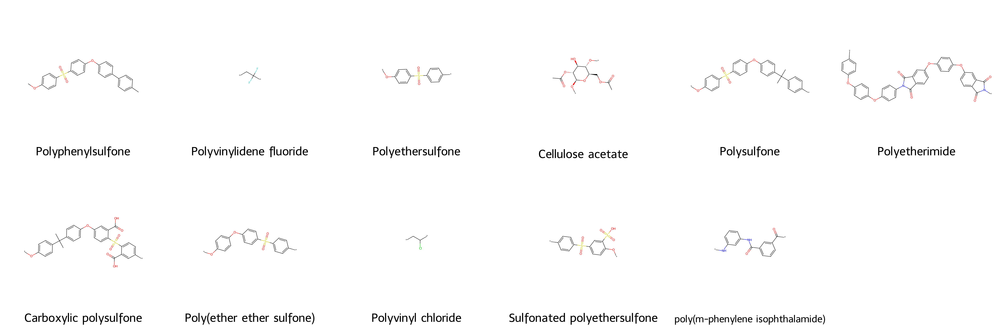

In [ ]:
display_molecules(unique_polymers,'SMILES','Polymer')

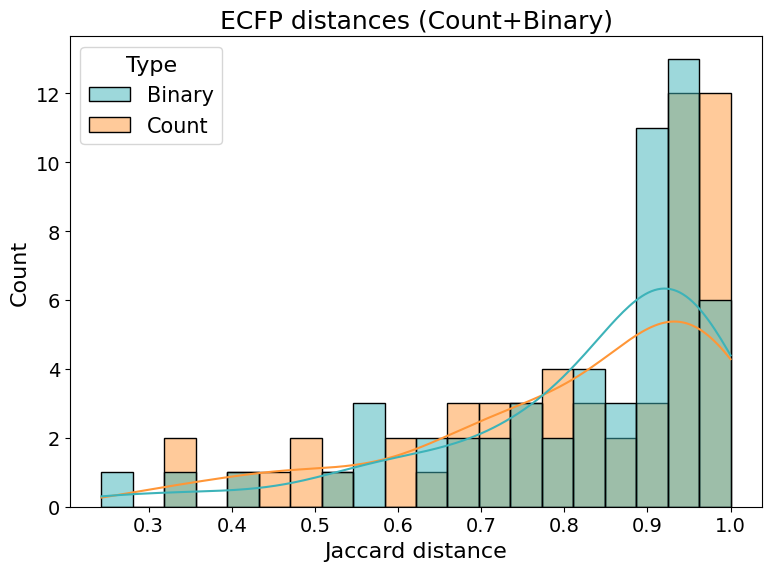

In [ ]:
binary_array = np.array(unique_polymers['polymer_ECFP6_binary_512bits'].tolist())
count_array  = np.array(unique_polymers['polymer_ECFP6_count_512bits'].tolist())

# Compute pairwise distances
binary_tanimoto_similarities = pdist(binary_array, metric="jaccard")
count_tanimoto_similarities  = pdist(count_array, metric=weighted_jaccard)

# Build dataframe
data = pd.DataFrame({
    "Similarity": np.concatenate([binary_tanimoto_similarities, count_tanimoto_similarities]),
    "Type": (["Binary"] * len(binary_tanimoto_similarities)) +
            (["Count"] * len(count_tanimoto_similarities))
})

palette = {"Binary": "#3DB3B9", "Count": "#FF9637"}

# Plot
plt.figure(figsize=(8, 6))
sns.histplot(data=data, x="Similarity", hue="Type", kde=True, bins=20, palette=palette)
plt.title("ECFP distances (Count+Binary)")
plt.xlabel("Jaccard distance")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

In [ ]:
raw_data_ultrafiltration.shape

(318, 32)

In [ ]:
raw_data_ultrafiltration = raw_data_ultrafiltration.rename(columns={"flux recovery ratio (%) ": "flux recovery ratio (%)"})

raw_data_ultrafiltration.to_pickle(saving_folder/'cleaned_dataset_Ultrafiltration Membrane.pkl')
raw_data_ultrafiltration.to_csv(saving_folder/'cleaned_dataset_Ultrafiltration Membrane.csv')

In [ ]:
all_features = [
 'P_MW',
 'surface tension (mN/m)',
 'P_wt%',
 'pore maker molecular weight (Da)',
 'pore maker wt% (pore maker to total weight)',
 'additive wt% (additive to polymer)',
 'solubility parameter (MPa1/2)',
 'TMP (bar)',
 'oraganic compound concentration (mg/L)',
 'organic compound size (Da)',
 'foulant concentration (mg/L)',
 'water permeability (LMH/bar)',
 'organic compound removal (%)',
 'flux decline ratio (%)',
 'flux recovery ratio (%)',
 'reversible fouling ratio (%)',
 'irreversible fouling ratio(%)']

numerical_ultrafiltration = raw_data_ultrafiltration[all_features+ [f"enc_{col}" for col in categorical_params]]

fp_col, un_feats = get_structural_info('ECFP', ['polymer'],radius=3,vector='count')
strcutural_df = unroll_ECFP(raw_data_ultrafiltration[fp_col],**un_feats)
r_training_ultrafiltration: pd.DataFrame = pd.concat(
        [strcutural_df, numerical_ultrafiltration], axis=1
    )


r_training_ultrafiltration.to_csv(saving_folder/'r_training_ultrafiltration.csv', index=False)

## Machine Learning-Enabled Prediction and High-Throughput Screening of Polymer Membranes for Pervaporation Separation

Specification


*   681 datapoints
*   16 unique polymers




https://doi.org/10.1021/acsami.1c22886

###Clone & read data

In [ ]:
saving_folder=data_folder/'Machine Learning-Enabled Prediction and High-Throughput Screening of Polymer Membranes for Pervaporation Separation'
raw_data_pervaporation_membranes = pd.read_excel(saving_folder/'raw_dataset.xlsx', header=5)
raw_data_pervaporation_membranes.drop(columns=['Index'],inplace=True)

###Analysis

In [ ]:
print('#polymers:', raw_data_pervaporation_membranes['Polymer'].nunique())
raw_data_pervaporation_membranes.head()

#polymers: 16


,Polymer,Contact angle θ （°）,Thickness ℓ (um),Mixture (w/o),Solvent solubility parameter （MPa1/2）,xw (wt%),Temperature (°C),Permeate pressure (mbar),Total flux (kg/m2h),Separation factor (w/o),DOI
0,chitosan,55.1,40.0,water/ipa,23.5,5.0,30,13.3,0.0378,606.617647,10.1016/j.memsci.2010.08.007
1,chitosan,55.1,40.0,water/ipa,23.5,10.0,30,13.3,0.0523,257.352941,10.1016/j.memsci.2010.08.007
2,chitosan,55.1,40.0,water/ipa,23.5,15.0,30,13.3,0.0894,122.549020,10.1016/j.memsci.2010.08.007
3,chitosan,55.1,40.0,water/ipa,23.5,20.0,30,13.3,0.1700,73.529412,10.1016/j.memsci.2010.08.007
4,chitosan,55.1,40.0,water/ipa,23.5,25.0,30,13.3,0.1984,49.019608,10.1016/j.memsci.2010.08.007


In [ ]:

smiles_source = pd.DataFrame({
    "Polymer": [
        "chitosan",
        "pva",
        "alginate",
        "Matrimid",
        "pdms",
        "pan",
        "ptmsp",
        "peba",
        "p84",
        "Torlon",
        "pbi",
        "pim-1",
        "ppsu",
        "pbo",
        "ppo",
        "ppms",
    ],
    'SMILES': [
    "NC2C(O)C(OC1OC(CO)C(O[*])C(O)C1N)C(CO)OC2[*]",
    "C([*])C([*])(O)",
    "O=C(O)C1OC([*])C(O)C(O)C1O[*].O=C(O)C1OC([*])C(O)C(O)C1O[*]",
    "CC7(C)CC(C)(c5ccc(n4c(=O)c3ccc(C(=O)c2ccc1c(=O)n([*])c(=O)c1c2)cc3c4=O)cc5)c6cc([*])ccc67",
    "[Si]([*])(C)(C)O([*])",
    "[*]CC(C#N)[*]",
    "C/C([*])=C([*])/[Si](C)(C)C",
    "O=C([*])[*].O=C([*])O[*].[*]O[*].O=C([*])CCCCCCCCCCCN[*].C[*]CCCO[*]",
    "[*]c2ccc(Cc1ccc([*])cc1)cc2.Cc1cc([*])ccc1n5c(=O)c4ccc(C(=O)c3ccc2c(=O)n([*])c(=O)c2c3)cc4c5=O",
    "O=C(Nc2ccc(Oc1ccc([*])cc1)cc2)c4ccc3c(=O)n([*])c(=O)c3c4.O=C(Nc1cccc([*])c1)c3ccc2c(=O)n([*])c(=O)c2c3",
    "[*]c5ccc(c4nc3cc(c2ccc1nc([*])oc1c2)ccc3o4)cc5",
    "CC6(C)CC4(CC(C)(C)c3cc2oc1c(C#N)c([*])c([*])c(C#N)c1oc2cc34)c5cc(O[*])c(O[*])cc56",
    "O=S(=O)(c1ccc([*])cc1)c4ccc(Oc3ccc(c2ccc(O[*])cc2)cc3)cc4",
    "FC(F)(F)C(c1ccc([*])cc1)(c6ccc(c5nc4ccc(c3ccc2nc([*])oc2c3)cc4o5)cc6)C(F)(F)F",
    "Cc1cc([*])cc(C)c1O[*]",
    "C[Si]([*])(O[*])c1ccccc1"
]
})

smiles_dict = dict(zip(smiles_source["Polymer"], smiles_source["SMILES"]))


In [ ]:
w_data_pervaporation_membranes = raw_data_pervaporation_membranes.copy()
w_data_pervaporation_membranes["SMILES"] = w_data_pervaporation_membranes["Polymer"].map(smiles_dict)


In [ ]:
w_data_pervaporation_membranes.columns = w_data_pervaporation_membranes.columns.str.strip()
w_data_pervaporation_membranes.columns.to_list()

['Polymer',
 'Contact angle θ （°）',
 'Thickness ℓ (um)',
 'Mixture (w/o)',
 'Solvent solubility parameter （MPa1/2）',
 'xw (wt%)',
 'Temperature (°C)',
 'Permeate pressure (mbar)',
 'Total flux (kg/m2h)',
 'Separation factor (w/o)',
 'DOI',
 'SMILES']

In [ ]:
w_data_pervaporation_membranes['log (Total flux)'] = np.log10(w_data_pervaporation_membranes['Total flux (kg/m2h)'])
w_data_pervaporation_membranes['log (Separation factor)'] = np.log10(w_data_pervaporation_membranes['Separation factor (w/o)'])

In [ ]:
feature_space = {
        'Membrane property': [
            'Contact angle θ （°）',
            'Thickness ℓ (um)',

        ],

        'Operational condition': [
            'xw (wt%)',
            'Temperature (°C)',
            'Permeate pressure (mbar)',

        ],
        'solvent property': [
            'Solvent solubility parameter （MPa1/2）',
              ],

        'Membrane performance': [
            'Total flux (kg/m2h)',
            'Separation factor (w/o)',
            'log (Total flux)',
            'log (Separation factor)'
        ]
              }

all_features = [
    item
    for sublist in feature_space.values()
    for item in sublist
    if item in w_data_pervaporation_membranes.columns
       and w_data_pervaporation_membranes[item].dtype != "object"
]

In [ ]:
w_data_pervaporation_membranes[all_features].describe()

,Contact angle θ （°）,Thickness ℓ (um),xw (wt%),Temperature (°C),Permeate pressure (mbar),Solvent solubility parameter （MPa1/2）,Total flux (kg/m2h),Separation factor (w/o),log (Total flux),log (Separation factor)
count,681.000000,681.000000,681.000000,681.000000,681.000000,681.000000,681.000000,681.000000,681.000000,681.000000
mean,75.031738,28.453875,44.394590,45.102790,4.529330,25.841997,0.711581,351.590537,-0.576060,1.018851
std,24.095973,23.649684,38.162736,16.001416,4.254623,3.528914,1.108994,880.775333,0.655760,1.653485
min,31.430000,0.190000,1.000000,20.000000,0.010000,21.400000,0.000700,0.011155,-3.154902,-1.952530
25%,55.100000,10.000000,10.000000,30.000000,1.000000,23.100000,0.085607,0.210588,-1.067488,-0.676566
50%,74.000000,22.000000,20.000000,40.000000,3.000000,23.500000,0.282000,25.792531,-0.549751,1.411494
75%,92.200000,40.000000,95.000000,60.000000,6.700000,26.500000,0.804100,203.125000,-0.094690,2.307763
max,121.200000,200.000000,99.992415,100.000000,17.600000,32.900000,7.871300,5661.000000,0.896046,3.752893


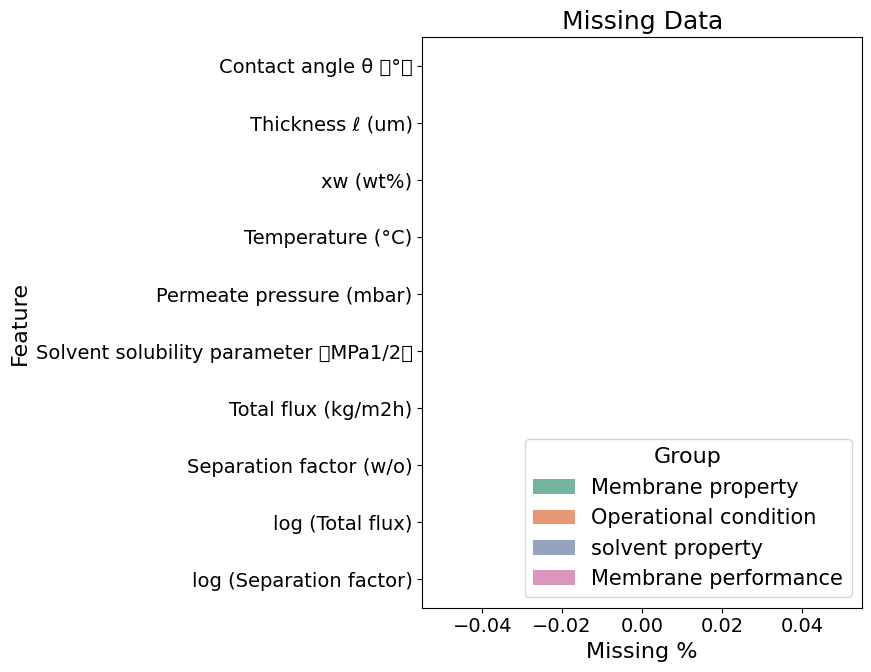

,Group,Feature,Missing Count,Missing %
0,Membrane property,Contact angle θ （°）,0,0.0
1,Membrane property,Thickness ℓ (um),0,0.0
2,Operational condition,xw (wt%),0,0.0
3,Operational condition,Temperature (°C),0,0.0
4,Operational condition,Permeate pressure (mbar),0,0.0
5,solvent property,Solvent solubility parameter （MPa1/2）,0,0.0
6,Membrane performance,Total flux (kg/m2h),0,0.0
7,Membrane performance,Separation factor (w/o),0,0.0
8,Membrane performance,log (Total flux),0,0.0
9,Membrane performance,log (Separation factor),0,0.0


In [ ]:
plot_missingness_by_groups(w_data_pervaporation_membranes, feature_space,figsize=(9,7))

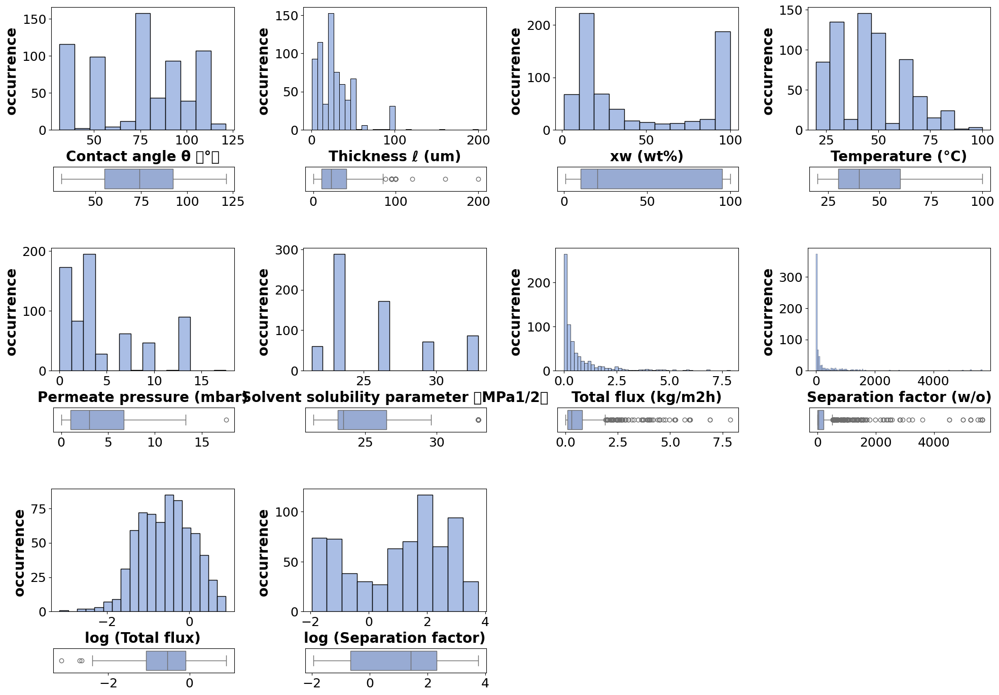

In [ ]:
distribution_plot(df=w_data_pervaporation_membranes, parameters=all_features, columns_per_row=4, log_cutoff=10000000,figsize=(20,15),title = "")

*imputation*: No imputation needed. no missing values

*generate count6_512 ECFP *

In [ ]:
w_data_pervaporation_membranes

,Polymer,Contact angle θ （°）,Thickness ℓ (um),Mixture (w/o),Solvent solubility parameter （MPa1/2）,xw (wt%),Temperature (°C),Permeate pressure (mbar),Total flux (kg/m2h),Separation factor (w/o),DOI,SMILES,log (Total flux),log (Separation factor)
0,chitosan,55.10000,40.0,water/ipa,23.5,5.0,30,13.300,0.037800,606.617647,10.1016/j.memsci.2010.08.007,NC2C(O)C(OC1OC(CO)C(O[*])C(O)C1N)C(CO)OC2[*],-1.422508,2.782915
1,chitosan,55.10000,40.0,water/ipa,23.5,10.0,30,13.300,0.052300,257.352941,10.1016/j.memsci.2010.08.007,NC2C(O)C(OC1OC(CO)C(O[*])C(O)C1N)C(CO)OC2[*],-1.281498,2.410529
2,chitosan,55.10000,40.0,water/ipa,23.5,15.0,30,13.300,0.089400,122.549020,10.1016/j.memsci.2010.08.007,NC2C(O)C(OC1OC(CO)C(O[*])C(O)C1N)C(CO)OC2[*],-1.048662,2.088310
3,chitosan,55.10000,40.0,water/ipa,23.5,20.0,30,13.300,0.170000,73.529412,10.1016/j.memsci.2010.08.007,NC2C(O)C(OC1OC(CO)C(O[*])C(O)C1N)C(CO)OC2[*],-0.769551,1.866461
4,chitosan,55.10000,40.0,water/ipa,23.5,25.0,30,13.300,0.198400,49.019608,10.1016/j.memsci.2010.08.007,NC2C(O)C(OC1OC(CO)C(O[*])C(O)C1N)C(CO)OC2[*],-0.702458,1.690370
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
676,pdms,108.08219,9.5,water/ethanol,26.5,94.0,50,3.000,1.307100,0.118006,10.1016/j.seppur.2020.116675,[Si]([*])(C)(C)O([*]),0.116309,-0.928096
677,pdms,108.08219,9.5,water/ethanol,26.5,94.0,60,3.000,1.870600,0.114516,10.1016/j.seppur.2020.116675,[Si]([*])(C)(C)O([*]),0.271981,-0.941134
678,pdms,108.08219,9.5,water/ethanol,26.5,94.0,70,3.000,2.829900,0.121368,10.1016/j.seppur.2020.116675,[Si]([*])(C)(C)O([*]),0.451771,-0.915896
679,pdms,108.08219,87.5,water/ethanol,26.5,95.0,30,0.667,0.031900,0.100000,10.1016/j.seppur.2019.116092,[Si]([*])(C)(C)O([*]),-1.496209,-1.000000


In [ ]:
w_data_pervaporation_membranes = ECFP_Processor(w_data_pervaporation_membranes, column='SMILES',new_unit_name='polymer').main_ecfp([3], [512], count_vector= True)
w_data_pervaporation_membranes = ECFP_Processor(w_data_pervaporation_membranes, column='SMILES',new_unit_name='polymer').main_ecfp([3], [512], count_vector= False)

Done with generating polymer_ECFP6_count_512bits
Done with generating polymer_ECFP6_binary_512bits


In [ ]:
unique_polymers = w_data_pervaporation_membranes.drop_duplicates(subset=['SMILES']).reset_index(drop=True)
unique_polymers.shape

(16, 16)

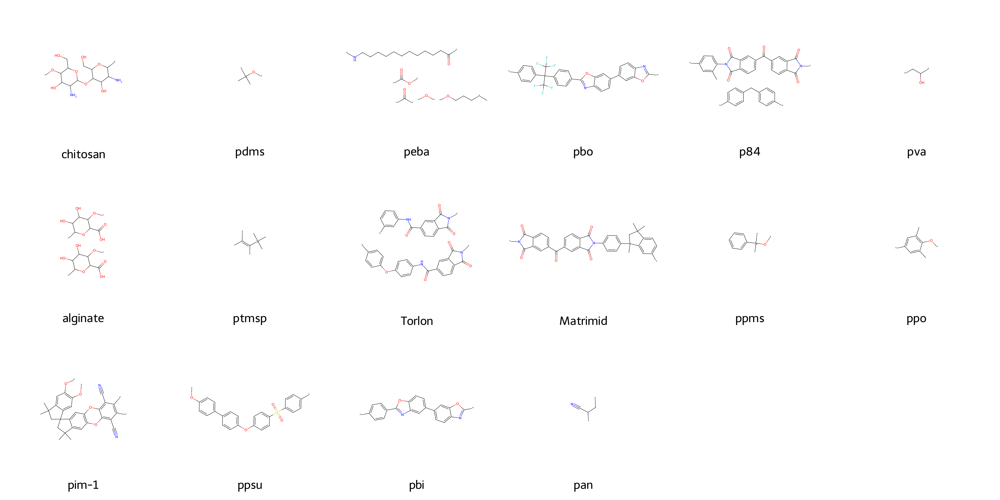

In [ ]:
display_molecules(unique_polymers,'SMILES','Polymer')

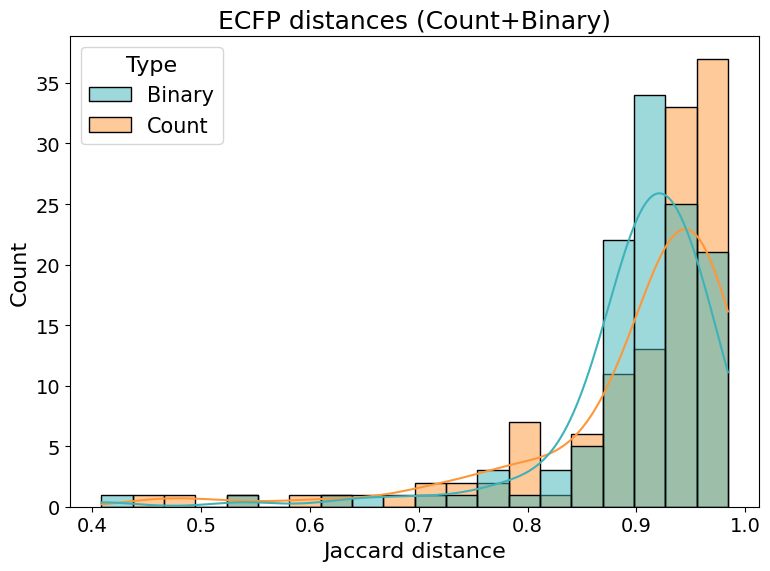

In [ ]:
binary_array = np.array(unique_polymers['polymer_ECFP6_binary_512bits'].tolist())
count_array  = np.array(unique_polymers['polymer_ECFP6_count_512bits'].tolist())

# Compute pairwise distances
binary_tanimoto_similarities = pdist(binary_array, metric="jaccard")
count_tanimoto_similarities  = pdist(count_array, metric=weighted_jaccard)

# Build dataframe
data = pd.DataFrame({
    "Similarity": np.concatenate([binary_tanimoto_similarities, count_tanimoto_similarities]),
    "Type": (["Binary"] * len(binary_tanimoto_similarities)) +
            (["Count"] * len(count_tanimoto_similarities))
})

palette = {"Binary": "#3DB3B9", "Count": "#FF9637"}

# Plot
plt.figure(figsize=(8, 6))
sns.histplot(data=data, x="Similarity", hue="Type", kde=True, bins=20, palette=palette)
plt.title("ECFP distances (Count+Binary)")
plt.xlabel("Jaccard distance")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

In [ ]:
w_data_pervaporation_membranes.to_pickle(saving_folder/'cleaned_dataset_pervaporation_membranes_wang.pkl')
w_data_pervaporation_membranes.to_csv(saving_folder/'cleaned_dataset_pervaporation_membranes_wang.csv')

In [ ]:
numerical_pervaporation= w_data_pervaporation_membranes[all_features]

fp_col, un_feats = get_structural_info('ECFP', ['polymer'],radius=3,vector='count')
strcutural_df = unroll_ECFP(w_data_pervaporation_membranes[fp_col],**un_feats)
r_training_pervaporation: pd.DataFrame = pd.concat(
        [strcutural_df, numerical_pervaporation], axis=1
    )


r_training_pervaporation.to_csv(saving_folder/'r_training_pervaporation.csv', index=False)

In [ ]:
numerical_pervaporation

,Contact angle θ （°）,Thickness ℓ (um),xw (wt%),Temperature (°C),Permeate pressure (mbar),Solvent solubility parameter （MPa1/2）,Total flux (kg/m2h),Separation factor (w/o),log (Total flux),log (Separation factor)
0,55.10000,40.0,5.0,30,13.300,23.5,0.037800,606.617647,-1.422508,2.782915
1,55.10000,40.0,10.0,30,13.300,23.5,0.052300,257.352941,-1.281498,2.410529
2,55.10000,40.0,15.0,30,13.300,23.5,0.089400,122.549020,-1.048662,2.088310
3,55.10000,40.0,20.0,30,13.300,23.5,0.170000,73.529412,-0.769551,1.866461
4,55.10000,40.0,25.0,30,13.300,23.5,0.198400,49.019608,-0.702458,1.690370
...,...,...,...,...,...,...,...,...,...,...
676,108.08219,9.5,94.0,50,3.000,26.5,1.307100,0.118006,0.116309,-0.928096
677,108.08219,9.5,94.0,60,3.000,26.5,1.870600,0.114516,0.271981,-0.941134
678,108.08219,9.5,94.0,70,3.000,26.5,2.829900,0.121368,0.451771,-0.915896
679,108.08219,87.5,95.0,30,0.667,26.5,0.031900,0.100000,-1.496209,-1.000000


## Revolutionizing Membrane Design Using Machine Learning-Bayesian Optimization (lacks smiles)

Specification


*   567 datapoints
*   37 monomer A and 13 monomer B





https://doi.org/10.1021/acs.est.1c04373

###Clone & read data

In [ ]:
saving_folder=data_folder/'Revolutionizing Membrane Design Using Machine Learning-Bayesian Optimization'
raw_data_membranes = pd.read_excel(saving_folder/'raw_dataset.xlsx')

###Analysis

In [ ]:
print('#polymers:', raw_data_membranes['Monomer A1 type'].nunique())
raw_data_membranes.head()


#polymers: 36


,Monomer A1 type,Monomer A2 type,A1/A2 ratio,"Monomer A concentration, wt%",Monomer B type,"Monomer B concentration, wt%",Organic solvent type,Additive X1 type in aqueous phase,"Additive X1 concentration, wt%",Additive X2 type in aqueous phase,...,"Na2SO4 concentration, ppm","MgCl2 concentration, ppm","CaCl2 Concentration, ppm","Permeability, LMH/bar","NaCl rejection, %","Mg2SO4 rejection, %","Na2SO4 rejection, %","MgCl2 rejection, %","CaCl2 rejection, %",Literature DOI
0,Piperazine,NaN,NaN,0.2,trimesoyl chloride (265.5),0.2,hexane,NaN,NaN,NaN,...,1000.0,1000.0,NaN,7.5,NaN,87.0,86.0,10.0,NaN,10.1016/j.desal.2013.11.035
1,Piperazine,NaN,NaN,0.5,trimesoyl chloride (265.5),0.1,Isoparaphin-G,NaN,NaN,NaN,...,500.0,NaN,NaN,7.0,NaN,NaN,98.0,NaN,NaN,10.1016/j.memsci.2009.03.011
2,Piperazine,NaN,NaN,1.5,"3,3′,5,5′-biphenyl tetraacyl chloride (330.25)",0.1,Isoparaphin-G,NaN,NaN,NaN,...,500.0,NaN,NaN,4.0,NaN,NaN,92.5,NaN,NaN,10.1016/j.memsci.2009.03.011
3,Piperazine,NaN,NaN,1.0,"3,3′,5,5′-biphenyl tetraacyl chloride (330.25)",0.1,Isoparaphin-G,NaN,NaN,NaN,...,500.0,NaN,NaN,8.6,NaN,NaN,93.0,NaN,NaN,10.1016/j.memsci.2009.03.011
4,Piperazine,NaN,NaN,0.5,"3,3′,5,5′-biphenyl tetraacyl chloride (330.25)",0.1,Isoparaphin-G,NaN,NaN,NaN,...,500.0,NaN,NaN,10.3,65.0,92.0,95.0,NaN,NaN,10.1016/j.memsci.2009.03.011


In [ ]:
raw_data_ultrafiltration.columns.to_list()

['Index',
 'Polymer',
 'Contact angle θ （°）',
 'Thickness ℓ (um)',
 'Mixture (w/o)',
 'Solvent solubility parameter （MPa1/2）',
 'xw (wt%)',
 'Temperature (°C)',
 'Permeate pressure (mbar)',
 'Total flux (kg/m2h)',
 'Separation factor (w/o)',
 'DOI']

In [ ]:
feature_space = {
        "Polymer":[
              'P_MW',
              'surface tension (mN/m)',
        ],

        "Fabrication condition": [
              'P_wt%',
              'pore maker',
              'pore maker molecular weight (Da)',
              'pore maker wt% (pore maker to total weight)',
              'additive',
              'additive wt% (additive to polymer)',
              'organic solvent',
              'solubility parameter (MPa1/2)',
              ],

        # 'Membrane property': [
        #       'Organic_Hildebrand_solubility_parameter',
        #       'Organic_molecular_volume'

        # ],

        'Operational condition': [
            'TMP (bar)',
            'organic compound',
            'oraganic compound concentration (mg/L)',
            'organic compound size (Da)',
            'foulant',
            'foulant concentration (mg/L)',

        ],

        'Membrane performance': [
            'water permeability (LMH/bar)',
            'organic compound removal (%)',
            'flux decline ratio (%)',
            'flux recovery ratio (%) ',
            'reversible fouling ratio (%)',
            'irreversible fouling ratio(%)',
        ]
              }

all_features = [
    item
    for sublist in feature_space.values()
    for item in sublist
    if item in raw_data_ultrafiltration.columns
       and raw_data_ultrafiltration[item].dtype != "object"
]

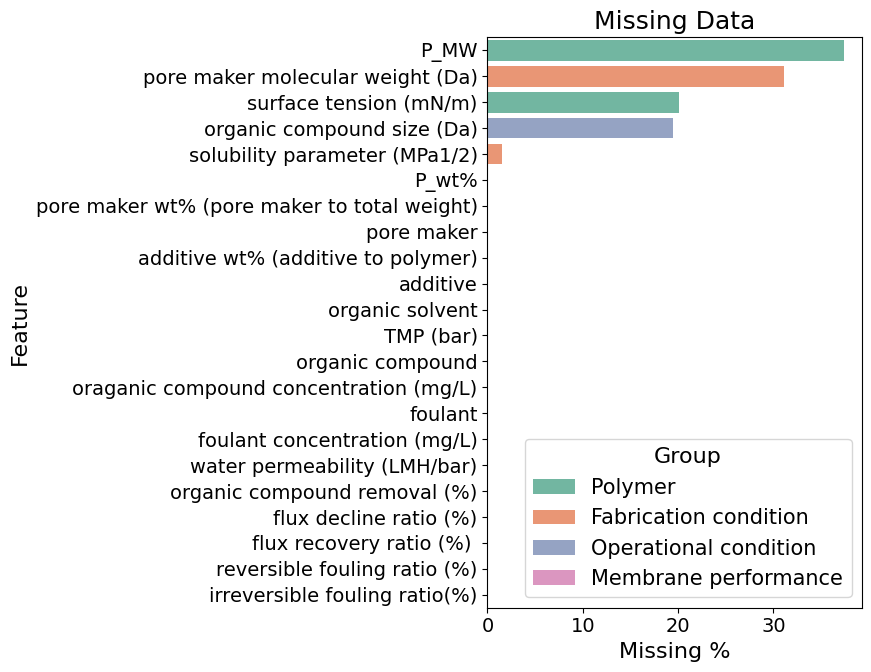

,Group,Feature,Missing Count,Missing %
0,Polymer,P_MW,119,37.421384
4,Fabrication condition,pore maker molecular weight (Da),99,31.132075
1,Polymer,surface tension (mN/m),64,20.125786
13,Operational condition,organic compound size (Da),62,19.496855
9,Fabrication condition,solubility parameter (MPa1/2),5,1.572327
2,Fabrication condition,P_wt%,0,0.000000
5,Fabrication condition,pore maker wt% (pore maker to total weight),0,0.000000
3,Fabrication condition,pore maker,0,0.000000
7,Fabrication condition,additive wt% (additive to polymer),0,0.000000
6,Fabrication condition,additive,0,0.000000


In [ ]:
plot_missingness_by_groups(raw_data_ultrafiltration, feature_space,figsize=(9,7))

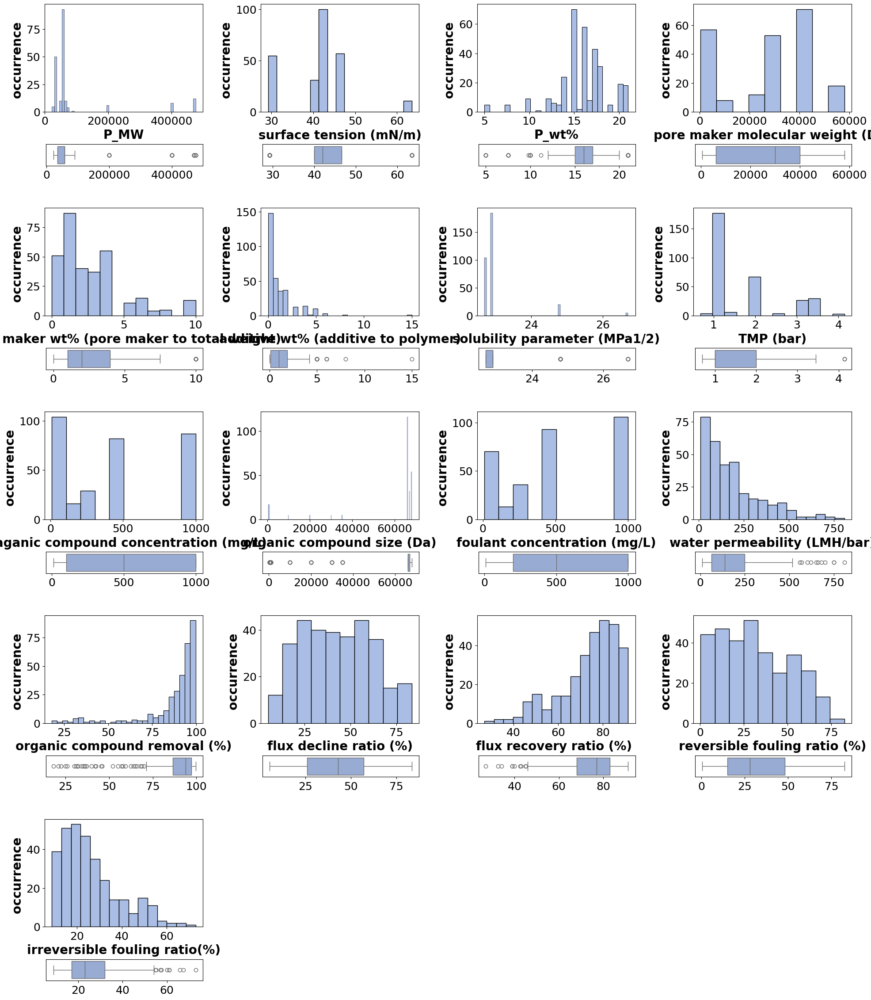

In [ ]:
distribution_plot(df=raw_data_ultrafiltration, parameters=all_features, columns_per_row=4, log_cutoff=10000000,figsize=(20,24),title = "")

In [ ]:
categorical_params =  [
  'organic solvent',
  'additive',
  'pore maker',
  'organic compound',
  'foulant',
  ]

In [ ]:
ord_encoder = OrdinalEncoder()
ord_encoder.fit_transform(raw_data_ultrafiltration[categorical_params])
raw_data_ultrafiltration[[f"enc_{col}" for col in categorical_params]] =  ord_encoder.fit_transform(raw_data_ultrafiltration[categorical_params])

*imputation*: Let's impute during the run

In [ ]:
# imputation_features = [
#  'Selective_layer_thickness',
#  'Organic_Hildebrand_solubility_parameter',
#  'Organic_molecular_volume',
#  'Effective_area',
#  'Mass_ratio(A/B)',
#  'Experimental_temperature',
#  'Downstream_pressure',
# ]

*generate count6_512 ECFP *

In [ ]:
raw_data_ultrafiltration

,Polymer,SMILES,P_MW,P_wt%,surface tension (mN/m),pore maker,pore maker molecular weight (Da),pore maker wt% (pore maker to total weight),additive,additive wt% (additive to polymer),...,flux decline ratio (%),flux recovery ratio (%),reversible fouling ratio (%),irreversible fouling ratio(%),DOI,enc_organic solvent,enc_additive,enc_pore maker,enc_organic compound,enc_foulant
0,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,0.0,...,24.00,50.00,26.00,50.00,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
1,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,0.5,...,55.00,80.00,25.00,20.00,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
2,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,1.0,...,63.50,82.00,18.50,18.00,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
3,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,1.5,...,65.50,83.50,18.00,16.50,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
4,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,2.0,...,37.00,62.00,25.00,38.00,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
313,Cellulose acetate,CC(=O)OC[C@H]1O[C@@H](O*)[C@H](OC(C)=O)[C@@H](...,30000.0,16.0,63.55,PEG,400.0,2.0,CNC-2,15.0,...,62.00,83.00,21.00,17.00,10.1016/j.carbpol.2017.06.064,4.0,2.0,0.0,0.0,0.0
314,Cellulose acetate,CC(=O)OC[C@H]1O[C@@H](O*)[C@H](OC(C)=O)[C@@H](...,NaN,15.0,63.55,PVP,25000.0,2.0,none,0.0,...,25.18,60.18,35.00,39.82,10.1002/app.43946,4.0,69.0,1.0,0.0,0.0
315,Cellulose acetate,CC(=O)OC[C@H]1O[C@@H](O*)[C@H](OC(C)=O)[C@@H](...,NaN,15.0,63.55,PVP,25000.0,2.0,CNC-3,0.5,...,30.00,68.00,38.00,32.00,10.1002/app.43946,4.0,3.0,1.0,0.0,0.0
316,Cellulose acetate,CC(=O)OC[C@H]1O[C@@H](O*)[C@H](OC(C)=O)[C@@H](...,NaN,15.0,63.55,PVP,25000.0,2.0,CNC-3,1.2,...,30.24,72.24,42.00,27.76,10.1002/app.43946,4.0,3.0,1.0,0.0,0.0


In [ ]:
raw_data_ultrafiltration = ECFP_Processor(raw_data_ultrafiltration, column='SMILES',new_unit_name='polymer').main_ecfp([3], [512], count_vector= True)
raw_data_ultrafiltration = ECFP_Processor(raw_data_ultrafiltration, column='SMILES',new_unit_name='polymer').main_ecfp([3], [512], count_vector= False)


Done with generating polymer_ECFP6_count_512bits
Done with generating polymer_ECFP6_binary_512bits


In [ ]:
unique_polymers = raw_data_ultrafiltration.drop_duplicates(subset=['SMILES']).reset_index(drop=True)
unique_polymers.shape

(11, 32)

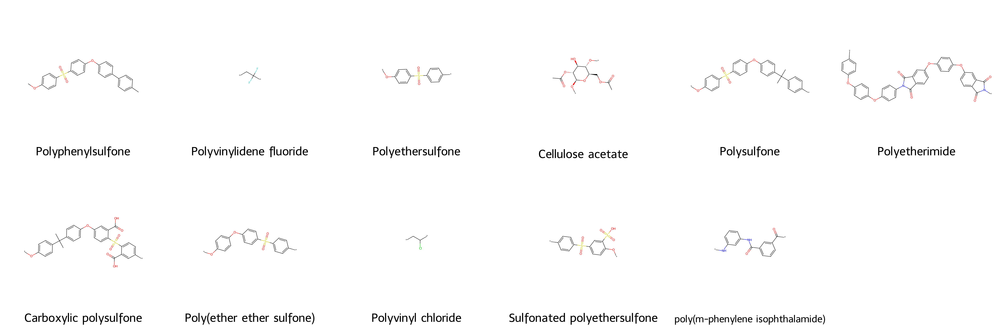

In [ ]:
display_molecules(unique_polymers,'SMILES','Polymer')

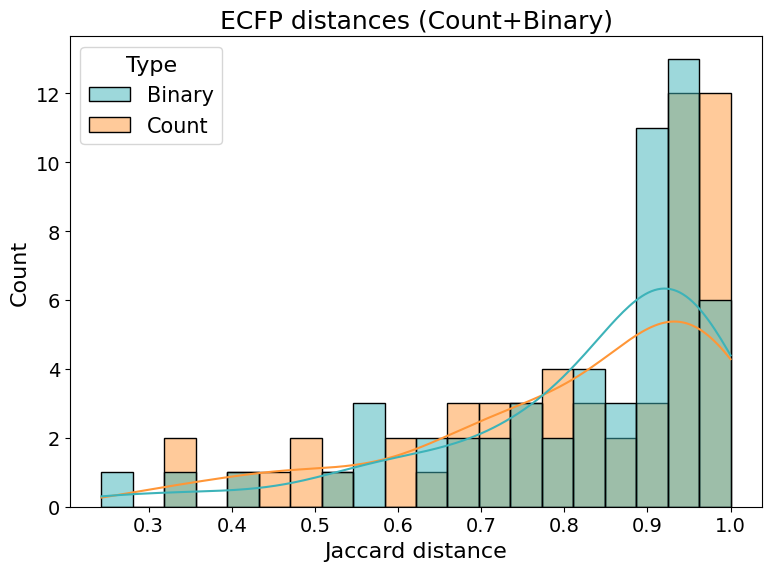

In [ ]:
binary_array = np.array(unique_polymers['polymer_ECFP6_binary_512bits'].tolist())
count_array  = np.array(unique_polymers['polymer_ECFP6_count_512bits'].tolist())

# Compute pairwise distances
binary_tanimoto_similarities = pdist(binary_array, metric="jaccard")
count_tanimoto_similarities  = pdist(count_array, metric=weighted_jaccard)

# Build dataframe
data = pd.DataFrame({
    "Similarity": np.concatenate([binary_tanimoto_similarities, count_tanimoto_similarities]),
    "Type": (["Binary"] * len(binary_tanimoto_similarities)) +
            (["Count"] * len(count_tanimoto_similarities))
})

palette = {"Binary": "#3DB3B9", "Count": "#FF9637"}

# Plot
plt.figure(figsize=(8, 6))
sns.histplot(data=data, x="Similarity", hue="Type", kde=True, bins=20, palette=palette)
plt.title("ECFP distances (Count+Binary)")
plt.xlabel("Jaccard distance")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

In [ ]:
raw_data_ultrafiltration.to_pickle(saving_folder/'cleaned_dataset_Ultrafiltration Membrane.pkl')
raw_data_ultrafiltration.to_csv(saving_folder/'cleaned_dataset_Ultrafiltration Membrane.csv')

## Evolving an Accurate Decision Tree-Based Model for Predicting Carbon Dioxide Solubility in Polymers

Specification


*   515 datapoints
*   13 polymer





https://doi.org/10.1002/ceat.201900096

###Clone & read data

In [ ]:
saving_folder=data_folder/'Evolving an Accurate Decision Tree-Based Model for Predicting Carbon Dioxide Solubility in Polymers'
raw_data_membranes = pd.read_excel(saving_folder/'raw_Evolving an Accurate Decision Tree-Based Model.xlsx')

NameError: name 'data_folder' is not defined

###Analysis

In [ ]:
print('#polymers:', raw_data_membranes['Monomer A1 type'].nunique())
raw_data_membranes.head()


#polymers: 36


,Monomer A1 type,Monomer A2 type,A1/A2 ratio,"Monomer A concentration, wt%",Monomer B type,"Monomer B concentration, wt%",Organic solvent type,Additive X1 type in aqueous phase,"Additive X1 concentration, wt%",Additive X2 type in aqueous phase,...,"Na2SO4 concentration, ppm","MgCl2 concentration, ppm","CaCl2 Concentration, ppm","Permeability, LMH/bar","NaCl rejection, %","Mg2SO4 rejection, %","Na2SO4 rejection, %","MgCl2 rejection, %","CaCl2 rejection, %",Literature DOI
0,Piperazine,NaN,NaN,0.2,trimesoyl chloride (265.5),0.2,hexane,NaN,NaN,NaN,...,1000.0,1000.0,NaN,7.5,NaN,87.0,86.0,10.0,NaN,10.1016/j.desal.2013.11.035
1,Piperazine,NaN,NaN,0.5,trimesoyl chloride (265.5),0.1,Isoparaphin-G,NaN,NaN,NaN,...,500.0,NaN,NaN,7.0,NaN,NaN,98.0,NaN,NaN,10.1016/j.memsci.2009.03.011
2,Piperazine,NaN,NaN,1.5,"3,3′,5,5′-biphenyl tetraacyl chloride (330.25)",0.1,Isoparaphin-G,NaN,NaN,NaN,...,500.0,NaN,NaN,4.0,NaN,NaN,92.5,NaN,NaN,10.1016/j.memsci.2009.03.011
3,Piperazine,NaN,NaN,1.0,"3,3′,5,5′-biphenyl tetraacyl chloride (330.25)",0.1,Isoparaphin-G,NaN,NaN,NaN,...,500.0,NaN,NaN,8.6,NaN,NaN,93.0,NaN,NaN,10.1016/j.memsci.2009.03.011
4,Piperazine,NaN,NaN,0.5,"3,3′,5,5′-biphenyl tetraacyl chloride (330.25)",0.1,Isoparaphin-G,NaN,NaN,NaN,...,500.0,NaN,NaN,10.3,65.0,92.0,95.0,NaN,NaN,10.1016/j.memsci.2009.03.011


In [ ]:
raw_data_ultrafiltration.columns.to_list()

['Index',
 'Polymer',
 'Contact angle θ （°）',
 'Thickness ℓ (um)',
 'Mixture (w/o)',
 'Solvent solubility parameter （MPa1/2）',
 'xw (wt%)',
 'Temperature (°C)',
 'Permeate pressure (mbar)',
 'Total flux (kg/m2h)',
 'Separation factor (w/o)',
 'DOI']

In [ ]:
feature_space = {
        "Polymer":[
              'P_MW',
              'surface tension (mN/m)',
        ],

        "Fabrication condition": [
              'P_wt%',
              'pore maker',
              'pore maker molecular weight (Da)',
              'pore maker wt% (pore maker to total weight)',
              'additive',
              'additive wt% (additive to polymer)',
              'organic solvent',
              'solubility parameter (MPa1/2)',
              ],

        # 'Membrane property': [
        #       'Organic_Hildebrand_solubility_parameter',
        #       'Organic_molecular_volume'

        # ],

        'Operational condition': [
            'TMP (bar)',
            'organic compound',
            'oraganic compound concentration (mg/L)',
            'organic compound size (Da)',
            'foulant',
            'foulant concentration (mg/L)',

        ],

        'Membrane performance': [
            'water permeability (LMH/bar)',
            'organic compound removal (%)',
            'flux decline ratio (%)',
            'flux recovery ratio (%) ',
            'reversible fouling ratio (%)',
            'irreversible fouling ratio(%)',
        ]
              }

all_features = [
    item
    for sublist in feature_space.values()
    for item in sublist
    if item in raw_data_ultrafiltration.columns
       and raw_data_ultrafiltration[item].dtype != "object"
]

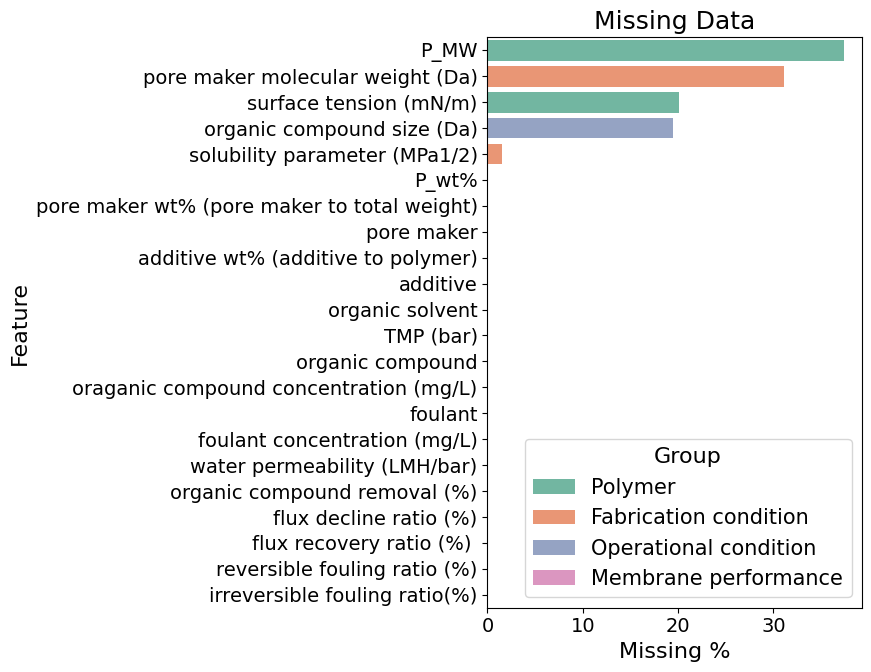

,Group,Feature,Missing Count,Missing %
0,Polymer,P_MW,119,37.421384
4,Fabrication condition,pore maker molecular weight (Da),99,31.132075
1,Polymer,surface tension (mN/m),64,20.125786
13,Operational condition,organic compound size (Da),62,19.496855
9,Fabrication condition,solubility parameter (MPa1/2),5,1.572327
2,Fabrication condition,P_wt%,0,0.000000
5,Fabrication condition,pore maker wt% (pore maker to total weight),0,0.000000
3,Fabrication condition,pore maker,0,0.000000
7,Fabrication condition,additive wt% (additive to polymer),0,0.000000
6,Fabrication condition,additive,0,0.000000


In [ ]:
plot_missingness_by_groups(raw_data_ultrafiltration, feature_space,figsize=(9,7))

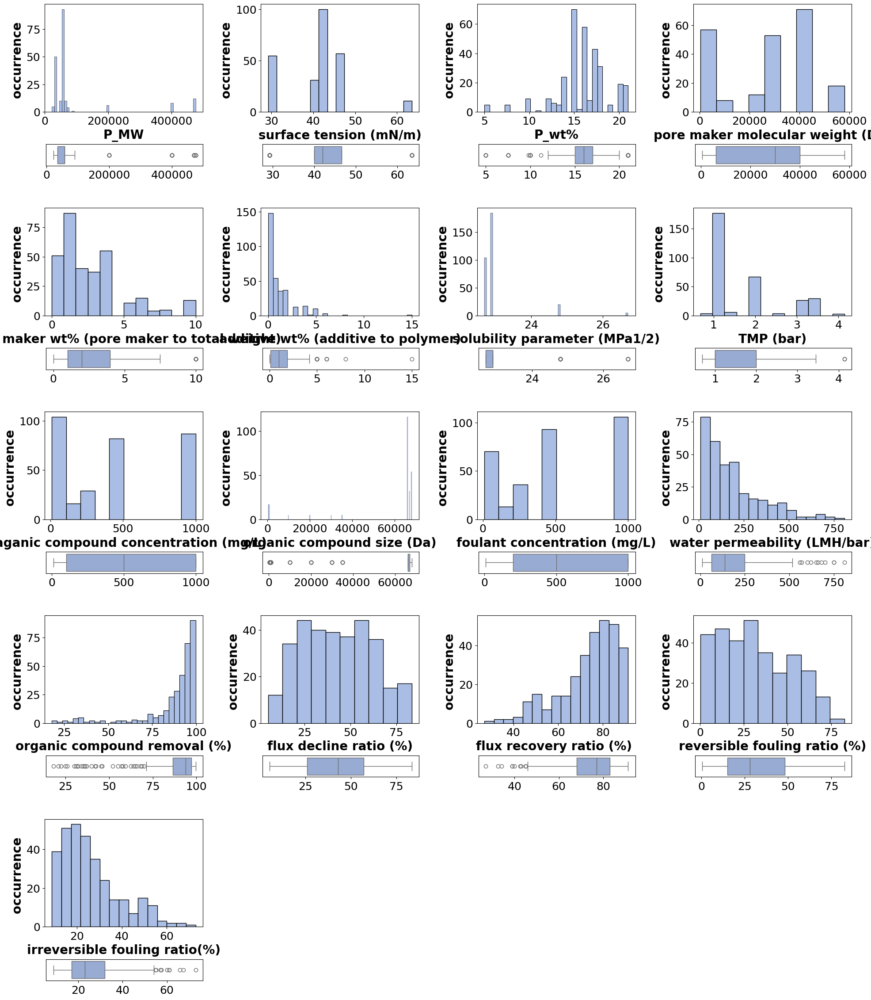

In [ ]:
distribution_plot(df=raw_data_ultrafiltration, parameters=all_features, columns_per_row=4, log_cutoff=10000000,figsize=(20,24),title = "")

In [ ]:
categorical_params =  [
  'organic solvent',
  'additive',
  'pore maker',
  'organic compound',
  'foulant',
  ]

In [ ]:
ord_encoder = OrdinalEncoder()
ord_encoder.fit_transform(raw_data_ultrafiltration[categorical_params])
raw_data_ultrafiltration[[f"enc_{col}" for col in categorical_params]] =  ord_encoder.fit_transform(raw_data_ultrafiltration[categorical_params])

*imputation*: Let's impute during the run

In [ ]:
# imputation_features = [
#  'Selective_layer_thickness',
#  'Organic_Hildebrand_solubility_parameter',
#  'Organic_molecular_volume',
#  'Effective_area',
#  'Mass_ratio(A/B)',
#  'Experimental_temperature',
#  'Downstream_pressure',
# ]

*generate count6_512 ECFP *

In [ ]:
raw_data_ultrafiltration

,Polymer,SMILES,P_MW,P_wt%,surface tension (mN/m),pore maker,pore maker molecular weight (Da),pore maker wt% (pore maker to total weight),additive,additive wt% (additive to polymer),...,flux decline ratio (%),flux recovery ratio (%),reversible fouling ratio (%),irreversible fouling ratio(%),DOI,enc_organic solvent,enc_additive,enc_pore maker,enc_organic compound,enc_foulant
0,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,0.0,...,24.00,50.00,26.00,50.00,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
1,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,0.5,...,55.00,80.00,25.00,20.00,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
2,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,1.0,...,63.50,82.00,18.50,18.00,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
3,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,1.5,...,65.50,83.50,18.00,16.50,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
4,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,2.0,...,37.00,62.00,25.00,38.00,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
313,Cellulose acetate,CC(=O)OC[C@H]1O[C@@H](O*)[C@H](OC(C)=O)[C@@H](...,30000.0,16.0,63.55,PEG,400.0,2.0,CNC-2,15.0,...,62.00,83.00,21.00,17.00,10.1016/j.carbpol.2017.06.064,4.0,2.0,0.0,0.0,0.0
314,Cellulose acetate,CC(=O)OC[C@H]1O[C@@H](O*)[C@H](OC(C)=O)[C@@H](...,NaN,15.0,63.55,PVP,25000.0,2.0,none,0.0,...,25.18,60.18,35.00,39.82,10.1002/app.43946,4.0,69.0,1.0,0.0,0.0
315,Cellulose acetate,CC(=O)OC[C@H]1O[C@@H](O*)[C@H](OC(C)=O)[C@@H](...,NaN,15.0,63.55,PVP,25000.0,2.0,CNC-3,0.5,...,30.00,68.00,38.00,32.00,10.1002/app.43946,4.0,3.0,1.0,0.0,0.0
316,Cellulose acetate,CC(=O)OC[C@H]1O[C@@H](O*)[C@H](OC(C)=O)[C@@H](...,NaN,15.0,63.55,PVP,25000.0,2.0,CNC-3,1.2,...,30.24,72.24,42.00,27.76,10.1002/app.43946,4.0,3.0,1.0,0.0,0.0


In [ ]:
raw_data_ultrafiltration = ECFP_Processor(raw_data_ultrafiltration, column='SMILES',new_unit_name='polymer').main_ecfp([3], [512], count_vector= True)
raw_data_ultrafiltration = ECFP_Processor(raw_data_ultrafiltration, column='SMILES',new_unit_name='polymer').main_ecfp([3], [512], count_vector= False)


Done with generating polymer_ECFP6_count_512bits
Done with generating polymer_ECFP6_binary_512bits


In [ ]:
unique_polymers = raw_data_ultrafiltration.drop_duplicates(subset=['SMILES']).reset_index(drop=True)
unique_polymers.shape

(11, 32)

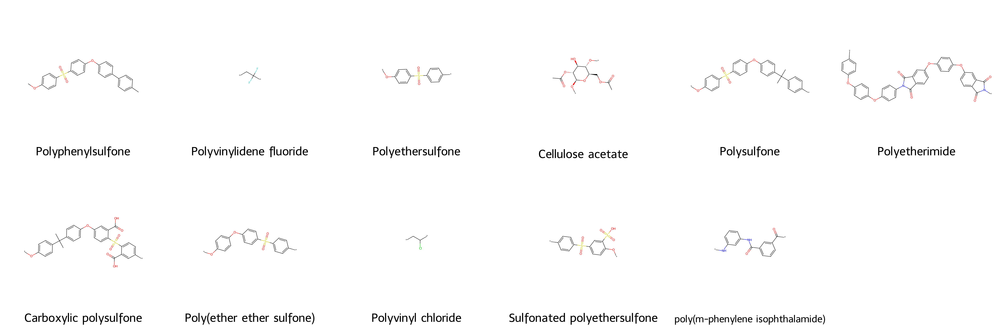

In [ ]:
display_molecules(unique_polymers,'SMILES','Polymer')

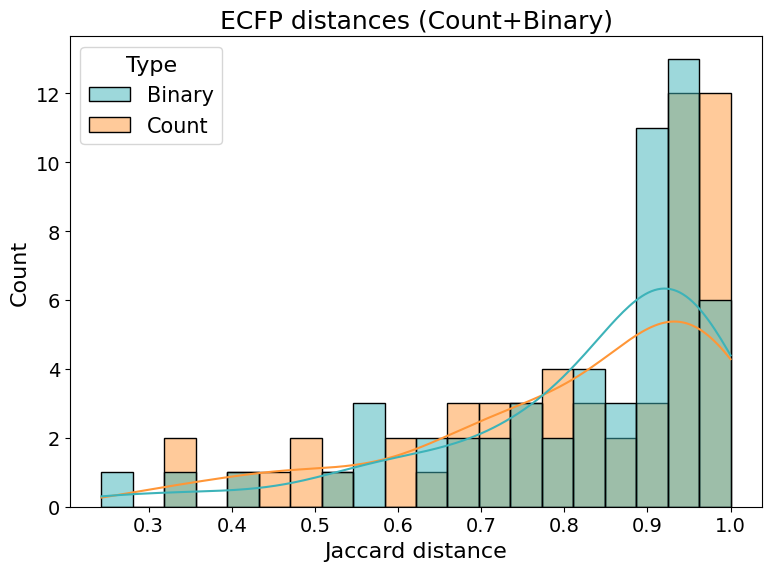

In [ ]:
binary_array = np.array(unique_polymers['polymer_ECFP6_binary_512bits'].tolist())
count_array  = np.array(unique_polymers['polymer_ECFP6_count_512bits'].tolist())

# Compute pairwise distances
binary_tanimoto_similarities = pdist(binary_array, metric="jaccard")
count_tanimoto_similarities  = pdist(count_array, metric=weighted_jaccard)

# Build dataframe
data = pd.DataFrame({
    "Similarity": np.concatenate([binary_tanimoto_similarities, count_tanimoto_similarities]),
    "Type": (["Binary"] * len(binary_tanimoto_similarities)) +
            (["Count"] * len(count_tanimoto_similarities))
})

palette = {"Binary": "#3DB3B9", "Count": "#FF9637"}

# Plot
plt.figure(figsize=(8, 6))
sns.histplot(data=data, x="Similarity", hue="Type", kde=True, bins=20, palette=palette)
plt.title("ECFP distances (Count+Binary)")
plt.xlabel("Jaccard distance")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

In [ ]:
raw_data_ultrafiltration.to_pickle(saving_folder/'cleaned_dataset_Ultrafiltration Membrane.pkl')
raw_data_ultrafiltration.to_csv(saving_folder/'cleaned_dataset_Ultrafiltration Membrane.csv')

## FreeSolv: a database of experimental and calculated hydration free energies, with input files

---

(lacks smiles)

Specification


*   642 datapoints
*   642 molecules





http://dx.doi.org/10.1007/s10822-014-9747-x

###Clone & read data

In [ ]:
import pickle
saving_folder=data_folder/'FreeSolv: a database of experimental and calculated hydration free energies, with input files'
# raw_data_membranes = pd.read_pickle(saving_folder/'database.pickle')
with open(saving_folder/'database.pickle', "rb") as f:
    raw_data = pickle.load(f)

###Analysis

In [ ]:
raw_df = pd.DataFrame(raw_data)
raw_df = raw_df.T
raw_df.columns.to_list()

['calc_h',
 'd_charging',
 'PubChemID',
 'iupac',
 'expt_h_reference',
 'groups',
 'h_solv',
 'smiles',
 'd_calc_h',
 'calc_s (cal/mol.K)',
 'calc_vdw',
 'notes',
 'expt_reference',
 'd_h_conf',
 'd_expt_s (cal/K.mol)',
 'd_calc',
 'expt',
 'calc_charging',
 'd_expt',
 'd_vdw',
 'h_conf',
 'd_expt_h',
 'expt_s (cal/K.mol)',
 'd_calc_s (cal/mol.K)',
 'expt_h',
 'calc',
 'nickname',
 'd_h_solv',
 'calc_reference']

In [ ]:
raw_df['smiles'].nunique()

642

In [ ]:
(raw_df["expt_s (cal/K.mol)"] == "Not available").sum()


np.int64(631)

In [ ]:
print('#polymers:', raw_data_membranes['Monomer A1 type'].nunique())
raw_data_membranes.head()


#polymers: 36


,Monomer A1 type,Monomer A2 type,A1/A2 ratio,"Monomer A concentration, wt%",Monomer B type,"Monomer B concentration, wt%",Organic solvent type,Additive X1 type in aqueous phase,"Additive X1 concentration, wt%",Additive X2 type in aqueous phase,...,"Na2SO4 concentration, ppm","MgCl2 concentration, ppm","CaCl2 Concentration, ppm","Permeability, LMH/bar","NaCl rejection, %","Mg2SO4 rejection, %","Na2SO4 rejection, %","MgCl2 rejection, %","CaCl2 rejection, %",Literature DOI
0,Piperazine,NaN,NaN,0.2,trimesoyl chloride (265.5),0.2,hexane,NaN,NaN,NaN,...,1000.0,1000.0,NaN,7.5,NaN,87.0,86.0,10.0,NaN,10.1016/j.desal.2013.11.035
1,Piperazine,NaN,NaN,0.5,trimesoyl chloride (265.5),0.1,Isoparaphin-G,NaN,NaN,NaN,...,500.0,NaN,NaN,7.0,NaN,NaN,98.0,NaN,NaN,10.1016/j.memsci.2009.03.011
2,Piperazine,NaN,NaN,1.5,"3,3′,5,5′-biphenyl tetraacyl chloride (330.25)",0.1,Isoparaphin-G,NaN,NaN,NaN,...,500.0,NaN,NaN,4.0,NaN,NaN,92.5,NaN,NaN,10.1016/j.memsci.2009.03.011
3,Piperazine,NaN,NaN,1.0,"3,3′,5,5′-biphenyl tetraacyl chloride (330.25)",0.1,Isoparaphin-G,NaN,NaN,NaN,...,500.0,NaN,NaN,8.6,NaN,NaN,93.0,NaN,NaN,10.1016/j.memsci.2009.03.011
4,Piperazine,NaN,NaN,0.5,"3,3′,5,5′-biphenyl tetraacyl chloride (330.25)",0.1,Isoparaphin-G,NaN,NaN,NaN,...,500.0,NaN,NaN,10.3,65.0,92.0,95.0,NaN,NaN,10.1016/j.memsci.2009.03.011


In [ ]:
raw_data_ultrafiltration.columns.to_list()

['Index',
 'Polymer',
 'Contact angle θ （°）',
 'Thickness ℓ (um)',
 'Mixture (w/o)',
 'Solvent solubility parameter （MPa1/2）',
 'xw (wt%)',
 'Temperature (°C)',
 'Permeate pressure (mbar)',
 'Total flux (kg/m2h)',
 'Separation factor (w/o)',
 'DOI']

In [ ]:
feature_space = {
        "Polymer":[
              'P_MW',
              'surface tension (mN/m)',
        ],

        "Fabrication condition": [
              'P_wt%',
              'pore maker',
              'pore maker molecular weight (Da)',
              'pore maker wt% (pore maker to total weight)',
              'additive',
              'additive wt% (additive to polymer)',
              'organic solvent',
              'solubility parameter (MPa1/2)',
              ],

        # 'Membrane property': [
        #       'Organic_Hildebrand_solubility_parameter',
        #       'Organic_molecular_volume'

        # ],

        'Operational condition': [
            'TMP (bar)',
            'organic compound',
            'oraganic compound concentration (mg/L)',
            'organic compound size (Da)',
            'foulant',
            'foulant concentration (mg/L)',

        ],

        'Membrane performance': [
            'water permeability (LMH/bar)',
            'organic compound removal (%)',
            'flux decline ratio (%)',
            'flux recovery ratio (%) ',
            'reversible fouling ratio (%)',
            'irreversible fouling ratio(%)',
        ]
              }

all_features = [
    item
    for sublist in feature_space.values()
    for item in sublist
    if item in raw_data_ultrafiltration.columns
       and raw_data_ultrafiltration[item].dtype != "object"
]

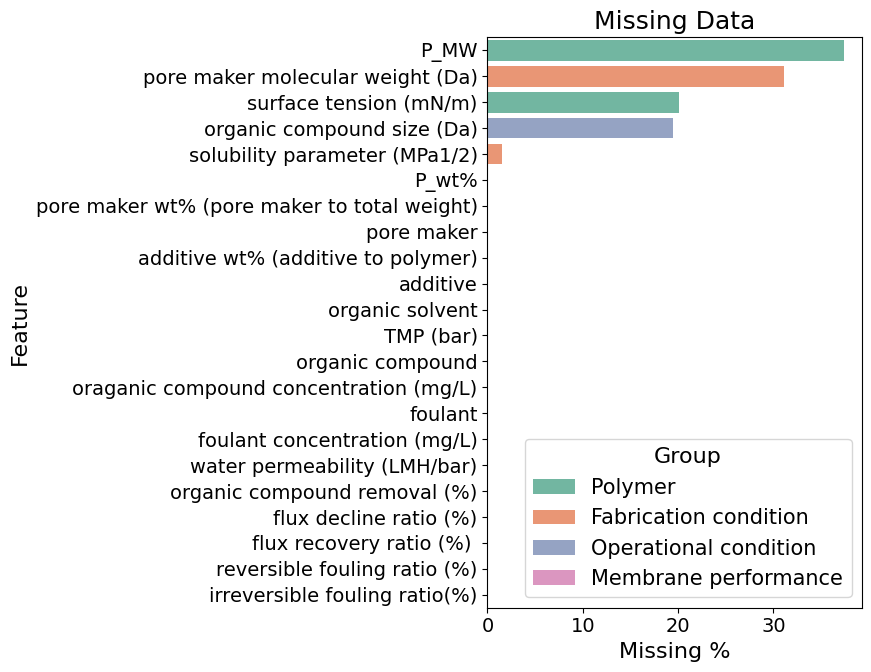

,Group,Feature,Missing Count,Missing %
0,Polymer,P_MW,119,37.421384
4,Fabrication condition,pore maker molecular weight (Da),99,31.132075
1,Polymer,surface tension (mN/m),64,20.125786
13,Operational condition,organic compound size (Da),62,19.496855
9,Fabrication condition,solubility parameter (MPa1/2),5,1.572327
2,Fabrication condition,P_wt%,0,0.000000
5,Fabrication condition,pore maker wt% (pore maker to total weight),0,0.000000
3,Fabrication condition,pore maker,0,0.000000
7,Fabrication condition,additive wt% (additive to polymer),0,0.000000
6,Fabrication condition,additive,0,0.000000


In [ ]:
plot_missingness_by_groups(raw_data_ultrafiltration, feature_space,figsize=(9,7))

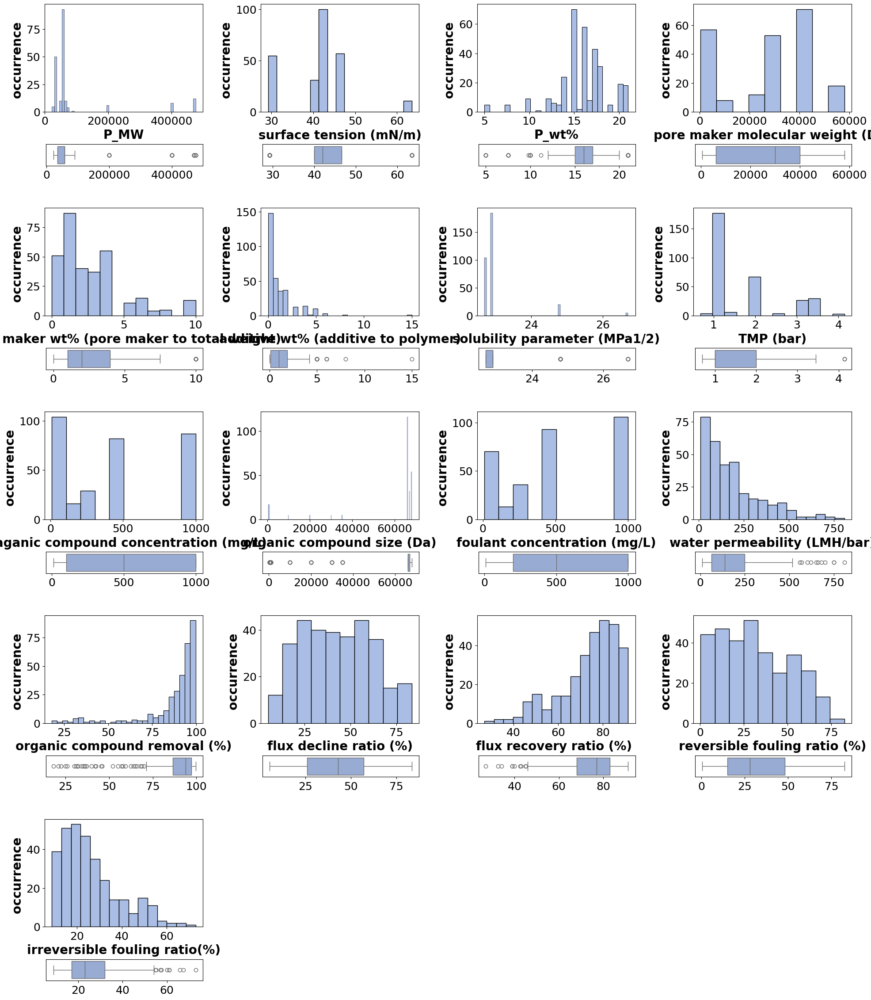

In [ ]:
distribution_plot(df=raw_data_ultrafiltration, parameters=all_features, columns_per_row=4, log_cutoff=10000000,figsize=(20,24),title = "")

In [ ]:
categorical_params =  [
  'organic solvent',
  'additive',
  'pore maker',
  'organic compound',
  'foulant',
  ]

In [ ]:
ord_encoder = OrdinalEncoder()
ord_encoder.fit_transform(raw_data_ultrafiltration[categorical_params])
raw_data_ultrafiltration[[f"enc_{col}" for col in categorical_params]] =  ord_encoder.fit_transform(raw_data_ultrafiltration[categorical_params])

*imputation*: Let's impute during the run

In [ ]:
# imputation_features = [
#  'Selective_layer_thickness',
#  'Organic_Hildebrand_solubility_parameter',
#  'Organic_molecular_volume',
#  'Effective_area',
#  'Mass_ratio(A/B)',
#  'Experimental_temperature',
#  'Downstream_pressure',
# ]

*generate count6_512 ECFP *

In [ ]:
raw_data_ultrafiltration

,Polymer,SMILES,P_MW,P_wt%,surface tension (mN/m),pore maker,pore maker molecular weight (Da),pore maker wt% (pore maker to total weight),additive,additive wt% (additive to polymer),...,flux decline ratio (%),flux recovery ratio (%),reversible fouling ratio (%),irreversible fouling ratio(%),DOI,enc_organic solvent,enc_additive,enc_pore maker,enc_organic compound,enc_foulant
0,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,0.0,...,24.00,50.00,26.00,50.00,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
1,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,0.5,...,55.00,80.00,25.00,20.00,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
2,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,1.0,...,63.50,82.00,18.50,18.00,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
3,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,1.5,...,65.50,83.50,18.00,16.50,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
4,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,2.0,...,37.00,62.00,25.00,38.00,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
313,Cellulose acetate,CC(=O)OC[C@H]1O[C@@H](O*)[C@H](OC(C)=O)[C@@H](...,30000.0,16.0,63.55,PEG,400.0,2.0,CNC-2,15.0,...,62.00,83.00,21.00,17.00,10.1016/j.carbpol.2017.06.064,4.0,2.0,0.0,0.0,0.0
314,Cellulose acetate,CC(=O)OC[C@H]1O[C@@H](O*)[C@H](OC(C)=O)[C@@H](...,NaN,15.0,63.55,PVP,25000.0,2.0,none,0.0,...,25.18,60.18,35.00,39.82,10.1002/app.43946,4.0,69.0,1.0,0.0,0.0
315,Cellulose acetate,CC(=O)OC[C@H]1O[C@@H](O*)[C@H](OC(C)=O)[C@@H](...,NaN,15.0,63.55,PVP,25000.0,2.0,CNC-3,0.5,...,30.00,68.00,38.00,32.00,10.1002/app.43946,4.0,3.0,1.0,0.0,0.0
316,Cellulose acetate,CC(=O)OC[C@H]1O[C@@H](O*)[C@H](OC(C)=O)[C@@H](...,NaN,15.0,63.55,PVP,25000.0,2.0,CNC-3,1.2,...,30.24,72.24,42.00,27.76,10.1002/app.43946,4.0,3.0,1.0,0.0,0.0


In [ ]:
raw_data_ultrafiltration = ECFP_Processor(raw_data_ultrafiltration, column='SMILES',new_unit_name='polymer').main_ecfp([3], [512], count_vector= True)
raw_data_ultrafiltration = ECFP_Processor(raw_data_ultrafiltration, column='SMILES',new_unit_name='polymer').main_ecfp([3], [512], count_vector= False)


Done with generating polymer_ECFP6_count_512bits
Done with generating polymer_ECFP6_binary_512bits


In [ ]:
unique_polymers = raw_data_ultrafiltration.drop_duplicates(subset=['SMILES']).reset_index(drop=True)
unique_polymers.shape

(11, 32)

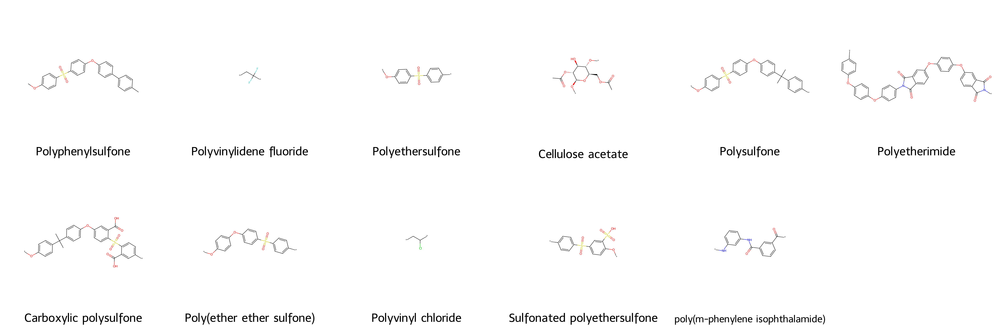

In [ ]:
display_molecules(unique_polymers,'SMILES','Polymer')

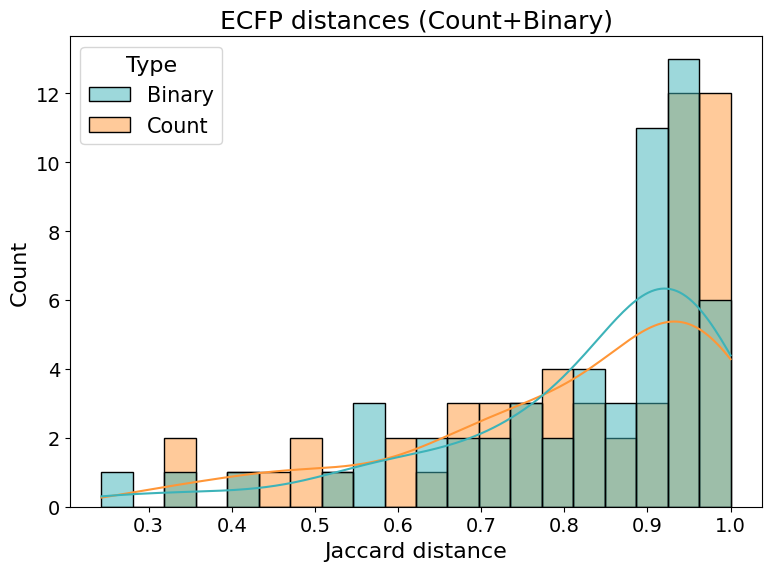

In [ ]:
binary_array = np.array(unique_polymers['polymer_ECFP6_binary_512bits'].tolist())
count_array  = np.array(unique_polymers['polymer_ECFP6_count_512bits'].tolist())

# Compute pairwise distances
binary_tanimoto_similarities = pdist(binary_array, metric="jaccard")
count_tanimoto_similarities  = pdist(count_array, metric=weighted_jaccard)

# Build dataframe
data = pd.DataFrame({
    "Similarity": np.concatenate([binary_tanimoto_similarities, count_tanimoto_similarities]),
    "Type": (["Binary"] * len(binary_tanimoto_similarities)) +
            (["Count"] * len(count_tanimoto_similarities))
})

palette = {"Binary": "#3DB3B9", "Count": "#FF9637"}

# Plot
plt.figure(figsize=(8, 6))
sns.histplot(data=data, x="Similarity", hue="Type", kde=True, bins=20, palette=palette)
plt.title("ECFP distances (Count+Binary)")
plt.xlabel("Jaccard distance")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

In [ ]:
raw_data_ultrafiltration.to_pickle(saving_folder/'cleaned_dataset_Ultrafiltration Membrane.pkl')
raw_data_ultrafiltration.to_csv(saving_folder/'cleaned_dataset_Ultrafiltration Membrane.csv')

## The Photoswitch Dataset: A Molecular Machine Learning Benchmark for the Advancement of Synthetic Chemistry


---

(lacks smiles)

Specification


*   402 datapoints
*   392 molecules





https://doi.org/10.26434/chemrxiv.12609899.v1

###Clone & read data

In [ ]:
import pickle
saving_folder=data_folder/'FreeSolv: a database of experimental and calculated hydration free energies, with input files'
# raw_data_membranes = pd.read_pickle(saving_folder/'database.pickle')
with open(saving_folder/'database.pickle', "rb") as f:
    raw_data = pickle.load(f)

###Analysis

In [ ]:
raw_df = pd.DataFrame(raw_data)
raw_df = raw_df.T
raw_df.columns.to_list()

['calc_h',
 'd_charging',
 'PubChemID',
 'iupac',
 'expt_h_reference',
 'groups',
 'h_solv',
 'smiles',
 'd_calc_h',
 'calc_s (cal/mol.K)',
 'calc_vdw',
 'notes',
 'expt_reference',
 'd_h_conf',
 'd_expt_s (cal/K.mol)',
 'd_calc',
 'expt',
 'calc_charging',
 'd_expt',
 'd_vdw',
 'h_conf',
 'd_expt_h',
 'expt_s (cal/K.mol)',
 'd_calc_s (cal/mol.K)',
 'expt_h',
 'calc',
 'nickname',
 'd_h_solv',
 'calc_reference']

In [ ]:
raw_df['smiles'].nunique()

642

In [ ]:
(raw_df["expt_s (cal/K.mol)"] == "Not available").sum()


np.int64(631)

In [ ]:
print('#polymers:', raw_data_membranes['Monomer A1 type'].nunique())
raw_data_membranes.head()


#polymers: 36


,Monomer A1 type,Monomer A2 type,A1/A2 ratio,"Monomer A concentration, wt%",Monomer B type,"Monomer B concentration, wt%",Organic solvent type,Additive X1 type in aqueous phase,"Additive X1 concentration, wt%",Additive X2 type in aqueous phase,...,"Na2SO4 concentration, ppm","MgCl2 concentration, ppm","CaCl2 Concentration, ppm","Permeability, LMH/bar","NaCl rejection, %","Mg2SO4 rejection, %","Na2SO4 rejection, %","MgCl2 rejection, %","CaCl2 rejection, %",Literature DOI
0,Piperazine,NaN,NaN,0.2,trimesoyl chloride (265.5),0.2,hexane,NaN,NaN,NaN,...,1000.0,1000.0,NaN,7.5,NaN,87.0,86.0,10.0,NaN,10.1016/j.desal.2013.11.035
1,Piperazine,NaN,NaN,0.5,trimesoyl chloride (265.5),0.1,Isoparaphin-G,NaN,NaN,NaN,...,500.0,NaN,NaN,7.0,NaN,NaN,98.0,NaN,NaN,10.1016/j.memsci.2009.03.011
2,Piperazine,NaN,NaN,1.5,"3,3′,5,5′-biphenyl tetraacyl chloride (330.25)",0.1,Isoparaphin-G,NaN,NaN,NaN,...,500.0,NaN,NaN,4.0,NaN,NaN,92.5,NaN,NaN,10.1016/j.memsci.2009.03.011
3,Piperazine,NaN,NaN,1.0,"3,3′,5,5′-biphenyl tetraacyl chloride (330.25)",0.1,Isoparaphin-G,NaN,NaN,NaN,...,500.0,NaN,NaN,8.6,NaN,NaN,93.0,NaN,NaN,10.1016/j.memsci.2009.03.011
4,Piperazine,NaN,NaN,0.5,"3,3′,5,5′-biphenyl tetraacyl chloride (330.25)",0.1,Isoparaphin-G,NaN,NaN,NaN,...,500.0,NaN,NaN,10.3,65.0,92.0,95.0,NaN,NaN,10.1016/j.memsci.2009.03.011


In [ ]:
raw_data_ultrafiltration.columns.to_list()

['Index',
 'Polymer',
 'Contact angle θ （°）',
 'Thickness ℓ (um)',
 'Mixture (w/o)',
 'Solvent solubility parameter （MPa1/2）',
 'xw (wt%)',
 'Temperature (°C)',
 'Permeate pressure (mbar)',
 'Total flux (kg/m2h)',
 'Separation factor (w/o)',
 'DOI']

In [ ]:
feature_space = {
        "Polymer":[
              'P_MW',
              'surface tension (mN/m)',
        ],

        "Fabrication condition": [
              'P_wt%',
              'pore maker',
              'pore maker molecular weight (Da)',
              'pore maker wt% (pore maker to total weight)',
              'additive',
              'additive wt% (additive to polymer)',
              'organic solvent',
              'solubility parameter (MPa1/2)',
              ],

        # 'Membrane property': [
        #       'Organic_Hildebrand_solubility_parameter',
        #       'Organic_molecular_volume'

        # ],

        'Operational condition': [
            'TMP (bar)',
            'organic compound',
            'oraganic compound concentration (mg/L)',
            'organic compound size (Da)',
            'foulant',
            'foulant concentration (mg/L)',

        ],

        'Membrane performance': [
            'water permeability (LMH/bar)',
            'organic compound removal (%)',
            'flux decline ratio (%)',
            'flux recovery ratio (%) ',
            'reversible fouling ratio (%)',
            'irreversible fouling ratio(%)',
        ]
              }

all_features = [
    item
    for sublist in feature_space.values()
    for item in sublist
    if item in raw_data_ultrafiltration.columns
       and raw_data_ultrafiltration[item].dtype != "object"
]

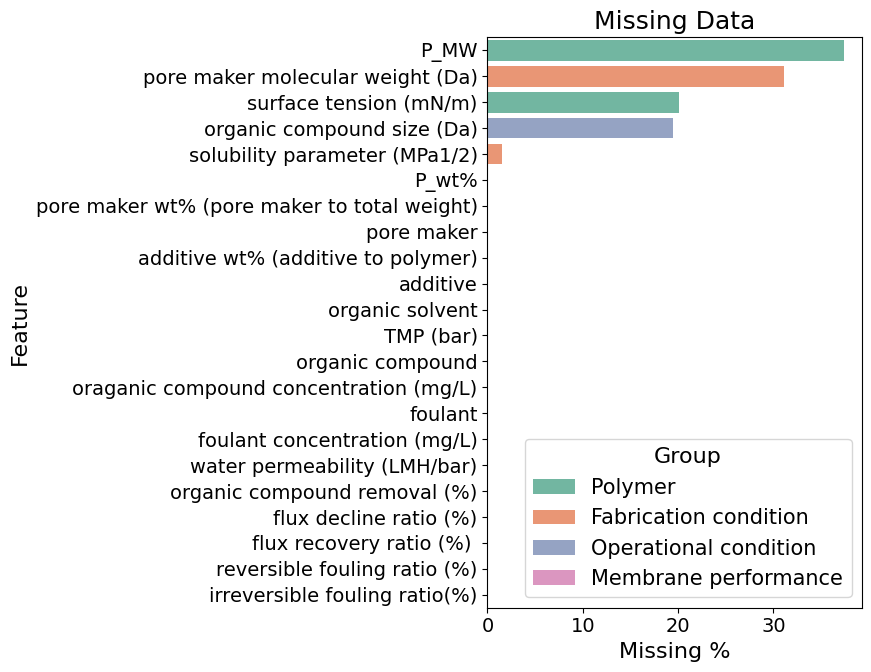

,Group,Feature,Missing Count,Missing %
0,Polymer,P_MW,119,37.421384
4,Fabrication condition,pore maker molecular weight (Da),99,31.132075
1,Polymer,surface tension (mN/m),64,20.125786
13,Operational condition,organic compound size (Da),62,19.496855
9,Fabrication condition,solubility parameter (MPa1/2),5,1.572327
2,Fabrication condition,P_wt%,0,0.000000
5,Fabrication condition,pore maker wt% (pore maker to total weight),0,0.000000
3,Fabrication condition,pore maker,0,0.000000
7,Fabrication condition,additive wt% (additive to polymer),0,0.000000
6,Fabrication condition,additive,0,0.000000


In [ ]:
plot_missingness_by_groups(raw_data_ultrafiltration, feature_space,figsize=(9,7))

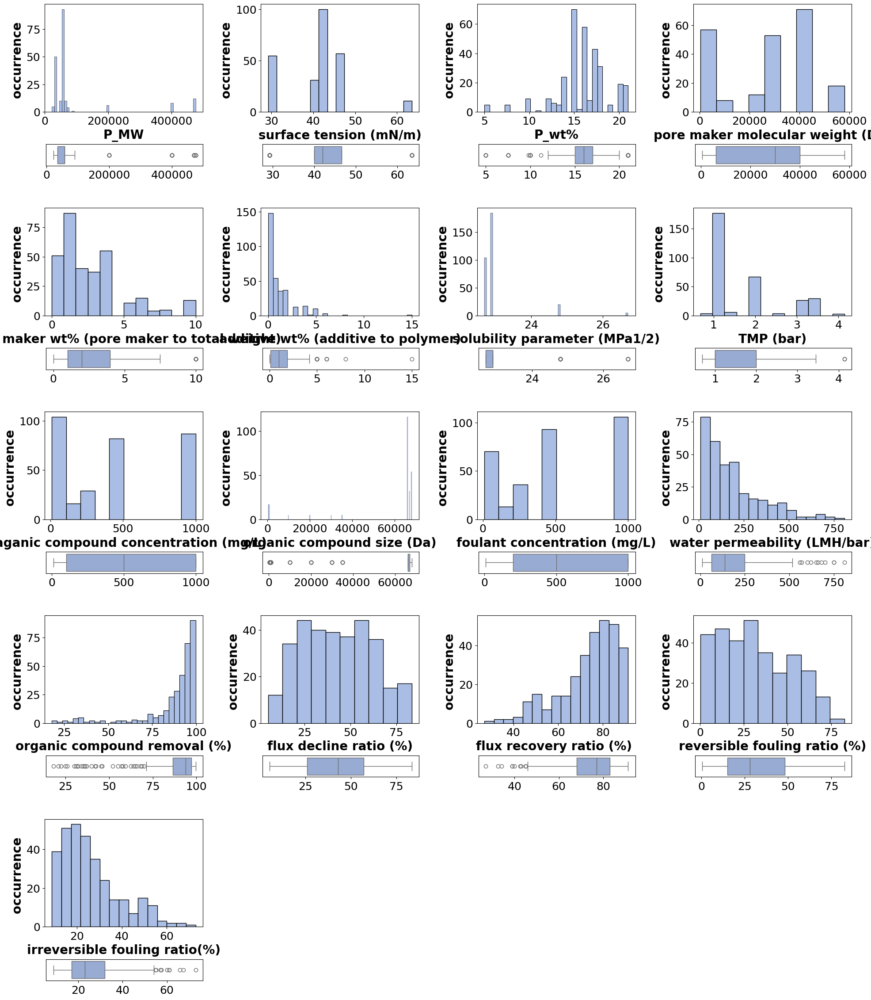

In [ ]:
distribution_plot(df=raw_data_ultrafiltration, parameters=all_features, columns_per_row=4, log_cutoff=10000000,figsize=(20,24),title = "")

In [ ]:
categorical_params =  [
  'organic solvent',
  'additive',
  'pore maker',
  'organic compound',
  'foulant',
  ]

In [ ]:
ord_encoder = OrdinalEncoder()
ord_encoder.fit_transform(raw_data_ultrafiltration[categorical_params])
raw_data_ultrafiltration[[f"enc_{col}" for col in categorical_params]] =  ord_encoder.fit_transform(raw_data_ultrafiltration[categorical_params])

*imputation*: Let's impute during the run

In [ ]:
# imputation_features = [
#  'Selective_layer_thickness',
#  'Organic_Hildebrand_solubility_parameter',
#  'Organic_molecular_volume',
#  'Effective_area',
#  'Mass_ratio(A/B)',
#  'Experimental_temperature',
#  'Downstream_pressure',
# ]

*generate count6_512 ECFP *

In [ ]:
raw_data_ultrafiltration

,Polymer,SMILES,P_MW,P_wt%,surface tension (mN/m),pore maker,pore maker molecular weight (Da),pore maker wt% (pore maker to total weight),additive,additive wt% (additive to polymer),...,flux decline ratio (%),flux recovery ratio (%),reversible fouling ratio (%),irreversible fouling ratio(%),DOI,enc_organic solvent,enc_additive,enc_pore maker,enc_organic compound,enc_foulant
0,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,0.0,...,24.00,50.00,26.00,50.00,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
1,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,0.5,...,55.00,80.00,25.00,20.00,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
2,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,1.0,...,63.50,82.00,18.50,18.00,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
3,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,1.5,...,65.50,83.50,18.00,16.50,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
4,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,2.0,...,37.00,62.00,25.00,38.00,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
313,Cellulose acetate,CC(=O)OC[C@H]1O[C@@H](O*)[C@H](OC(C)=O)[C@@H](...,30000.0,16.0,63.55,PEG,400.0,2.0,CNC-2,15.0,...,62.00,83.00,21.00,17.00,10.1016/j.carbpol.2017.06.064,4.0,2.0,0.0,0.0,0.0
314,Cellulose acetate,CC(=O)OC[C@H]1O[C@@H](O*)[C@H](OC(C)=O)[C@@H](...,NaN,15.0,63.55,PVP,25000.0,2.0,none,0.0,...,25.18,60.18,35.00,39.82,10.1002/app.43946,4.0,69.0,1.0,0.0,0.0
315,Cellulose acetate,CC(=O)OC[C@H]1O[C@@H](O*)[C@H](OC(C)=O)[C@@H](...,NaN,15.0,63.55,PVP,25000.0,2.0,CNC-3,0.5,...,30.00,68.00,38.00,32.00,10.1002/app.43946,4.0,3.0,1.0,0.0,0.0
316,Cellulose acetate,CC(=O)OC[C@H]1O[C@@H](O*)[C@H](OC(C)=O)[C@@H](...,NaN,15.0,63.55,PVP,25000.0,2.0,CNC-3,1.2,...,30.24,72.24,42.00,27.76,10.1002/app.43946,4.0,3.0,1.0,0.0,0.0


In [ ]:
raw_data_ultrafiltration = ECFP_Processor(raw_data_ultrafiltration, column='SMILES',new_unit_name='polymer').main_ecfp([3], [512], count_vector= True)
raw_data_ultrafiltration = ECFP_Processor(raw_data_ultrafiltration, column='SMILES',new_unit_name='polymer').main_ecfp([3], [512], count_vector= False)


Done with generating polymer_ECFP6_count_512bits
Done with generating polymer_ECFP6_binary_512bits


In [ ]:
unique_polymers = raw_data_ultrafiltration.drop_duplicates(subset=['SMILES']).reset_index(drop=True)
unique_polymers.shape

(11, 32)

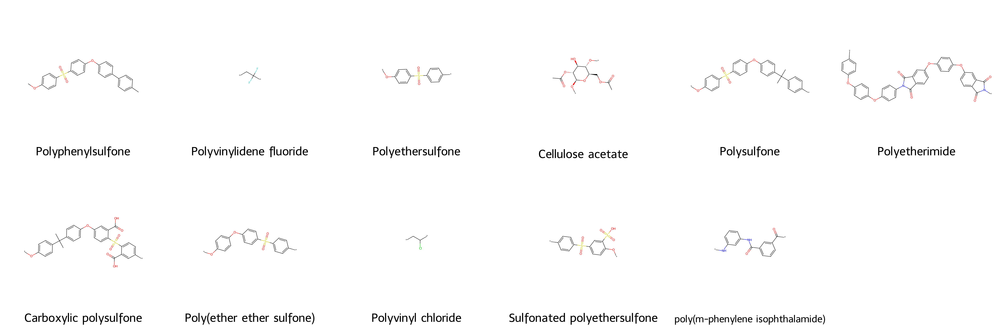

In [ ]:
display_molecules(unique_polymers,'SMILES','Polymer')

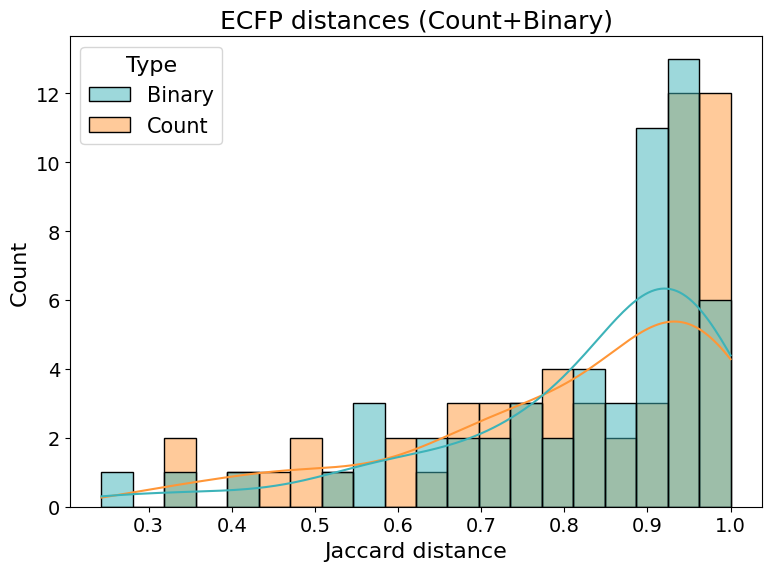

In [ ]:
binary_array = np.array(unique_polymers['polymer_ECFP6_binary_512bits'].tolist())
count_array  = np.array(unique_polymers['polymer_ECFP6_count_512bits'].tolist())

# Compute pairwise distances
binary_tanimoto_similarities = pdist(binary_array, metric="jaccard")
count_tanimoto_similarities  = pdist(count_array, metric=weighted_jaccard)

# Build dataframe
data = pd.DataFrame({
    "Similarity": np.concatenate([binary_tanimoto_similarities, count_tanimoto_similarities]),
    "Type": (["Binary"] * len(binary_tanimoto_similarities)) +
            (["Count"] * len(count_tanimoto_similarities))
})

palette = {"Binary": "#3DB3B9", "Count": "#FF9637"}

# Plot
plt.figure(figsize=(8, 6))
sns.histplot(data=data, x="Similarity", hue="Type", kde=True, bins=20, palette=palette)
plt.title("ECFP distances (Count+Binary)")
plt.xlabel("Jaccard distance")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

In [ ]:
raw_data_ultrafiltration.to_pickle(saving_folder/'cleaned_dataset_Ultrafiltration Membrane.pkl')
raw_data_ultrafiltration.to_csv(saving_folder/'cleaned_dataset_Ultrafiltration Membrane.csv')

## Uncovering ion transport mechanisms in ionic liquids using data science


---

(lacks smiles)

Specification


*   402 datapoints
*   392 molecules





https://doi.org/10.26434/chemrxiv.12609899.v1

###Clone & read data

In [ ]:
!pip install pubchempy

In [ ]:
import pickle
saving_folder=data_folder/"Uncovering ion transport mechanisms in ionic liquids using data science"
raw_data = pd.read_pickle(saving_folder/r"Database['Electrical_conductivity', 'Viscosity', 'Specific_density'] With PubChem - Updated 20230720-141035.pkl")
# with open(saving_folder/'database.pickle', "rb") as f:
#     raw_data = pickle.load(f)

###Analysis

In [ ]:
raw_data

,Temperature,Pressure,Electrical_conductivity,Delta[Electrical_conductivity],title,phases,expmeth,components-check,comp0,comp1,...,Valence_Electrons_anion_std%,MinPartialCharge_cation_std%,MinPartialCharge_anion_std%,MaxPartialCharge_cation_std%,MaxPartialCharge_anion_std%,searchTag,studyNameClip,nernstEinsteinX_byPCD_Scm2/mol,SimNernstEinstein_Scm2_mol,molarCond_Scm2mol
0,298.0,100.0,0.130,0.01,Transport properties: Electrical conductivity,['Liquid'],Alternating current cell with electrodes,"[{'name': '(((oxybis(ethane-2,1-diyl))bis(oxy)...","(((oxybis(ethane-2,1-diyl))bis(oxy))bis(ethane...",Bistriflylimide anion,...,0.0,NaN,-1.467286e-14,NaN,2.140899e-14,Existing Database,"""Synthesis and electrochemical...",NaN,NaN,NaN
1150,304.0,100.0,1.020,0.10,Transport properties: Electrical conductivity,['Liquid'],Alternating current cell with electrodes,[{'formula': 'C<SUB>13</SUB>H<SUB>20</SUB>N<SU...,1-butyl-1-methylpyrrolidinium,tricyanomethanide,...,0.0,-0.000000e+00,-0.000000e+00,0.000000e+00,0.000000e+00,Existing Database,"""Ionic liquids containing tric...",2.385322,2.239898,2.360223
31,278.0,100.0,0.390,0.04,Transport properties: Electrical conductivity,['Liquid'],Alternating current cell with electrodes,[{'formula': 'C<SUB>13</SUB>H<SUB>20</SUB>N<SU...,1-butyl-1-methylpyrrolidinium,tricyanomethanide,...,0.0,-0.000000e+00,-0.000000e+00,0.000000e+00,0.000000e+00,Existing Database,"""Ionic liquids containing tric...",0.852402,0.800434,0.888282
2045,333.0,100.0,2.050,0.21,Transport properties: Electrical conductivity,['Liquid'],Alternating current cell with electrodes,[{'formula': 'C<SUB>13</SUB>H<SUB>20</SUB>N<SU...,1-butyl-1-methylpyrrolidinium,tricyanomethanide,...,0.0,-0.000000e+00,-0.000000e+00,0.000000e+00,0.000000e+00,Existing Database,"""Ionic liquids containing tric...",5.366974,5.039770,4.830183
692,294.0,100.0,0.750,0.08,Transport properties: Electrical conductivity,['Liquid'],Alternating current cell with electrodes,[{'formula': 'C<SUB>13</SUB>H<SUB>20</SUB>N<SU...,1-butyl-1-methylpyrrolidinium,tricyanomethanide,...,0.0,-0.000000e+00,-0.000000e+00,0.000000e+00,0.000000e+00,Existing Database,"""Ionic liquids containing tric...",1.665613,1.564067,1.725149
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2763,298.0,100.0,0.350,0.05,Transport properties: Electrical conductivity,['Liquid'],Alternating current cell with electrodes,[{'formula': 'C<SUB>14</SUB>H<SUB>19</SUB>N<SU...,3-hexyl-1-methylimidazolium,tricyanomethanide,...,0.0,-1.158732e-14,-0.000000e+00,1.142069e-14,0.000000e+00,Existing Database,"""Density, viscosity, and high-...",1.385952,1.308758,0.883255
2757,283.0,100.0,0.140,0.02,Transport properties: Electrical conductivity,['Liquid'],Alternating current cell with electrodes,[{'formula': 'C<SUB>14</SUB>H<SUB>19</SUB>N<SU...,3-hexyl-1-methylimidazolium,tricyanomethanide,...,0.0,-1.158732e-14,-0.000000e+00,1.142069e-14,0.000000e+00,Existing Database,"""Density, viscosity, and high-...",0.624440,0.589660,0.349905
2777,283.0,100.0,0.074,0.01,Transport properties: Electrical conductivity,['Liquid'],Alternating current cell with electrodes,"[{'mw': '285.39', 'formula': 'C<SUB>16</SUB>H<...",1-methyl-3-octylimidazolium,tricyanomethanide,...,0.0,-2.317464e-14,-0.000000e+00,1.142069e-14,0.000000e+00,Existing Database,"""Density, viscosity, and high-...",0.396352,0.374324,0.209152
2780,293.0,100.0,0.150,0.02,Transport properties: Electrical conductivity,['Liquid'],Alternating current cell with electrodes,"[{'mw': '285.39', 'formula': 'C<SUB>16</SUB>H<...",1-methyl-3-octylimidazolium,tricyanomethanide,...,0.0,-2.317464e-14,-0.000000e+00,1.142069e-14,0.000000e+00,Existing Database,"""Density, viscosity, and high-...",0.711402,0.671864,0.426705


In [ ]:
# raw_df = pd.DataFrame(raw_data)
# raw_df = raw_df.T
# raw_df.columns.to_list()

In [ ]:
raw_df['smiles'].nunique()

642

In [ ]:
(raw_df["expt_s (cal/K.mol)"] == "Not available").sum()


np.int64(631)

In [ ]:
print('#polymers:', raw_data_membranes['Monomer A1 type'].nunique())
raw_data_membranes.head()


#polymers: 36


,Monomer A1 type,Monomer A2 type,A1/A2 ratio,"Monomer A concentration, wt%",Monomer B type,"Monomer B concentration, wt%",Organic solvent type,Additive X1 type in aqueous phase,"Additive X1 concentration, wt%",Additive X2 type in aqueous phase,...,"Na2SO4 concentration, ppm","MgCl2 concentration, ppm","CaCl2 Concentration, ppm","Permeability, LMH/bar","NaCl rejection, %","Mg2SO4 rejection, %","Na2SO4 rejection, %","MgCl2 rejection, %","CaCl2 rejection, %",Literature DOI
0,Piperazine,NaN,NaN,0.2,trimesoyl chloride (265.5),0.2,hexane,NaN,NaN,NaN,...,1000.0,1000.0,NaN,7.5,NaN,87.0,86.0,10.0,NaN,10.1016/j.desal.2013.11.035
1,Piperazine,NaN,NaN,0.5,trimesoyl chloride (265.5),0.1,Isoparaphin-G,NaN,NaN,NaN,...,500.0,NaN,NaN,7.0,NaN,NaN,98.0,NaN,NaN,10.1016/j.memsci.2009.03.011
2,Piperazine,NaN,NaN,1.5,"3,3′,5,5′-biphenyl tetraacyl chloride (330.25)",0.1,Isoparaphin-G,NaN,NaN,NaN,...,500.0,NaN,NaN,4.0,NaN,NaN,92.5,NaN,NaN,10.1016/j.memsci.2009.03.011
3,Piperazine,NaN,NaN,1.0,"3,3′,5,5′-biphenyl tetraacyl chloride (330.25)",0.1,Isoparaphin-G,NaN,NaN,NaN,...,500.0,NaN,NaN,8.6,NaN,NaN,93.0,NaN,NaN,10.1016/j.memsci.2009.03.011
4,Piperazine,NaN,NaN,0.5,"3,3′,5,5′-biphenyl tetraacyl chloride (330.25)",0.1,Isoparaphin-G,NaN,NaN,NaN,...,500.0,NaN,NaN,10.3,65.0,92.0,95.0,NaN,NaN,10.1016/j.memsci.2009.03.011


In [ ]:
raw_data_ultrafiltration.columns.to_list()

['Index',
 'Polymer',
 'Contact angle θ （°）',
 'Thickness ℓ (um)',
 'Mixture (w/o)',
 'Solvent solubility parameter （MPa1/2）',
 'xw (wt%)',
 'Temperature (°C)',
 'Permeate pressure (mbar)',
 'Total flux (kg/m2h)',
 'Separation factor (w/o)',
 'DOI']

In [ ]:
feature_space = {
        "Polymer":[
              'P_MW',
              'surface tension (mN/m)',
        ],

        "Fabrication condition": [
              'P_wt%',
              'pore maker',
              'pore maker molecular weight (Da)',
              'pore maker wt% (pore maker to total weight)',
              'additive',
              'additive wt% (additive to polymer)',
              'organic solvent',
              'solubility parameter (MPa1/2)',
              ],

        # 'Membrane property': [
        #       'Organic_Hildebrand_solubility_parameter',
        #       'Organic_molecular_volume'

        # ],

        'Operational condition': [
            'TMP (bar)',
            'organic compound',
            'oraganic compound concentration (mg/L)',
            'organic compound size (Da)',
            'foulant',
            'foulant concentration (mg/L)',

        ],

        'Membrane performance': [
            'water permeability (LMH/bar)',
            'organic compound removal (%)',
            'flux decline ratio (%)',
            'flux recovery ratio (%) ',
            'reversible fouling ratio (%)',
            'irreversible fouling ratio(%)',
        ]
              }

all_features = [
    item
    for sublist in feature_space.values()
    for item in sublist
    if item in raw_data_ultrafiltration.columns
       and raw_data_ultrafiltration[item].dtype != "object"
]

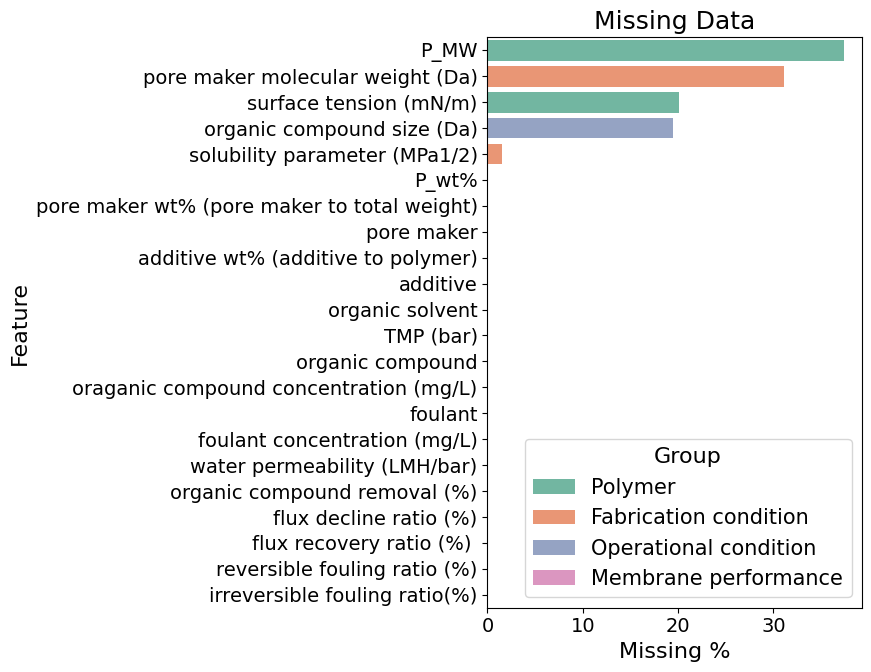

,Group,Feature,Missing Count,Missing %
0,Polymer,P_MW,119,37.421384
4,Fabrication condition,pore maker molecular weight (Da),99,31.132075
1,Polymer,surface tension (mN/m),64,20.125786
13,Operational condition,organic compound size (Da),62,19.496855
9,Fabrication condition,solubility parameter (MPa1/2),5,1.572327
2,Fabrication condition,P_wt%,0,0.000000
5,Fabrication condition,pore maker wt% (pore maker to total weight),0,0.000000
3,Fabrication condition,pore maker,0,0.000000
7,Fabrication condition,additive wt% (additive to polymer),0,0.000000
6,Fabrication condition,additive,0,0.000000


In [ ]:
plot_missingness_by_groups(raw_data_ultrafiltration, feature_space,figsize=(9,7))

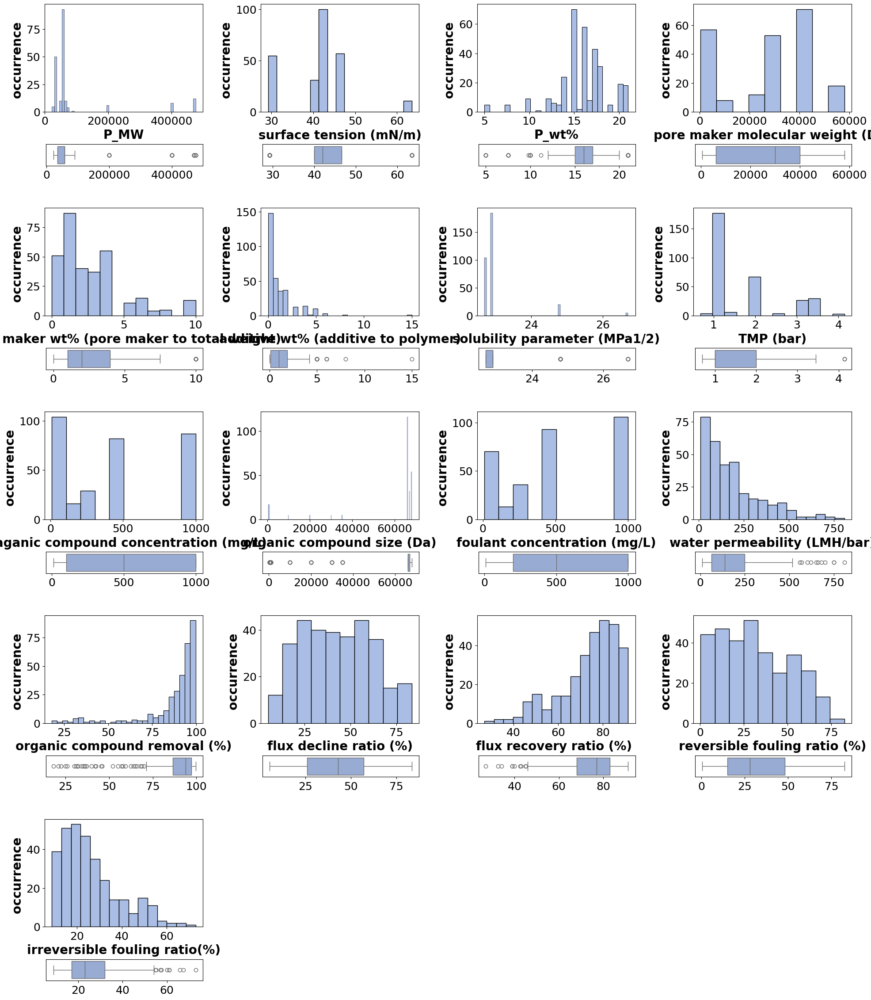

In [ ]:
distribution_plot(df=raw_data_ultrafiltration, parameters=all_features, columns_per_row=4, log_cutoff=10000000,figsize=(20,24),title = "")

In [ ]:
categorical_params =  [
  'organic solvent',
  'additive',
  'pore maker',
  'organic compound',
  'foulant',
  ]

In [ ]:
ord_encoder = OrdinalEncoder()
ord_encoder.fit_transform(raw_data_ultrafiltration[categorical_params])
raw_data_ultrafiltration[[f"enc_{col}" for col in categorical_params]] =  ord_encoder.fit_transform(raw_data_ultrafiltration[categorical_params])

*imputation*: Let's impute during the run

In [ ]:
# imputation_features = [
#  'Selective_layer_thickness',
#  'Organic_Hildebrand_solubility_parameter',
#  'Organic_molecular_volume',
#  'Effective_area',
#  'Mass_ratio(A/B)',
#  'Experimental_temperature',
#  'Downstream_pressure',
# ]

*generate count6_512 ECFP *

In [ ]:
raw_data_ultrafiltration

,Polymer,SMILES,P_MW,P_wt%,surface tension (mN/m),pore maker,pore maker molecular weight (Da),pore maker wt% (pore maker to total weight),additive,additive wt% (additive to polymer),...,flux decline ratio (%),flux recovery ratio (%),reversible fouling ratio (%),irreversible fouling ratio(%),DOI,enc_organic solvent,enc_additive,enc_pore maker,enc_organic compound,enc_foulant
0,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,0.0,...,24.00,50.00,26.00,50.00,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
1,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,0.5,...,55.00,80.00,25.00,20.00,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
2,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,1.0,...,63.50,82.00,18.50,18.00,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
3,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,1.5,...,65.50,83.50,18.00,16.50,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
4,Polyphenylsulfone,COc1ccc(S(=O)(=O)c2ccc(Oc3ccc(-c4ccc(C)cc4)cc3...,NaN,15.0,NaN,PEG,1000.0,6.0,GO-1,2.0,...,37.00,62.00,25.00,38.00,10.1016/j.cjche.2017.02.009,1.0,11.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
313,Cellulose acetate,CC(=O)OC[C@H]1O[C@@H](O*)[C@H](OC(C)=O)[C@@H](...,30000.0,16.0,63.55,PEG,400.0,2.0,CNC-2,15.0,...,62.00,83.00,21.00,17.00,10.1016/j.carbpol.2017.06.064,4.0,2.0,0.0,0.0,0.0
314,Cellulose acetate,CC(=O)OC[C@H]1O[C@@H](O*)[C@H](OC(C)=O)[C@@H](...,NaN,15.0,63.55,PVP,25000.0,2.0,none,0.0,...,25.18,60.18,35.00,39.82,10.1002/app.43946,4.0,69.0,1.0,0.0,0.0
315,Cellulose acetate,CC(=O)OC[C@H]1O[C@@H](O*)[C@H](OC(C)=O)[C@@H](...,NaN,15.0,63.55,PVP,25000.0,2.0,CNC-3,0.5,...,30.00,68.00,38.00,32.00,10.1002/app.43946,4.0,3.0,1.0,0.0,0.0
316,Cellulose acetate,CC(=O)OC[C@H]1O[C@@H](O*)[C@H](OC(C)=O)[C@@H](...,NaN,15.0,63.55,PVP,25000.0,2.0,CNC-3,1.2,...,30.24,72.24,42.00,27.76,10.1002/app.43946,4.0,3.0,1.0,0.0,0.0


In [ ]:
raw_data_ultrafiltration = ECFP_Processor(raw_data_ultrafiltration, column='SMILES',new_unit_name='polymer').main_ecfp([3], [512], count_vector= True)
raw_data_ultrafiltration = ECFP_Processor(raw_data_ultrafiltration, column='SMILES',new_unit_name='polymer').main_ecfp([3], [512], count_vector= False)


Done with generating polymer_ECFP6_count_512bits
Done with generating polymer_ECFP6_binary_512bits


In [ ]:
unique_polymers = raw_data_ultrafiltration.drop_duplicates(subset=['SMILES']).reset_index(drop=True)
unique_polymers.shape

(11, 32)

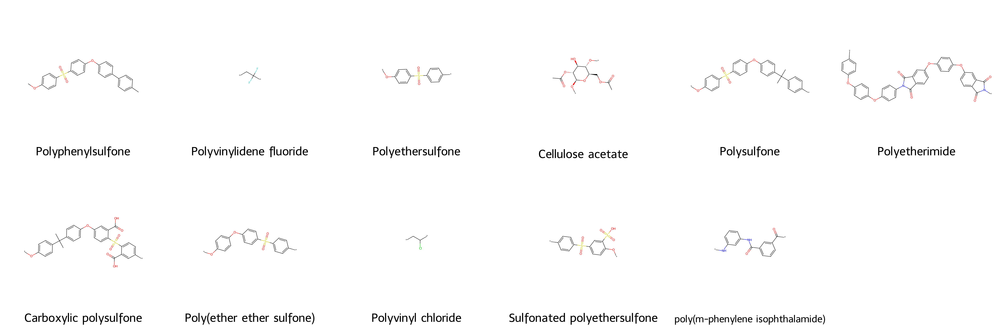

In [ ]:
display_molecules(unique_polymers,'SMILES','Polymer')

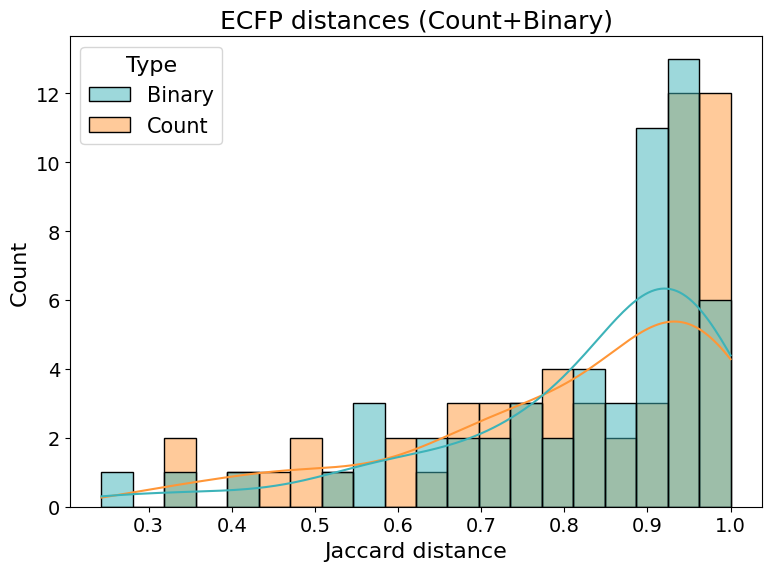

In [ ]:
binary_array = np.array(unique_polymers['polymer_ECFP6_binary_512bits'].tolist())
count_array  = np.array(unique_polymers['polymer_ECFP6_count_512bits'].tolist())

# Compute pairwise distances
binary_tanimoto_similarities = pdist(binary_array, metric="jaccard")
count_tanimoto_similarities  = pdist(count_array, metric=weighted_jaccard)

# Build dataframe
data = pd.DataFrame({
    "Similarity": np.concatenate([binary_tanimoto_similarities, count_tanimoto_similarities]),
    "Type": (["Binary"] * len(binary_tanimoto_similarities)) +
            (["Count"] * len(count_tanimoto_similarities))
})

palette = {"Binary": "#3DB3B9", "Count": "#FF9637"}

# Plot
plt.figure(figsize=(8, 6))
sns.histplot(data=data, x="Similarity", hue="Type", kde=True, bins=20, palette=palette)
plt.title("ECFP distances (Count+Binary)")
plt.xlabel("Jaccard distance")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

In [ ]:
raw_data_ultrafiltration.to_pickle(saving_folder/'cleaned_dataset_Ultrafiltration Membrane.pkl')
raw_data_ultrafiltration.to_csv(saving_folder/'cleaned_dataset_Ultrafiltration Membrane.csv')

## Pre-trained knowledge elevates large language models beyond traditional chemical reaction optimizers

Specification

* ~700 datapoints

(https://github.com/gomesgroup/iron-mind-public)

https://arxiv.org/pdf/2509.00103

In [ ]:
import pickle
import json
dataset_folder=data_folder/r"Pre-trained knowledge elevates large language models beyond traditional chemical reaction optimizers"
optimization_folder = dataset_folder/"runs"/"bayesian"

In [ ]:
if not optimization_folder.exists():
    print(f"The optimization_folder does not exist. Please check the path.")

read the json files and extract the contents

In [ ]:
def iterate_runs(optimization_folder):
    optimization_folder = Path(optimization_folder)

    for reaction_dir in sorted(p for p in optimization_folder.iterdir() if p.is_dir()):
        benchmark_dir = reaction_dir / "benchmark"
        if not benchmark_dir.is_dir():
            continue

        for method_dir in sorted(p for p in benchmark_dir.iterdir() if p.is_dir()):

            for run_dir in sorted(p for p in method_dir.iterdir() if p.is_dir()):
                json_path = run_dir / "seen_observations.json"
                if not json_path.is_file():
                    continue

                yield {
                    "reaction": reaction_dir.name,
                    "method":   method_dir.name,
                    "run":      run_dir.name,
                    "json_path": json_path,
                }

def read_json_content(json_path):
    with open(json_path, "r") as f:
        return json.load(f)


def build_dataframe(optimization_folder):
    rows = []
    for info in iterate_runs(optimization_folder):
        observations = read_json_content(info["json_path"])
        for step, obs in enumerate(observations):
            rows.append({
                "reaction": info["reaction"],
                "method":   info["method"],
                "run":      info["run"],
                "step":     step,
                **obs,
            })
    return pd.DataFrame(rows)

In [ ]:
extracted_data = build_dataframe(optimization_folder)

In [ ]:
extracted_data.to_pickle(dataset_folder/"extracted"/"extracted_raw_data.pkl")
extracted_data.to_csv(dataset_folder/"extracted"/"extracted_raw_data.csv")

###Analysis

In [ ]:
cols = ["AcOH_equiv", "TTIP_equiv", "reaction_concentration_mM"]
extracted_data[cols] = extracted_data[cols].apply(pd.to_numeric, errors="coerce")
reductive_Amination_data = extracted_data[extracted_data["reaction"] == "Reductive_Amination"]
reductive_Amination_data = reductive_Amination_data.reset_index(drop=True)

In [ ]:
reductive_Amination_data

,reaction,method,run,step,electrophile,core,base,yield,ligand,aryl_halide,...,substrate,AcOH_equiv,TTIP_equiv,reaction_concentration_mM,percent_conversion,halide,boronate,conditions,conversion,nucleophile
0,Reductive_Amination,atlas-ei-1-20-20,run_1,0,NaN,NaN,NaN,NaN,NaN,NaN,...,(E)-3-phenylprop-2-enal,1.0,5.0,50.0,34.0,NaN,NaN,NaN,NaN,NaN
1,Reductive_Amination,atlas-ei-1-20-20,run_1,1,NaN,NaN,NaN,NaN,NaN,NaN,...,(E)-3-phenylprop-2-enal,1.0,1.0,50.0,35.0,NaN,NaN,NaN,NaN,NaN
2,Reductive_Amination,atlas-ei-1-20-20,run_1,2,NaN,NaN,NaN,NaN,NaN,NaN,...,"1-[3,5-bis(trifluoromethyl)phenyl]ethanone",1.0,1.0,50.0,0.0,NaN,NaN,NaN,NaN,NaN
3,Reductive_Amination,atlas-ei-1-20-20,run_1,3,NaN,NaN,NaN,NaN,NaN,NaN,...,(E)-3-phenylprop-2-enal,3.0,1.0,50.0,43.0,NaN,NaN,NaN,NaN,NaN
4,Reductive_Amination,atlas-ei-1-20-20,run_1,4,NaN,NaN,NaN,NaN,NaN,NaN,...,3-pyrazol-1-ylcyclopentan-1-one,1.0,1.0,50.0,0.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2515,Reductive_Amination,atlas-ucb-1-20-20-des0,run_9,16,NaN,NaN,NaN,NaN,NaN,NaN,...,"1,3-benzothiazole-2-carbaldehyde",3.0,2.0,100.0,88.0,NaN,NaN,NaN,NaN,NaN
2516,Reductive_Amination,atlas-ucb-1-20-20-des0,run_9,17,NaN,NaN,NaN,NaN,NaN,NaN,...,"1,3-benzothiazole-2-carbaldehyde",1.0,2.0,100.0,41.0,NaN,NaN,NaN,NaN,NaN
2517,Reductive_Amination,atlas-ucb-1-20-20-des0,run_9,18,NaN,NaN,NaN,NaN,NaN,NaN,...,"1,3-benzothiazole-2-carbaldehyde",3.0,1.0,100.0,60.0,NaN,NaN,NaN,NaN,NaN
2518,Reductive_Amination,atlas-ucb-1-20-20-des0,run_9,19,NaN,NaN,NaN,NaN,NaN,NaN,...,"1,3-benzothiazole-2-carbaldehyde",5.0,3.0,50.0,81.0,NaN,NaN,NaN,NaN,NaN


In [ ]:
reductive_Amination_data.columns.to_list()

['reaction',
 'method',
 'run',
 'step',
 'electrophile',
 'core',
 'base',
 'yield',
 'ligand',
 'aryl_halide',
 'additive',
 'boronic_acid_reactant',
 'sulfonamide_reactant',
 'catalyst_catalyst',
 'base_reagent',
 'solvent',
 'desired_yield',
 'undesired_yield',
 'substrate',
 'AcOH_equiv',
 'TTIP_equiv',
 'reaction_concentration_mM',
 'percent_conversion',
 'halide',
 'boronate',
 'conditions',
 'conversion',
 'nucleophile']

In [ ]:
# features = [col for col in reductive_Amination_data.columns.to_list() if col not in ['reaction','method','run','step',]]

features = [
 'reaction',
 'method',
 'run',
 'step',
 'solvent',
 'substrate',
 'AcOH_equiv',
 'TTIP_equiv',
 'reaction_concentration_mM',
 'percent_conversion',
]

In [ ]:
# print('#polymers:', raw_data_membranes['Monomer A1 type'].nunique())
# raw_data_membranes.head()


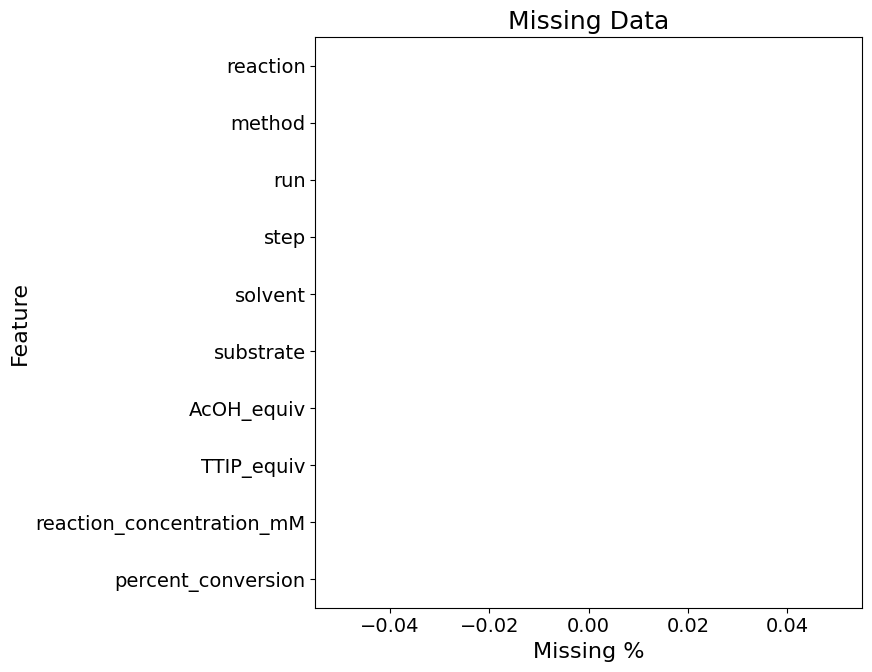

,Group,Feature,Missing Count,Missing %
0,Features,reaction,0,0.0
1,Features,method,0,0.0
2,Features,run,0,0.0
3,Features,step,0,0.0
4,Features,solvent,0,0.0
5,Features,substrate,0,0.0
6,Features,AcOH_equiv,0,0.0
7,Features,TTIP_equiv,0,0.0
8,Features,reaction_concentration_mM,0,0.0
9,Features,percent_conversion,0,0.0


In [ ]:
plot_missingness_by_groups(reductive_Amination_data, features,figsize=(9,7))

In [ ]:
numerical_features = ["AcOH_equiv","TTIP_equiv", "reaction_concentration_mM", "percent_conversion"]

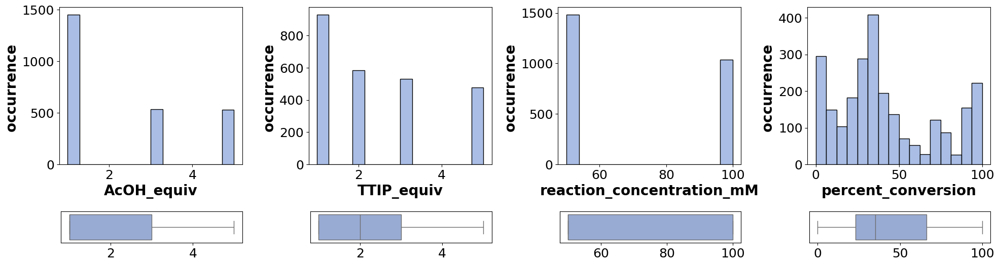

In [ ]:
distribution_plot(df=reductive_Amination_data, parameters=numerical_features, columns_per_row=4, log_cutoff=10000000,figsize=(20,7),title = "")

*generate count6_512 ECFP *

In [ ]:
reductive_Amination_data = reductive_Amination_data[features]
reductive_Amination_data

,reaction,method,run,step,solvent,substrate,AcOH_equiv,TTIP_equiv,reaction_concentration_mM,percent_conversion
0,Reductive_Amination,atlas-ei-1-20-20,run_1,0,DMA,(E)-3-phenylprop-2-enal,1.0,5.0,50.0,34.0
1,Reductive_Amination,atlas-ei-1-20-20,run_1,1,NMP,(E)-3-phenylprop-2-enal,1.0,1.0,50.0,35.0
2,Reductive_Amination,atlas-ei-1-20-20,run_1,2,NMP,"1-[3,5-bis(trifluoromethyl)phenyl]ethanone",1.0,1.0,50.0,0.0
3,Reductive_Amination,atlas-ei-1-20-20,run_1,3,NMP,(E)-3-phenylprop-2-enal,3.0,1.0,50.0,43.0
4,Reductive_Amination,atlas-ei-1-20-20,run_1,4,NMP,3-pyrazol-1-ylcyclopentan-1-one,1.0,1.0,50.0,0.0
...,...,...,...,...,...,...,...,...,...,...
2515,Reductive_Amination,atlas-ucb-1-20-20-des0,run_9,16,DMA,"1,3-benzothiazole-2-carbaldehyde",3.0,2.0,100.0,88.0
2516,Reductive_Amination,atlas-ucb-1-20-20-des0,run_9,17,DMA,"1,3-benzothiazole-2-carbaldehyde",1.0,2.0,100.0,41.0
2517,Reductive_Amination,atlas-ucb-1-20-20-des0,run_9,18,DMA,"1,3-benzothiazole-2-carbaldehyde",3.0,1.0,100.0,60.0
2518,Reductive_Amination,atlas-ucb-1-20-20-des0,run_9,19,DMA,"1,3-benzothiazole-2-carbaldehyde",5.0,3.0,50.0,81.0


In [ ]:
atlas_ei_1_20_20= reductive_Amination_data[reductive_Amination_data["method"] == "atlas-ei-1-20-20"]

In [ ]:
feature_cols = ["substrate", "AcOH_equiv", "TTIP_equiv", "solvent", "reaction_concentration_mM"]
unique_count = atlas_ei_1_20_20[feature_cols].drop_duplicates().shape[0]
print(f"Unique combinations: {unique_count} / 420 ({unique_count/420:.1%} coverage)")

Unique combinations: 102 / 420 (24.3% coverage)


In [ ]:
print('# unique methods:', reductive_Amination_data['method'].unique())

print('# unique substrate smiles:', reductive_Amination_data['substrate'].nunique())
print('# unique solvents:', reductive_Amination_data['solvent'].nunique())

# unique methods: ['atlas-ei-1-20-20' 'atlas-ei-1-20-20-des0' 'atlas-pi-1-20-20'
 'atlas-pi-1-20-20-des0' 'atlas-ucb-1-20-20' 'atlas-ucb-1-20-20-des0']
# unique substrate smiles: 16
# unique solvents: 2


## Miniaturization of Popular Reactions from the Medicinal Chemists Toolbox for Ultrahigh-Throughput Experimentation

Specification

* ~768 datapoints

https://doi.org/10.1038/s44160-023-00351-1

https://github.com/cernaklab/medchem-reaction-miniaturization/blob/main/suzuki-ez.xlsx

In [ ]:
dataset_folder=data_folder/r"Miniaturization of Popular Reactions from the Medicinal Chemists Toolbox for Ultrahigh-Throughput Experimentation"
raw_data = pd.read_excel(dataset_folder/"suzuki-ez.xlsx", sheet_name="reductive_amination_screen_opt")

###Analysis

In [ ]:
raw_data.columns.to_list()

['Plate Location',
 'Row',
 'Column',
 'Sample Name',
 'Core SMILES',
 'Building Block',
 'Building Block SMILES',
 'Product ID',
 'Pdt Mass',
 'Pdt Formula',
 'Pdt SMILES',
 'Equiv. AcOH',
 'Equiv. TTIP',
 'Solvent',
 'Reaction Conc [M]',
 'UV254_Core Rt(min)',
 'UV254_Core AreaAbs',
 'UV254_PhPh Rt(min)',
 'UV254_PhPh AreaAbs',
 'UV254_ReductiveAmination Rt(min)',
 'UV254_ReductiveAmination AreaAbs',
 'UV254_CarbonylReduction Rt(min)',
 'UV254_CarbonylReduction AreaAbs',
 'Pdt-to-IS Ratio',
 'Approx. % Conv.']

In [ ]:
raw_data

,Plate Location,Row,Column,Sample Name,Core SMILES,Building Block,Building Block SMILES,Product ID,Pdt Mass,Pdt Formula,...,UV254_Core Rt(min),UV254_Core AreaAbs,UV254_PhPh Rt(min),UV254_PhPh AreaAbs,UV254_ReductiveAmination Rt(min),UV254_ReductiveAmination AreaAbs,UV254_CarbonylReduction Rt(min),UV254_CarbonylReduction AreaAbs,Pdt-to-IS Ratio,Approx. % Conv.
0,2,A,1,0378493_0147_DMA_001,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)n3c4ccccc4...,MFCD09261041,Brc1cc(C=O)ccc1C#N,Staur01,659.15320,C36H30BrN5O3,...,0.630,6452.84764,1.196,15199.58174,1.239,51465.46389,0.0,0.0,3.385979,89
1,2,A,2,0378493_0147_DMA_002,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)n3c4ccccc4...,MFCD09261041,Brc1cc(C=O)ccc1C#N,Staur01,659.15320,C36H30BrN5O3,...,0.631,16479.51622,1.196,14223.43818,1.239,14033.69505,0.0,0.0,0.986660,46
2,2,A,3,0378493_0147_DMA_003,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)n3c4ccccc4...,MFCD09261041,Brc1cc(C=O)ccc1C#N,Staur01,659.15320,C36H30BrN5O3,...,0.629,128165.42125,1.196,11031.95486,1.239,9255.72638,0.0,0.0,0.838992,7
3,2,A,4,0378493_0147_DMA_004,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)n3c4ccccc4...,MFCD09261041,Brc1cc(C=O)ccc1C#N,Staur01,659.15320,C36H30BrN5O3,...,0.629,85188.46598,1.196,12232.56037,1.238,10144.10890,0.0,0.0,0.829271,11
4,2,A,5,0378493_0147_DMA_005,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)n3c4ccccc4...,MFCD09261041,Brc1cc(C=O)ccc1C#N,Staur01,659.15320,C36H30BrN5O3,...,0.661,2438.45992,1.196,9503.90811,1.239,19986.07277,0.0,0.0,2.102932,89
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
763,3,P,20,0378493_0147_NMP_764,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)n3c4ccccc4...,L005373664000F,O=C1CCC(CC#N)C1,Staur16,573.27399,C35H35N5O3,...,0.630,183684.93500,1.194,12510.28476,0.710,2683.49025,0.0,0.0,0.214503,1
764,3,P,21,0378493_0147_NMP_765,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)n3c4ccccc4...,L005373664000F,O=C1CCC(CC#N)C1,Staur16,573.27399,C35H35N5O3,...,0.631,135732.54260,1.193,11795.82216,0.709,10829.47566,0.0,0.0,0.918077,7
765,3,P,22,0378493_0147_NMP_766,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)n3c4ccccc4...,L005373664000F,O=C1CCC(CC#N)C1,Staur16,573.27399,C35H35N5O3,...,0.630,134457.94810,1.194,13019.34380,0.708,14947.87064,0.0,0.0,1.148128,10
766,3,P,23,0378493_0147_NMP_767,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)n3c4ccccc4...,L005373664000F,O=C1CCC(CC#N)C1,Staur16,573.27399,C35H35N5O3,...,0.631,156494.23010,1.193,13658.78029,0.710,21942.06849,0.0,0.0,1.606444,12


In [ ]:
feature_cols = ["Building Block SMILES", "Equiv. AcOH", "Equiv. TTIP", "Solvent", "Reaction Conc [M]"]
unique_count = raw_data[feature_cols].drop_duplicates().shape[0]
print(f"Unique combinations: {unique_count} / {len(raw_data)} ({unique_count/len(raw_data):.1%} coverage)")

Unique combinations: 768 / 768 (100.0% coverage)


In [ ]:
print("number of substrates", raw_data["Building Block SMILES"].nunique())
print("number of products:", raw_data["Pdt SMILES"].nunique())
print("number of products:", raw_data["Solvent"].nunique())

number of substrates 16
number of products: 16
number of products: 2


In [ ]:
print("unique Solvent:",raw_data["Solvent"].unique())


unique Solvent: ['DMA' 'NMP']


In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
raw_data['Solvent_Encoded'] = le.fit_transform(raw_data['Solvent'])

In [ ]:
# cols = ["AcOH_equiv", "TTIP_equiv", "reaction_concentration_mM"]
# extracted_data[cols] = extracted_data[cols].apply(pd.to_numeric, errors="coerce")
# reductive_Amination_data = extracted_data[extracted_data["reaction"] == "Reductive_Amination"]
# reductive_Amination_data = reductive_Amination_data.reset_index(drop=True)

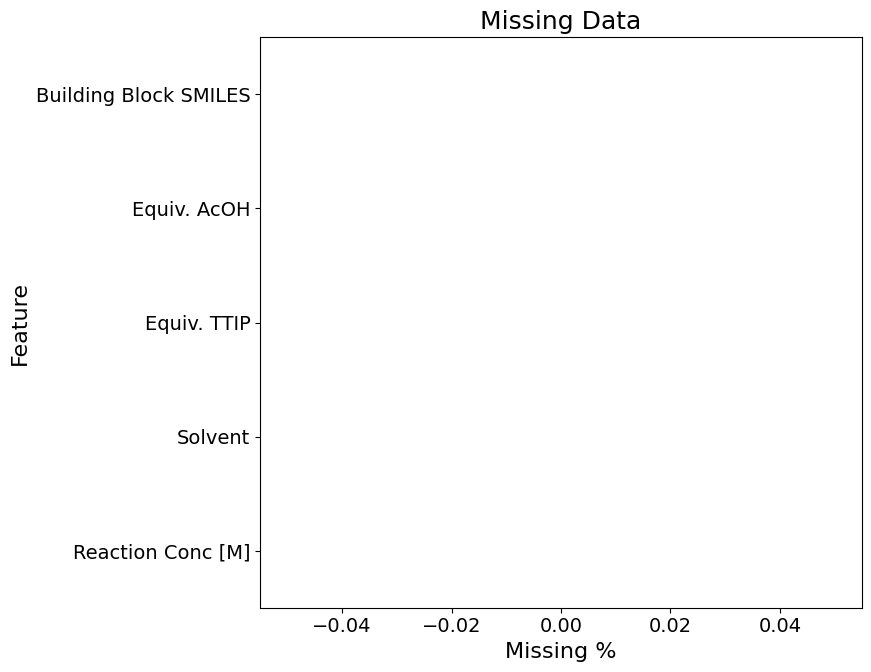

,Group,Feature,Missing Count,Missing %
0,Features,Building Block SMILES,0,0.0
1,Features,Equiv. AcOH,0,0.0
2,Features,Equiv. TTIP,0,0.0
3,Features,Solvent,0,0.0
4,Features,Reaction Conc [M],0,0.0


In [ ]:
plot_missingness_by_groups(raw_data, feature_cols,figsize=(9,7))

In [ ]:
processed_data = raw_data.copy()
processed_data["Equiv AcOH"] = (
    processed_data["Equiv. AcOH"]
    .str.extract(r"(\d+\.?\d*)")
    .astype(float)
)

processed_data["Equiv TTIP"] = (
    processed_data["Equiv. TTIP"]
    .str.extract(r"(\d+\.?\d*)")
    .astype(float)
)

processed_data["Reaction Conc (mM)"] = (
    processed_data["Reaction Conc [M]"]
    .str.extract(r"(\d+\.?\d*)")
    .astype(float)
)
# processed_data.info()
processed_data = processed_data.rename(
    columns={"Building Block SMILES": "Substrate SMILES"}
)

processed_data = processed_data.rename(
    columns={"Approx. % Conv.": "Approx Conv (%)"}
)
numerical_features = ["Equiv AcOH", "Equiv TTIP", "Reaction Conc (mM)", "Approx Conv (%)"]


In [ ]:
solvent_hsps = {
    "DMF":{"δD":16.8,	"δP":13.9,	"δH":11.4},
    "NMP": {"δD":17.9,	"δP":9.9,	"δH":7.4}
    }

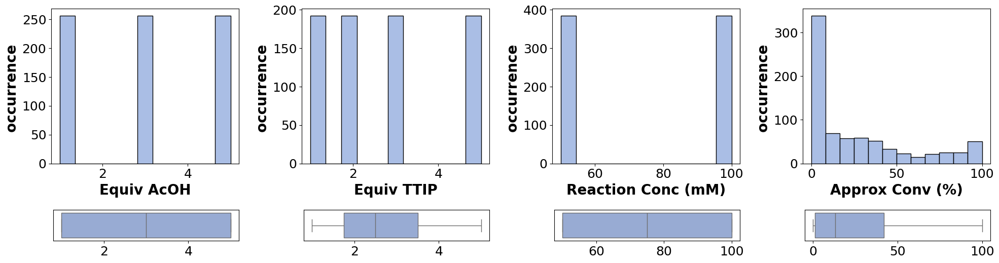

In [ ]:
distribution_plot(df=processed_data, parameters=numerical_features, columns_per_row=4, log_cutoff=10000000,figsize=(20,7),title = "")

In [ ]:
processed_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 29 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Plate Location                    768 non-null    int64  
 1   Row                               768 non-null    object 
 2   Column                            768 non-null    int64  
 3   Sample Name                       768 non-null    object 
 4   Core SMILES                       768 non-null    object 
 5   Building Block                    768 non-null    object 
 6   Substrate SMILES                  768 non-null    object 
 7   Product ID                        768 non-null    object 
 8   Pdt Mass                          768 non-null    float64
 9   Pdt Formula                       768 non-null    object 
 10  Pdt SMILES                        768 non-null    object 
 11  Equiv. AcOH                       768 non-null    object 
 12  Equiv. T

###*generate count6_512 ECFP *

In [ ]:
# processed_data = processed_data[["Building Block SMILES", "Equiv. AcOH", "Equiv. TTIP", "Solvent", "Reaction Conc [mM]", "Approx. % Conv."]]

processed_data = canonicalize_columns(processed_data,"Substrate SMILES")

In [ ]:
processed_data = ECFP_Processor(processed_data, column="Substrate SMILES",new_unit_name='Substrate').main_ecfp([3], [512], count_vector= True)
processed_data = ECFP_Processor(processed_data, column="Substrate SMILES",new_unit_name='Substrate').main_ecfp([3], [512], count_vector= False)


Done with generating Substrate_ECFP6_count_512bits
Done with generating Substrate_ECFP6_binary_512bits


In [ ]:
unique_polymers = processed_data.drop_duplicates(subset=['Substrate SMILES']).reset_index(drop=True)
unique_polymers.shape

(16, 31)

In [ ]:
unique_pdt = processed_data.drop_duplicates(subset=['Pdt SMILES']).reset_index(drop=True)
unique_pdt.shape

(16, 31)

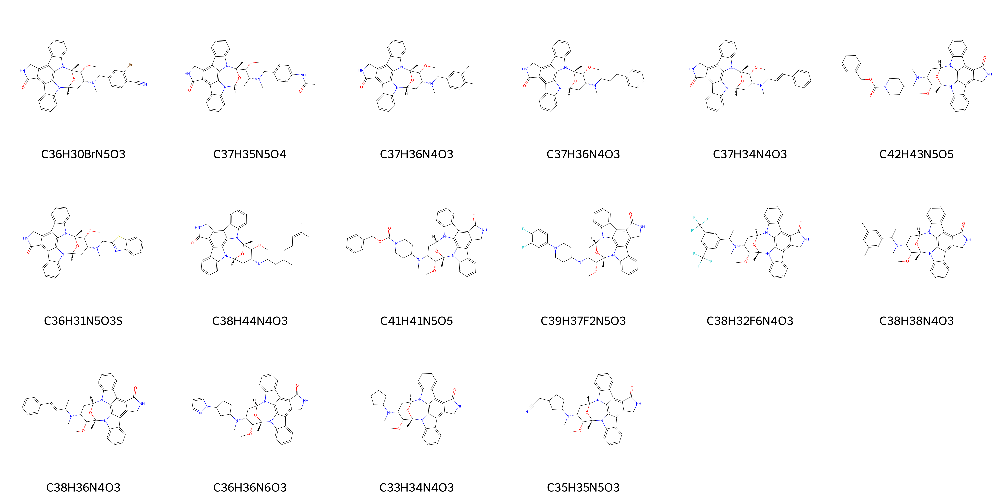

In [ ]:
display_molecules(unique_pdt,'Pdt SMILES', "Pdt Formula")

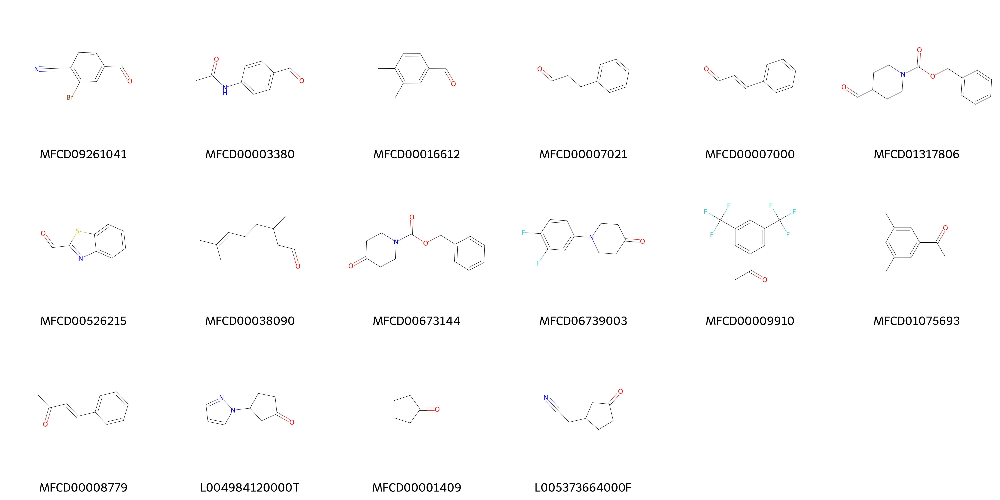

In [ ]:
display_molecules(unique_polymers,'Substrate SMILES', "Building Block")

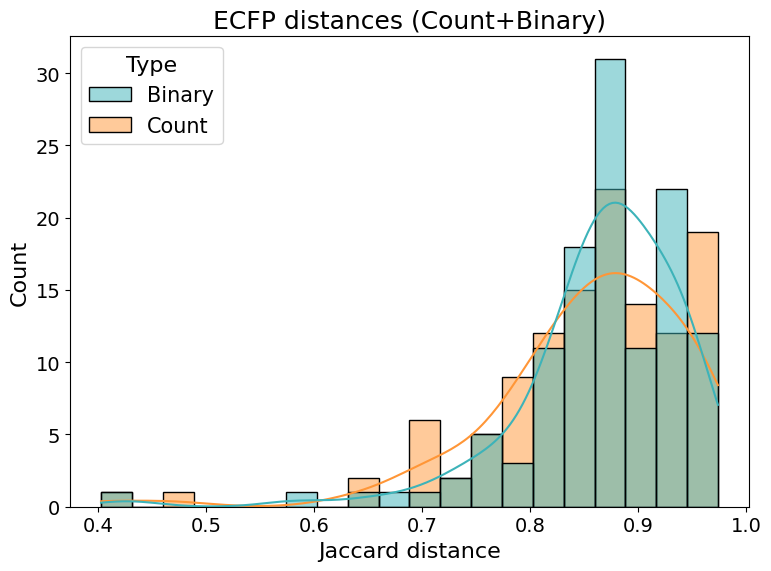

In [ ]:
binary_array = np.array(unique_polymers['Substrate_ECFP6_binary_512bits'].tolist())
count_array  = np.array(unique_polymers['Substrate_ECFP6_count_512bits'].tolist())

# Compute pairwise distances
binary_tanimoto_similarities = pdist(binary_array, metric="jaccard")
count_tanimoto_similarities  = pdist(count_array, metric=weighted_jaccard)

# Build dataframe
data = pd.DataFrame({
    "Similarity": np.concatenate([binary_tanimoto_similarities, count_tanimoto_similarities]),
    "Type": (["Binary"] * len(binary_tanimoto_similarities)) +
            (["Count"] * len(count_tanimoto_similarities))
})

palette = {"Binary": "#3DB3B9", "Count": "#FF9637"}

# Plot
plt.figure(figsize=(8, 6))
sns.histplot(data=data, x="Similarity", hue="Type", kde=True, bins=20, palette=palette)
plt.title("ECFP distances (Count+Binary)")
plt.xlabel("Jaccard distance")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

In [ ]:
processed_data

,Plate Location,Row,Column,Sample Name,Core SMILES,Building Block,Substrate SMILES,Product ID,Pdt Mass,Pdt Formula,...,UV254_CarbonylReduction Rt(min),UV254_CarbonylReduction AreaAbs,Pdt-to-IS Ratio,Approx Conv (%),Solvent_Encoded,Equiv AcOH,Equiv TTIP,Reaction Conc (mM),Substrate_ECFP6_count_512bits,Substrate_ECFP6_binary_512bits
0,2,A,1,0378493_0147_DMA_001,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)n3c4ccccc4...,MFCD09261041,N#Cc1ccc(C=O)cc1Br,Staur01,659.15320,C36H30BrN5O3,...,0.0,0.0,3.385979,89,0,1.0,1.0,100.0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
1,2,A,2,0378493_0147_DMA_002,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)n3c4ccccc4...,MFCD09261041,N#Cc1ccc(C=O)cc1Br,Staur01,659.15320,C36H30BrN5O3,...,0.0,0.0,0.986660,46,0,1.0,2.0,100.0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
2,2,A,3,0378493_0147_DMA_003,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)n3c4ccccc4...,MFCD09261041,N#Cc1ccc(C=O)cc1Br,Staur01,659.15320,C36H30BrN5O3,...,0.0,0.0,0.838992,7,0,1.0,3.0,100.0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
3,2,A,4,0378493_0147_DMA_004,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)n3c4ccccc4...,MFCD09261041,N#Cc1ccc(C=O)cc1Br,Staur01,659.15320,C36H30BrN5O3,...,0.0,0.0,0.829271,11,0,1.0,5.0,100.0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
4,2,A,5,0378493_0147_DMA_005,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)n3c4ccccc4...,MFCD09261041,N#Cc1ccc(C=O)cc1Br,Staur01,659.15320,C36H30BrN5O3,...,0.0,0.0,2.102932,89,0,3.0,1.0,100.0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
763,3,P,20,0378493_0147_NMP_764,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)n3c4ccccc4...,L005373664000F,N#CCC1CCC(=O)C1,Staur16,573.27399,C35H35N5O3,...,0.0,0.0,0.214503,1,1,3.0,5.0,50.0,"[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, ...","[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, ..."
764,3,P,21,0378493_0147_NMP_765,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)n3c4ccccc4...,L005373664000F,N#CCC1CCC(=O)C1,Staur16,573.27399,C35H35N5O3,...,0.0,0.0,0.918077,7,1,5.0,1.0,50.0,"[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, ...","[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, ..."
765,3,P,22,0378493_0147_NMP_766,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)n3c4ccccc4...,L005373664000F,N#CCC1CCC(=O)C1,Staur16,573.27399,C35H35N5O3,...,0.0,0.0,1.148128,10,1,5.0,2.0,50.0,"[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, ...","[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, ..."
766,3,P,23,0378493_0147_NMP_767,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)n3c4ccccc4...,L005373664000F,N#CCC1CCC(=O)C1,Staur16,573.27399,C35H35N5O3,...,0.0,0.0,1.606444,12,1,5.0,3.0,50.0,"[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, ...","[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, ..."


In [ ]:
processed_data.to_pickle(dataset_folder/'cleaned_suzuki_synthesis.pkl')
processed_data.to_csv(dataset_folder/'cleaned_suzuki_synthesis.csv')

## TuNa-AI_A Hybrid Kernel Machine to Design Tunable Nanoparticles for Drug Delivery

Specification

* ~768 datapoints

https://doi.org/10.1021/acsnano.5c09066

https://github.com/RekerLab/TuNa-AI

In [ ]:
dataset_folder=data_folder/r"TuNa-AI_A Hybrid Kernel Machine to Design Tunable Nanoparticles for Drug Delivery"
raw_data = pd.read_excel(dataset_folder/"suzuki-ez.xlsx", sheet_name="reductive_amination_screen_opt")

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/_collab_GP/Dataset/Validation datasets/TuNa-AI_A Hybrid Kernel Machine to Design Tunable Nanoparticles for Drug Delivery/suzuki-ez.xlsx'

###Analysis

In [ ]:
raw_data.columns.to_list()

NameError: name 'raw_data' is not defined

In [ ]:
raw_data

NameError: name 'raw_data' is not defined

In [ ]:
feature_cols = ["Building Block SMILES", "Equiv. AcOH", "Equiv. TTIP", "Solvent", "Reaction Conc [M]"]
unique_count = raw_data[feature_cols].drop_duplicates().shape[0]
print(f"Unique combinations: {unique_count} / {len(raw_data)} ({unique_count/len(raw_data):.1%} coverage)")

NameError: name 'raw_data' is not defined

In [ ]:
raw_data["Building Block SMILES"].nunique()

NameError: name 'raw_data' is not defined

In [ ]:
# cols = ["AcOH_equiv", "TTIP_equiv", "reaction_concentration_mM"]
# extracted_data[cols] = extracted_data[cols].apply(pd.to_numeric, errors="coerce")
# reductive_Amination_data = extracted_data[extracted_data["reaction"] == "Reductive_Amination"]
# reductive_Amination_data = reductive_Amination_data.reset_index(drop=True)

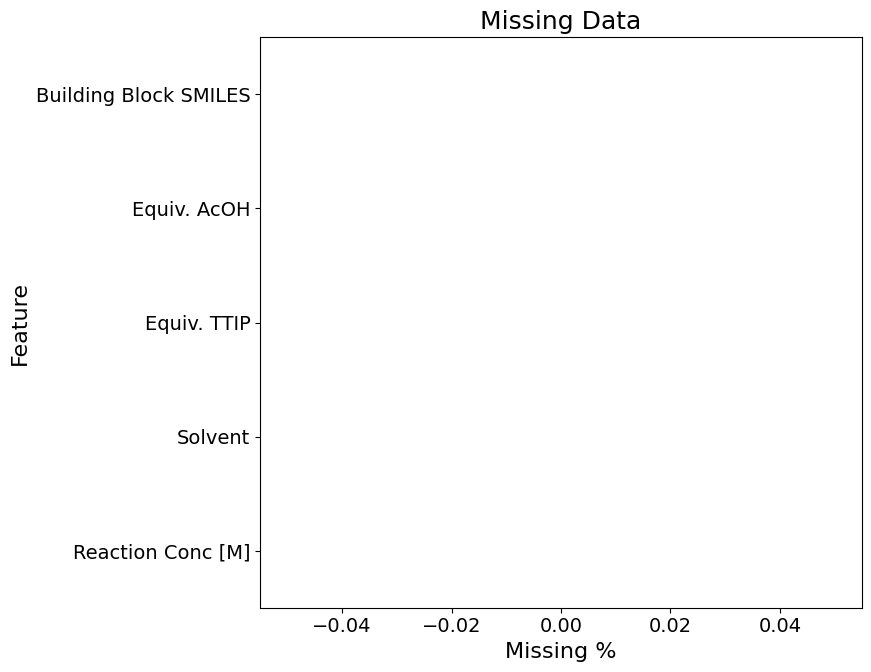

,Group,Feature,Missing Count,Missing %
0,Features,Building Block SMILES,0,0.0
1,Features,Equiv. AcOH,0,0.0
2,Features,Equiv. TTIP,0,0.0
3,Features,Solvent,0,0.0
4,Features,Reaction Conc [M],0,0.0


In [ ]:
plot_missingness_by_groups(raw_data, feature_cols,figsize=(9,7))

In [ ]:
processed_data = raw_data.copy()
processed_data["Equiv. AcOH"] = (
    processed_data["Equiv. AcOH"]
    .str.extract(r"(\d+\.?\d*)")
    .astype(float)
)

processed_data["Equiv. TTIP"] = (
    processed_data["Equiv. TTIP"]
    .str.extract(r"(\d+\.?\d*)")
    .astype(float)
)

processed_data["Reaction Conc [mM]"] = (
    processed_data["Reaction Conc [M]"]
    .str.extract(r"(\d+\.?\d*)")
    .astype(float)
)
# processed_data.info()

numerical_features = ["Equiv. AcOH", "Equiv. TTIP", "Reaction Conc [mM]", "Approx. % Conv."]


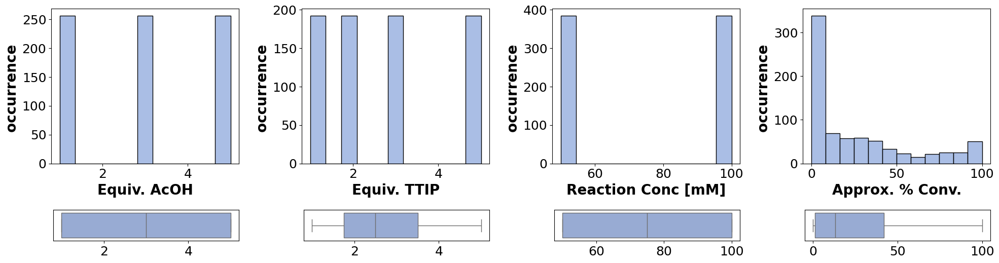

In [ ]:
distribution_plot(df=processed_data, parameters=numerical_features, columns_per_row=4, log_cutoff=10000000,figsize=(20,7),title = "")

###*generate count6_512 ECFP *

In [ ]:
# processed_data = processed_data[["Building Block SMILES", "Equiv. AcOH", "Equiv. TTIP", "Solvent", "Reaction Conc [mM]", "Approx. % Conv."]]
processed_data = processed_data.rename(
    columns={"Building Block SMILES": "Substrate SMILES"}
)

In [ ]:
processed_data = ECFP_Processor(processed_data, column="Substrate SMILES",new_unit_name='Substrate').main_ecfp([3], [512], count_vector= True)
processed_data = ECFP_Processor(processed_data, column="Substrate SMILES",new_unit_name='Substrate').main_ecfp([3], [512], count_vector= False)


Done with generating Substrate_ECFP6_count_512bits
Done with generating Substrate_ECFP6_binary_512bits


In [ ]:
unique_polymers = processed_data.drop_duplicates(subset=['Substrate SMILES']).reset_index(drop=True)
unique_polymers.shape

(16, 28)

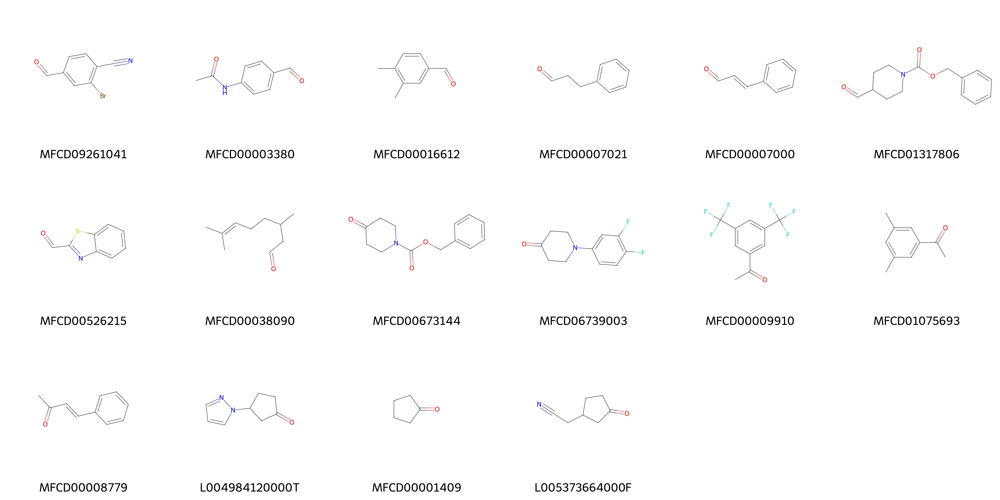

In [ ]:
display_molecules(unique_polymers,'Substrate SMILES', "Building Block")

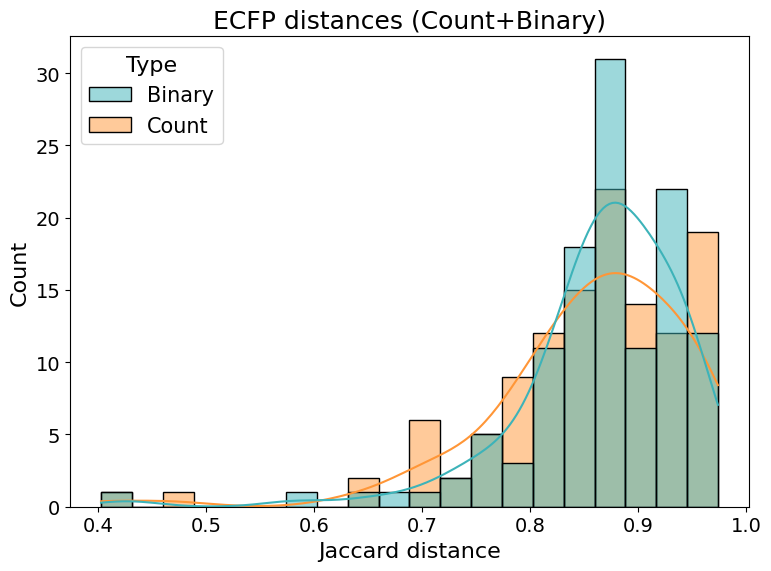

In [ ]:
binary_array = np.array(unique_polymers['Substrate_ECFP6_binary_512bits'].tolist())
count_array  = np.array(unique_polymers['Substrate_ECFP6_count_512bits'].tolist())

# Compute pairwise distances
binary_tanimoto_similarities = pdist(binary_array, metric="jaccard")
count_tanimoto_similarities  = pdist(count_array, metric=weighted_jaccard)

# Build dataframe
data = pd.DataFrame({
    "Similarity": np.concatenate([binary_tanimoto_similarities, count_tanimoto_similarities]),
    "Type": (["Binary"] * len(binary_tanimoto_similarities)) +
            (["Count"] * len(count_tanimoto_similarities))
})

palette = {"Binary": "#3DB3B9", "Count": "#FF9637"}

# Plot
plt.figure(figsize=(8, 6))
sns.histplot(data=data, x="Similarity", hue="Type", kde=True, bins=20, palette=palette)
plt.title("ECFP distances (Count+Binary)")
plt.xlabel("Jaccard distance")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

In [ ]:
processed_data

,Plate Location,Row,Column,Sample Name,Core SMILES,Building Block,Substrate SMILES,Product ID,Pdt Mass,Pdt Formula,...,UV254_PhPh AreaAbs,UV254_ReductiveAmination Rt(min),UV254_ReductiveAmination AreaAbs,UV254_CarbonylReduction Rt(min),UV254_CarbonylReduction AreaAbs,Pdt-to-IS Ratio,Approx. % Conv.,Reaction Conc [mM],Substrate_ECFP6_count_512bits,Substrate_ECFP6_binary_512bits
0,2,A,1,0378493_0147_DMA_001,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)n3c4ccccc4...,MFCD09261041,Brc1cc(C=O)ccc1C#N,Staur01,659.15320,C36H30BrN5O3,...,15199.58174,1.239,51465.46389,0.0,0.0,3.385979,89,100.0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
1,2,A,2,0378493_0147_DMA_002,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)n3c4ccccc4...,MFCD09261041,Brc1cc(C=O)ccc1C#N,Staur01,659.15320,C36H30BrN5O3,...,14223.43818,1.239,14033.69505,0.0,0.0,0.986660,46,100.0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
2,2,A,3,0378493_0147_DMA_003,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)n3c4ccccc4...,MFCD09261041,Brc1cc(C=O)ccc1C#N,Staur01,659.15320,C36H30BrN5O3,...,11031.95486,1.239,9255.72638,0.0,0.0,0.838992,7,100.0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
3,2,A,4,0378493_0147_DMA_004,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)n3c4ccccc4...,MFCD09261041,Brc1cc(C=O)ccc1C#N,Staur01,659.15320,C36H30BrN5O3,...,12232.56037,1.238,10144.10890,0.0,0.0,0.829271,11,100.0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
4,2,A,5,0378493_0147_DMA_005,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)n3c4ccccc4...,MFCD09261041,Brc1cc(C=O)ccc1C#N,Staur01,659.15320,C36H30BrN5O3,...,9503.90811,1.239,19986.07277,0.0,0.0,2.102932,89,100.0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
763,3,P,20,0378493_0147_NMP_764,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)n3c4ccccc4...,L005373664000F,O=C1CCC(CC#N)C1,Staur16,573.27399,C35H35N5O3,...,12510.28476,0.710,2683.49025,0.0,0.0,0.214503,1,50.0,"[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, ...","[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, ..."
764,3,P,21,0378493_0147_NMP_765,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)n3c4ccccc4...,L005373664000F,O=C1CCC(CC#N)C1,Staur16,573.27399,C35H35N5O3,...,11795.82216,0.709,10829.47566,0.0,0.0,0.918077,7,50.0,"[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, ...","[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, ..."
765,3,P,22,0378493_0147_NMP_766,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)n3c4ccccc4...,L005373664000F,O=C1CCC(CC#N)C1,Staur16,573.27399,C35H35N5O3,...,13019.34380,0.708,14947.87064,0.0,0.0,1.148128,10,50.0,"[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, ...","[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, ..."
766,3,P,23,0378493_0147_NMP_767,CN[C@@H]1C[C@H]2O[C@@](C)([C@@H]1OC)n3c4ccccc4...,L005373664000F,O=C1CCC(CC#N)C1,Staur16,573.27399,C35H35N5O3,...,13658.78029,0.710,21942.06849,0.0,0.0,1.606444,12,50.0,"[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, ...","[0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, ..."


In [ ]:
processed_data.to_pickle(dataset_folder/'cleaned_suzuki_synthesis.pkl')
processed_data.to_csv(dataset_folder/'cleaned_suzuki_synthesis.csv')

##Modeling tools

##Get results and analyze

#__OLD_MODEL

Tools

In [ ]:
def split_for_training(
    data: Union[pd.DataFrame, np.ndarray,pd.Series], indices: np.ndarray
) -> Union[pd.DataFrame, np.ndarray, pd.Series]:
    if isinstance(data, pd.DataFrame):
        split_data = data.iloc[indices]
    elif isinstance(data, np.ndarray):
        split_data = data[indices]
    elif isinstance(data, pd.Series):
        split_data = data.iloc[indices]
    else:
        raise ValueError("Data must be either a pandas DataFrame, Series, or a numpy array.")
    return split_data


def remove_unserializable_keys(d: Dict) -> Dict:
    """Remove unserializable keys from a dictionary."""
    new_d: dict = {k: v for k, v in d.items() if
                   isinstance(v, (str, int, float, bool, None, np.floating, np.integer))}
    return new_d


def _optimize_hyperparams(
    X, y,
    model: Pipeline,
    search_space:dict,
    seed: int=42,
    n_iter:int=15,
    scoring:Union[str,Callable]="neg_mean_squared_error"
    ) -> tuple:

    o_cv = KFold(n_splits=5, shuffle=True, random_state=seed)
    # Splitting for outer cross-validation loop
    estimators: list[BayesSearchCV] = []
    model = clone(model)
    for train_index, _ in o_cv.split(X, y):

        X_train = split_for_training(X, train_index)
        y_train = split_for_training(y, train_index)
        # print(X_train)
        # Splitting for inner hyperparameter optimization loop
        # cv_inner = KFold(n_splits=N_FOLDS, shuffle=True, random_state=seed)
        print("\n\n")
        print(
            "OPTIMIZING HYPERPARAMETERS", "\tSEED:", seed
        )
        # Bayesian hyperparameter optimization
        bayes = BayesSearchCV(
            model,
            search_space,
            n_iter=n_iter,
            cv=o_cv,
            n_jobs=-1,
            random_state=seed,
            refit=True,
            scoring=scoring,
            return_train_score=True,
        )
        bayes.fit(X_train, y_train)

        print(f"\n\nBest parameters: {bayes.best_params_}\n\n")
        estimators.append(bayes)

    best_idx: int = np.argmax([est.best_score_ for est in estimators])
    best_estimator: Pipeline = estimators[best_idx].best_estimator_
    try:
        regressor_params: dict = best_estimator.named_steps.regressor.get_params()
        regressor_params = remove_unserializable_keys(regressor_params)
    except:
        regressor_params = {"bad params": "couldn't get them"}

    return best_estimator, regressor_params

In [ ]:
seeds = [6, 13, 42, 69]

def estimate_model_performance(
                               features,
                               target,
                               pipeline,
                               search_space=None,
                               scoring_method:str="neg_mean_squared_error",
                               hp_opt:bool=False,
                               n_splits=5):

  results = {"test": [], "train": [], "estimator": []}

  for seed in seeds:
    cv_splits = KFold(n_splits=n_splits, shuffle=True, random_state=seed)

    pipeline = clone(pipeline)



    if hp_opt:
      best_estimator, regressor_params =  _optimize_hyperparams(
                                            features,
                                            target,
                                            pipeline,
                                            search_space=search_space,
                                            seed=seed,
                                            n_iter=20,
                                            scoring=scoring_method
                                            )

    else:
      best_estimator = pipeline

    cv_results = cross_validate(
        best_estimator,
        features, target,
        cv=cv_splits,
        scoring=scoring_method,
        return_train_score=True,
        return_estimator=True
    )
    results["test"].extend(cv_results["test_score"])
    results["train"].extend(cv_results["train_score"])
    results["estimator"].extend(cv_results["estimator"])

  test_r2_avg = np.mean(results["test"])
  test_r2_std = np.std(results["test"])
  train_r2_avg = np.mean(results["train"])
  train_r2_std = np.std(results["train"])
  print(f"Train R²: {train_r2_avg:.2f} ± {train_r2_std:.2f}")
  print(f"Test R²: {test_r2_avg:.2f} ± {test_r2_std:.2f}")

  return results


def get_optimal_params(top_params):
  print("\n\n")
  print("Optimal parameters")

  optimal_params = {k: [] for k in top_params.keys()}
  for key, value in top_params.items():
    param, count = scipy.stats.mode(value)
    print(f"{key}: {param}, count: {count} ({100*count/(len(value)):0.0f}%)")
    optimal_params[key] = param

  return optimal_params


def get_top_avg_params(top_params):
  print("\n\n")
  print("Optimal parameters")

  optimal_params = {k: [] for k in top_params.keys()}
  for key, value in top_params.items():
    param = np.nanmean(value)
    print(f"{key}: {param}")
    optimal_params[key] = param

  return optimal_params




In [ ]:
!pip install ngboost

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 349.3/349.3 kB 17.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.2/117.2 kB 5.9 MB/s eta 0:00:00
  Created wheel for autograd-gamma: filename=autograd_gamma-0.5.0-py3-none-any.whl size=4030 sha256=d61efd625aacfa76802907d8c43a4aabc2e010d205ffc160541405c3221c7a61
  Stored in directory: /root/.cache/pip/wheels/8b/67/f4/2caaae2146198dcb824f31a303833b07b14a5ec863fb3acd7b
Successfully built autograd-gamma


In [ ]:
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier, HistGradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
from xgboost import XGBRegressor, XGBClassifier
from ngboost import NGBRegressor

from skopt.space import Real, Integer, Categorical

def _generate_model(model_name, random_state=42, kernel=None, **kwargs):
    if model_name == "MLR":
        model = LinearRegression()
        param_grid = {
            "regressor__regressor__fit_intercept": [True, False]
        }
        return model, param_grid

    if model_name == "SVR":
        model = SVR()
        param_grid = {
            "regressor__kernel": Categorical(["linear", "rbf"]),
        }
        return model, param_grid

    if model_name == "Lasso":
        model = Lasso()
        param_grid = {
            "regressor__alpha": Real(1e-3, 1e3, prior="log-uniform"),
            "regressor__fit_intercept": [True, False],
            "regressor__selection": Categorical(["cyclic", "random"]),
        }
        return model, param_grid

    if model_name == "RF":
        model = RandomForestRegressor(
            n_estimators=100, max_depth=None,
            max_features="sqrt",
            random_state=random_state, n_jobs=-1, **kwargs
        )
        param_grid = {
            "regressor__regressor__n_estimators": Integer(10, 2000, prior="log-uniform"),
            "regressor__regressor__max_depth": [None],
            "regressor__regressor__min_samples_split": Real(0.001, 0.99),
            "regressor__regressor__min_samples_leaf": Real(0.001, 0.99),
            "regressor__regressor__max_features": Categorical(["sqrt", "log2", None]),
        }
        return model, param_grid

    if model_name == "XGBR":
        model = XGBRegressor(
            eval_metric="rmse",
            random_state=random_state,
            n_jobs=-1, **kwargs
        )
        param_grid = {
            "regressor__regressor__n_estimators": Integer(50, 2000, prior="log-uniform"),
            "regressor__regressor__max_depth": Integer(10, 10000, prior="log-uniform"),
            "regressor__regressor__n_jobs": [-2],
            "regressor__regressor__learning_rate": Real(1e-4, 1e-1, prior="log-uniform"),
        }
        return model, param_grid

    if model_name == "DT":
        model = DecisionTreeRegressor()
        param_grid = {
            "regressor__regressor__min_samples_split": Real(0.05, 0.99),
            "regressor__regressor__min_samples_leaf": Real(0.05, 0.99),
            "regressor__regressor__max_features": Categorical([None, "sqrt", "log2"]),
            "regressor__regressor__max_depth": [None],
            "regressor__regressor__ccp_alpha": Real(0.05, 0.99),
        }
        return model, param_grid

    if model_name == "NGB":
        model = NGBRegressor(random_state=random_state, verbose=False, n_jobs=-1,**kwargs)
        param_grid = {
            "regressor__regressor__n_estimators": Integer(50, 2000, prior="log-uniform"),
            "regressor__regressor__learning_rate": Real(1e-4, 1e-1, prior="log-uniform"),
            "regressor__regressor__natural_gradient": [True],
            "regressor__regressor__verbose": [False],
            "regressor__regressor__tol": Real(1e-4, 1e-2, prior="log-uniform"),
        }
        return model, param_grid

    if model_name == "MLP":
        model = MLPRegressor(max_iter=200)
        param_grid = {
            "regressor__regressor__learning_rate_init": Real(1e-5, 1e-1, prior="log-uniform"),
            "regressor__regressor__alpha": Real(1e-8, 1e-6, prior="log-uniform"),
            "regressor__regressor__batch_size": Categorical([32, 64, 128, 256]),
            # "regressor__regressor__max_iter": [200],
        }
        return model, param_grid

    if model_name == "HGBR":
        model = HistGradientBoostingRegressor(
            max_depth=None,
            scoring='neg_root_mean_squared_error',
            random_state=random_state, **kwargs
        )
        # You can define and return a param_grid here if needed
        return model, None

    if model_name == "sklearn-GPR":
        model = GaussianProcessRegressor(random_state=random_state, **kwargs)
        if kernel == 'rbf':
            param_grid = {
                "regressor__regressor__kernel__length_scale": Real(0.05, 3.0),
            }
        elif kernel == 'matern':
            param_grid = {
                "regressor__regressor__n_restarts_optimizer": [25],
                "regressor__regressor__kernel__nu": Real(0.5, 2.5),
                "regressor__regressor__kernel__length_scale": Real(0.05, 3.0),
            }
        else:
            param_grid = None
        return model, param_grid

    return None, None


### Linear models

In [ ]:
['Reduction Temperature (K)',
 'Reduction Time (h)',
 'Feed Flow rate(ml/min)',
 'BET Surface (m2/g)',
 'C3H8 ratio in feed',
 'WHSV (1/h)',
 'Catalyts Loading (g)',
 'Particle Size (nm)',
 'P (bar)',
 'Calcination Temp (K)',
 'Calcination Time (h)',
 'Promoter1 content (M-wt %)',
 'T (K)',
 'Time (h)',
 'Active phase content (wt%)',
 'WHSV (1/h)_computed']

In [ ]:
y_sty_end = imputed_working['ln(STY_end)']
y_r_end = imputed_working['ln(r_end)']

X_imp = imputed_working[all_numericals+[""]]

In [ ]:
linear_preprocess = ColumnTransformer(transformers=[
    ("continuous", RobustScaler(), all_numericals),
    # ("time_day", time_scaler, ["time of day"]),
    # ("day_week", week_scaler, ["day of week"]),
    # ("categorical", OneHotEncoder(), ["location", "electrode"])
])

Train MLR

In [ ]:
ml_regressor,rf_hp = _generate_model("RF")
transformed_regressor = TransformedTargetRegressor(
    regressor=ml_regressor,
    transformer=RobustScaler()
)

ml_pipeline = Pipeline([
    ("feature_scaling", linear_preprocess),
    ("regressor", transformed_regressor)
  ])


MLR_resulg= estimate_model_performance(pipeline=ml_pipeline,
                                       features=X_imp,
                                       target=y_sty_end,
                                       hp_opt=False,
                                      #  search_space=rf_hp,
                                       scoring_method="r2")
# def estimate_model_performance(pipeline,
#                                features,
#                                target,
#                                search_space,
#                                scoring_method:str="neg_mean_squared_error",
#                                hp_opt:bool=False,
#                                n_splits=5):

# model = calculate_total_r2_score(ordinal_lasso_pipeline, features=X_baseline, heterosked_model=True)

# regressor = model.named_steps["model"].regressor_
# print(f"alpha {regressor.alpha_:0.2f}\tintercept{regressor.intercept_:0.2f}")

# # for feat_name, coef in zip(model.named_steps["feature_scaling"].get_feature_names_out(), regressor.coef_):
# #   print(f"{feat_name}: {coef:0.2f}")

# draw_feature_importance(model.named_steps["feature_scaling"].get_feature_names_out(), regressor.coef_,figsize=(5,5))

Train R²: 0.97 ± 0.00
Test R²: 0.83 ± 0.04


In [ ]:
rf_hp

{'regressor__regressor__n_estimators': Integer(low=10, high=2000, prior='log-uniform', transform='identity'),
 'regressor__regressor__max_depth': [None],
 'regressor__regressor__min_samples_split': Real(low=0.001, high=0.99, prior='uniform', transform='identity'),
 'regressor__regressor__min_samples_leaf': Real(low=0.001, high=0.99, prior='uniform', transform='identity'),
 'regressor__regressor__max_features': Categorical(categories=('sqrt', 'log2', None), prior=None)}

In [ ]:
# add shap values

Train RF